# **Data Science and Engineering Methods**

**Name : Shreyas Madhusudan Dasari**

**NUID : 002743612**

# **Combine Data Cleaning, Feature Selection, Modeling and Interpretability into one report**

# **Abstract :**
The objective is to evaluate a dataset on diabetes prediction using diagnostic measures. The data includes details on a number of measurements, including body mass index, blood pressure, and insulin levels. The following topics are addressed using statistical techniques like p-value and t-statistics as well as visualization methods like histograms, Q-Q plots, line plots, and box plots using Python's matplotlib and seaborn libraries.

# **Aim :**

To combine Data Cleaning, Feature Selection, Modeling and Interpretability into one report.


# **DataSet**

The data set consists of :

8 diagnostic measures to predict diabetes i.e. 'cholesterol', 'glucose', 'hdl_chol', 'age', 'height', 'weight', 'systolic_bp', 'diastolic_bp' - The independent variables

Diabetes - The dependent variable

The category of diabetes ranges from 0(No) to 1(Yes)

There are a total of 390 observations



In [121]:
# Importing all libraries necessary for the assignment
!pip install shap
!pip install lime
!pip install requests
!pip install tabulate
!pip install "colorama>=0.3.8"
!pip install future
!pip install h2o
!pip install --upgrade scikit-learn


import pandas as pd
import shap
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OrdinalEncoder, StandardScaler, OneHotEncoder
from sklearn_pandas import DataFrameMapper
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
import statsmodels.api as sm
import numpy as np
import matplotlib.pyplot as plt
import lime
from lime import lime_tabular
import random
from sklearn.ensemble import RandomForestRegressor
from sklearn.inspection import PartialDependenceDisplay
from sklearn.inspection import partial_dependence
from matplotlib.pyplot import figure
from sklearn.tree import export_graphviz
import pydot
import matplotlib.image as mpimg
import h2o
from h2o.automl import H2OAutoML
from h2o.estimators.gbm import H2OGradientBoostingEstimator
from h2o.grid.grid_search import H2OGridSearch
import random, os, sys
from datetime import datetime
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
from matplotlib.pyplot import figure
import numpy as np
import pandas as pd
import matplotlib.pylab as plt
import seaborn as sns

plt.rcParams["figure.figsize"] = (32, 24)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [122]:
# Setting up maximum runtime for the AutoML
min_mem_size = 6
run_time = 222

In [123]:
pct_memory = 0.5
virtual_memory = psutil.virtual_memory()
min_mem_size = int(round(int(pct_memory * virtual_memory.available) / 1073741824, 0))
print(min_mem_size)

4


In [124]:
# 65535 Highest port no
# Start the H2O server on a random port
port_no = random.randint(5555, 55555)

#  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
try:
    h2o.init(
        strict_version_check=False, min_mem_size_GB=min_mem_size, port=port_no
    )  # start h2o
except:
    logging.critical("h2o.init")
    h2o.download_all_logs(dirname=logs_path, filename=logfile)
    h2o.cluster().shutdown()
    sys.exit(2)

Checking whether there is an H2O instance running at http://localhost:26905..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.18" 2023-01-17; OpenJDK Runtime Environment (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1); OpenJDK 64-Bit Server VM (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.9/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpcwip5yz9
  JVM stdout: /tmp/tmpcwip5yz9/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpcwip5yz9/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:26905
Connecting to H2O server at http://127.0.0.1:26905 ... successful.


H2O_cluster_uptime:,07 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.40.0.3
H2O_cluster_version_age:,5 days
H2O_cluster_name:,H2O_from_python_unknownUser_oonm9k
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,4 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


# **What question are you trying to answer? How did you frame it as an ML task?**


Using diagnostic tests, I'm attempting to determine whether diabetes will be present or not. In order to construct a model that can precisely predict if a patient has diabetes based on these diagnostic measurements, I have framed this as a machine learning challenge.

I am working with a traditional binary classification problem because the target variable in this scenario is binary (diabetes or no diabetes). In order to effectively classify patients into one of these two groups based on their diagnostic measurements, I need to build a machine learning model.

# **What is human-level performance on that task? What level of performance is needed?**

Generally speaking, human-level performance refers to the output of a human specialist in the relevant field. The human-level performance for this specific activity could differ based on the medical expert's experience and the precise diagnostic techniques used.

The required level of performance for this activity will vary depending on the particular context and the effects of false positives and false negatives. False negatives, which indicate that a patient does not have diabetes when in fact they do, can be particularly troublesome in the medical setting since they can result in delayed diagnosis and treatment, which can seriously harm the patient's health. In order to achieve high sensitivity in the classification model while simultaneously ensuring a sufficient level of specificity. In general, the objective should be to minimize false positives and false negatives while achieving a high overall accuracy.

# **Reading the Dataset**

In [125]:
df = pd.read_csv("https://raw.githubusercontent.com/ShreyasDasari/Data-Science-and-ML/main/ML%20Data%20Cleaning%20and%20Feature%20Selection/diabetes.csv")

In [126]:
#Description of the data type
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 390 entries, 0 to 389
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   patient_number   390 non-null    int64 
 1   cholesterol      390 non-null    int64 
 2   glucose          390 non-null    int64 
 3   hdl_chol         390 non-null    int64 
 4   chol_hdl_ratio   390 non-null    object
 5   age              390 non-null    int64 
 6   gender           390 non-null    object
 7   height           390 non-null    int64 
 8   weight           390 non-null    int64 
 9   bmi              390 non-null    object
 10  systolic_bp      390 non-null    int64 
 11  diastolic_bp     390 non-null    int64 
 12  waist            390 non-null    int64 
 13  hip              390 non-null    int64 
 14  waist_hip_ratio  390 non-null    object
 15  diabetes         390 non-null    object
dtypes: int64(11), object(5)
memory usage: 48.9+ KB


In [127]:
#Checking if the dataset has missing values
df.isnull().sum()

patient_number     0
cholesterol        0
glucose            0
hdl_chol           0
chol_hdl_ratio     0
age                0
gender             0
height             0
weight             0
bmi                0
systolic_bp        0
diastolic_bp       0
waist              0
hip                0
waist_hip_ratio    0
diabetes           0
dtype: int64

In [128]:
#Checking the dataset size
df.shape

(390, 16)

In [129]:
#Description of the dataset
df.describe()

,patient_number,cholesterol,glucose,hdl_chol,age,height,weight,systolic_bp,diastolic_bp,waist,hip
count,390.000000,390.000000,390.000000,390.000000,390.000000,390.000000,390.000000,390.000000,390.000000,390.000000,390.000000
mean,195.500000,207.230769,107.338462,50.266667,46.774359,65.951282,177.407692,137.133333,83.289744,37.869231,42.992308
std,112.727548,44.666005,53.798188,17.279069,16.435911,3.918867,40.407824,22.859528,13.498192,5.760947,5.664342
min,1.000000,78.000000,48.000000,12.000000,19.000000,52.000000,99.000000,90.000000,48.000000,26.000000,30.000000
25%,98.250000,179.000000,81.000000,38.000000,34.000000,63.000000,150.250000,122.000000,75.000000,33.000000,39.000000
50%,195.500000,203.000000,90.000000,46.000000,44.500000,66.000000,173.000000,136.000000,82.000000,37.000000,42.000000
75%,292.750000,229.000000,107.750000,59.000000,60.000000,69.000000,200.000000,148.000000,90.000000,41.000000,46.000000
max,390.000000,443.000000,385.000000,120.000000,92.000000,76.000000,325.000000,250.000000,124.000000,56.000000,64.000000


# **Description of the Dataset from above table**
1. A dataset with 390 observations and 13 variables is summarized in this table.

2. The "mean" row displays the average value of each variable, while the "count" row displays the total number of observations for each variable.

3. Each variable's standard deviation, a gauge of how much the values deviate from the mean, is displayed in the "std" row.

4. The "min" and "max" rows display the variables' smallest and maximum values, respectively.

5. The values at the 25th, 50th, and 75th percentiles of the distribution are displayed in the "25%", "50%," and "75%" rows, respectively.

6. The 25th percentile is the value below which 25% of the observations fall, and so on. These percentiles divide the observations into quarters.

# **Data Cleaning**

In [130]:
#Performing One Hot Encoding on gender feature
gender_encoded = pd.get_dummies(df['gender'], prefix='gender')
gender_encoded

,gender_female,gender_male
0,1,0
1,1,0
2,1,0
3,1,0
4,1,0
...,...,...
385,1,0
386,1,0
387,1,0
388,1,0


In [131]:
# Concatenate the encoded column with the original dataframe
df = pd.concat([df, gender_encoded], axis=1)
df.head()

,patient_number,cholesterol,glucose,hdl_chol,chol_hdl_ratio,age,gender,height,weight,bmi,systolic_bp,diastolic_bp,waist,hip,waist_hip_ratio,diabetes,gender_female,gender_male
0,1,193,77,49,"3,9",19,female,61,119,"22,5",118,70,32,38,"0,84",No diabetes,1,0
1,2,146,79,41,"3,6",19,female,60,135,"26,4",108,58,33,40,"0,83",No diabetes,1,0
2,3,217,75,54,4,20,female,67,187,"29,3",110,72,40,45,"0,89",No diabetes,1,0
3,4,226,97,70,"3,2",20,female,64,114,"19,6",122,64,31,39,"0,79",No diabetes,1,0
4,5,164,91,67,"2,4",20,female,70,141,"20,2",122,86,32,39,"0,82",No diabetes,1,0


In [132]:
#Converting diabetes feature into 0 and 1
df['is_diab'] = df['diabetes'].map({'Diabetes':1,'No diabetes':0})
df['is_diab']
df.head()

,patient_number,cholesterol,glucose,hdl_chol,chol_hdl_ratio,age,gender,height,weight,bmi,systolic_bp,diastolic_bp,waist,hip,waist_hip_ratio,diabetes,gender_female,gender_male,is_diab
0,1,193,77,49,"3,9",19,female,61,119,"22,5",118,70,32,38,"0,84",No diabetes,1,0,0
1,2,146,79,41,"3,6",19,female,60,135,"26,4",108,58,33,40,"0,83",No diabetes,1,0,0
2,3,217,75,54,4,20,female,67,187,"29,3",110,72,40,45,"0,89",No diabetes,1,0,0
3,4,226,97,70,"3,2",20,female,64,114,"19,6",122,64,31,39,"0,79",No diabetes,1,0,0
4,5,164,91,67,"2,4",20,female,70,141,"20,2",122,86,32,39,"0,82",No diabetes,1,0,0


In [133]:
#Dropping irrelevant fields
df.drop(['patient_number','chol_hdl_ratio','bmi','waist_hip_ratio','gender','diabetes'],inplace=True, axis=1)
df.head()

,cholesterol,glucose,hdl_chol,age,height,weight,systolic_bp,diastolic_bp,waist,hip,gender_female,gender_male,is_diab
0,193,77,49,19,61,119,118,70,32,38,1,0,0
1,146,79,41,19,60,135,108,58,33,40,1,0,0
2,217,75,54,20,67,187,110,72,40,45,1,0,0
3,226,97,70,20,64,114,122,64,31,39,1,0,0
4,164,91,67,20,70,141,122,86,32,39,1,0,0


<Figure size 500x300 with 0 Axes>

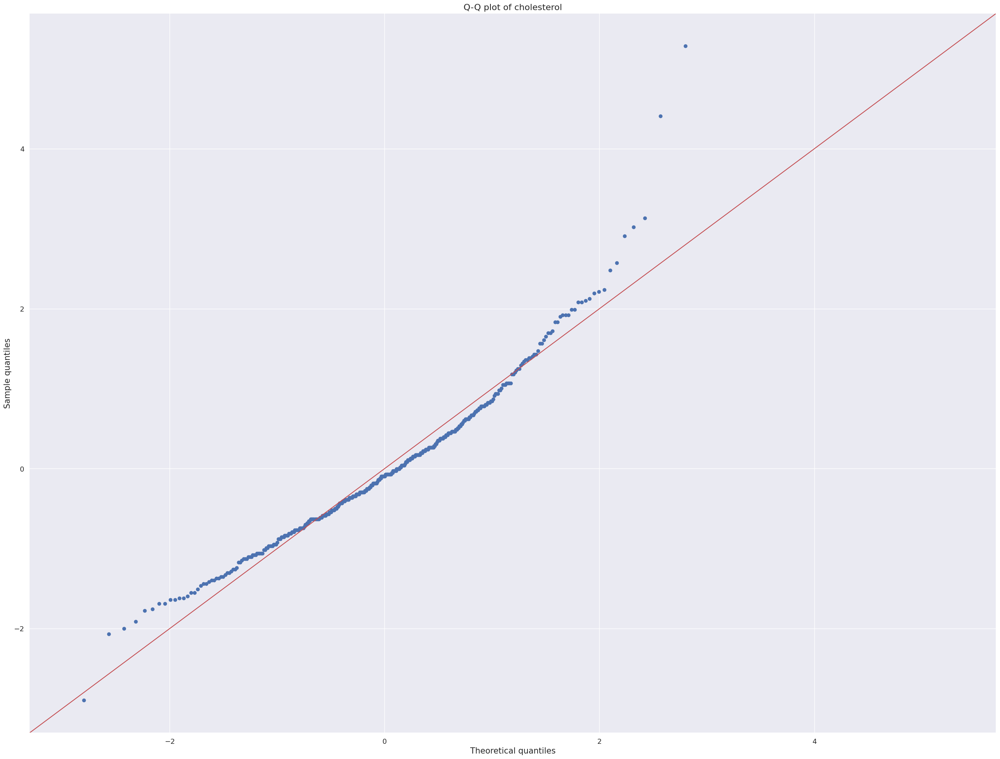

<Figure size 500x300 with 0 Axes>

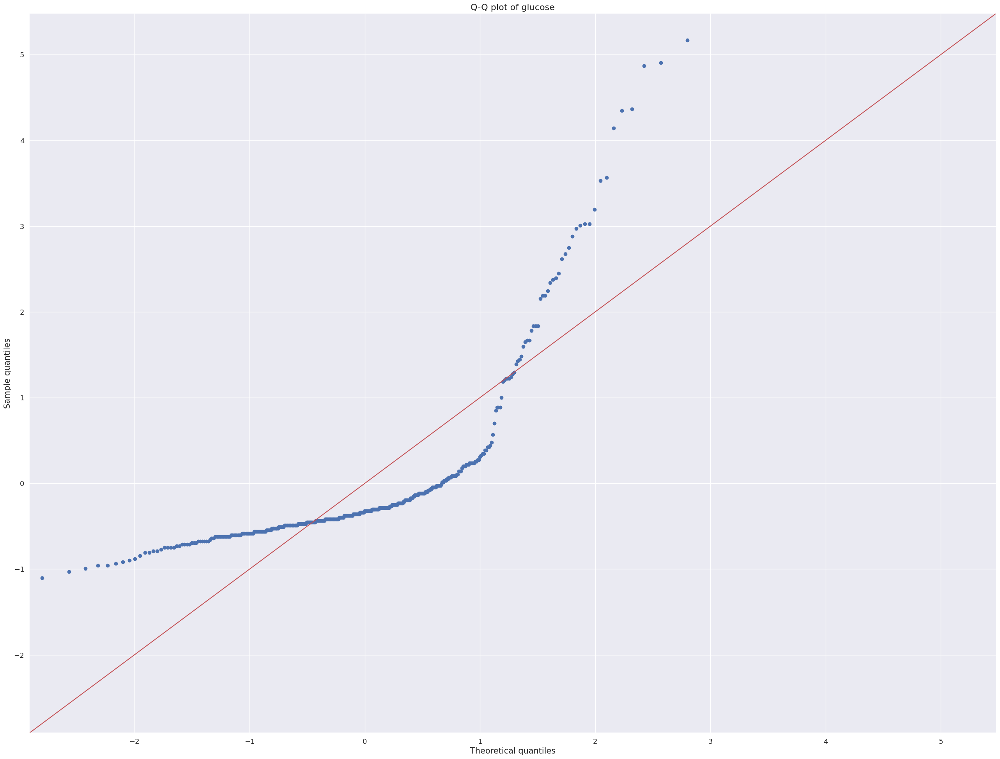

<Figure size 500x300 with 0 Axes>

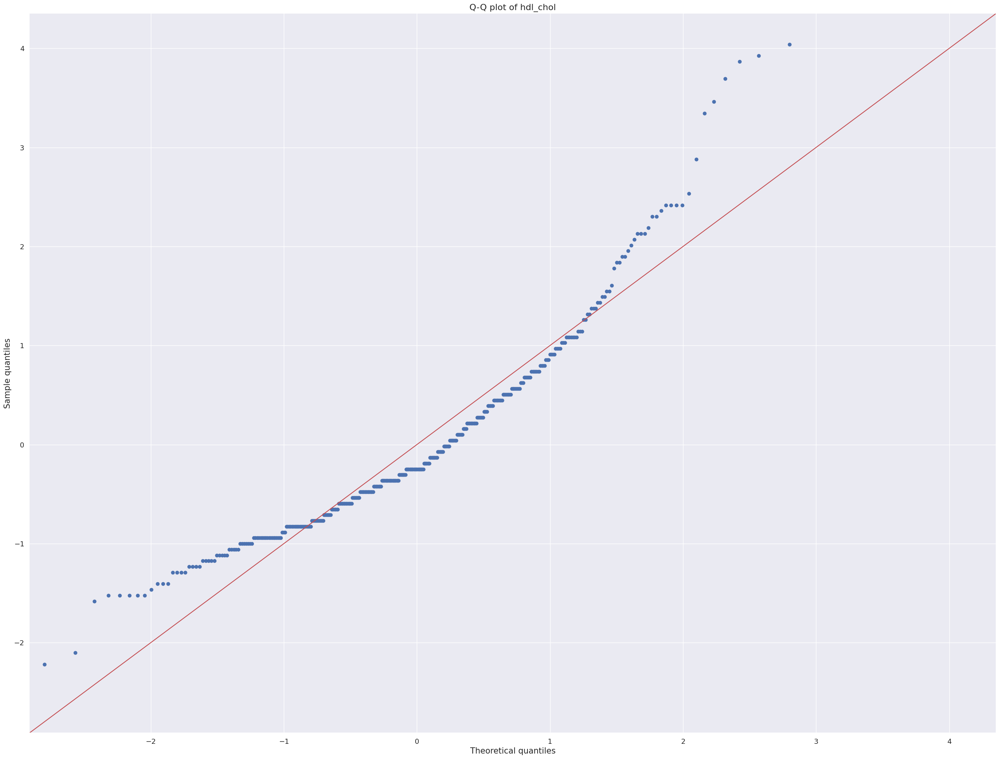

<Figure size 500x300 with 0 Axes>

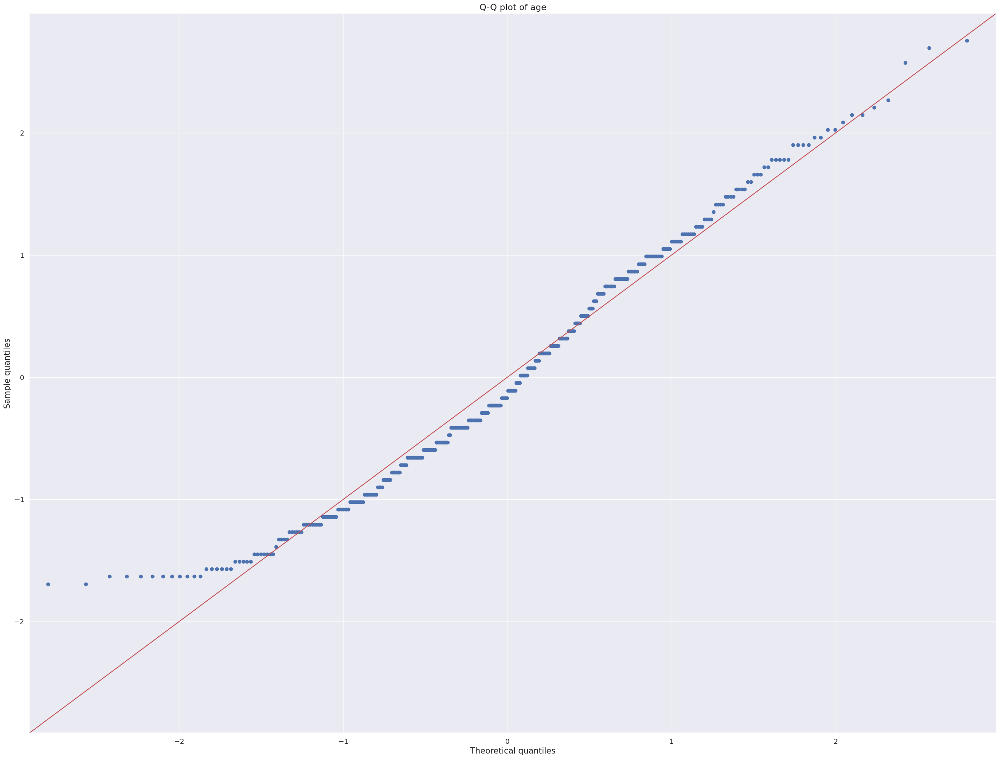

<Figure size 500x300 with 0 Axes>

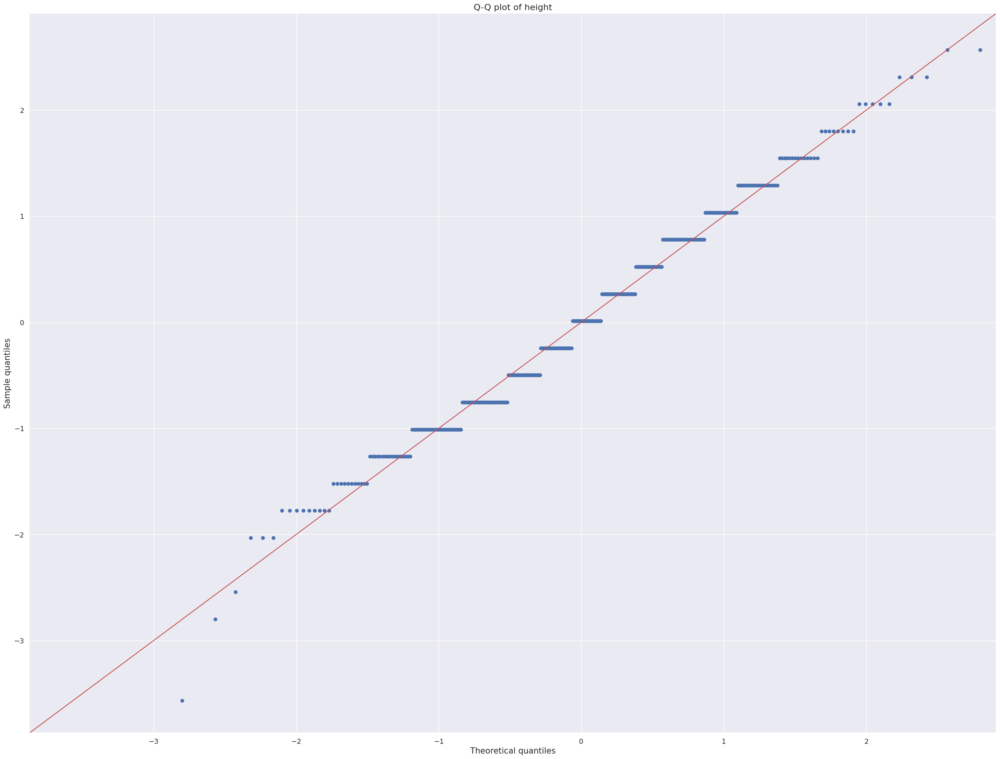

<Figure size 500x300 with 0 Axes>

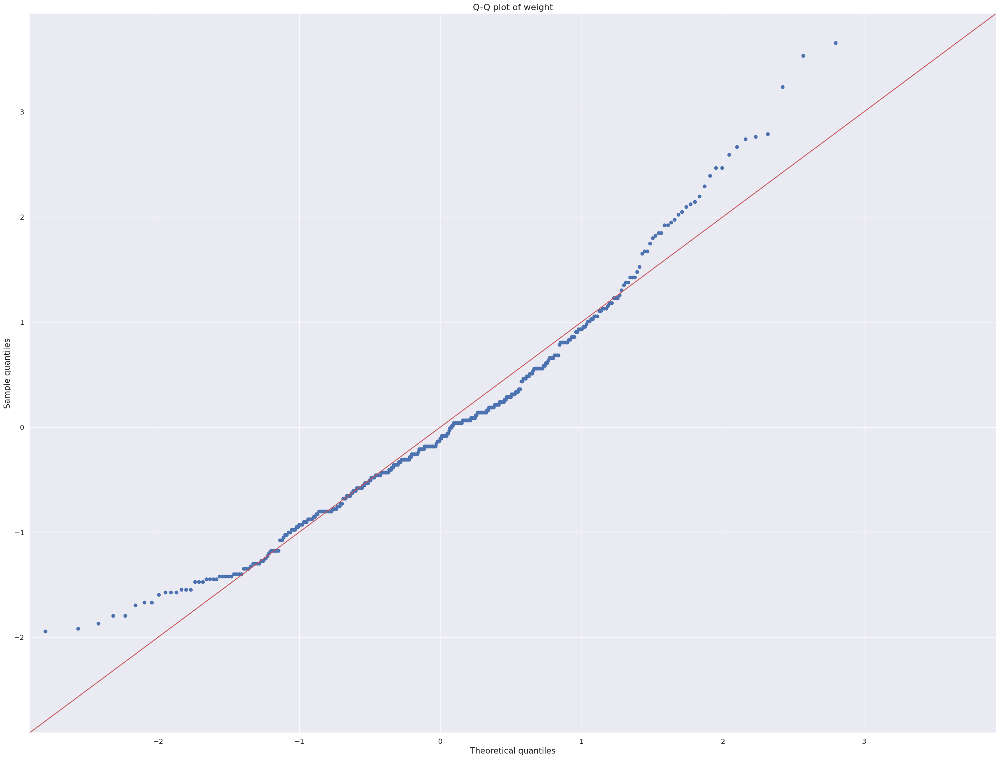

<Figure size 500x300 with 0 Axes>

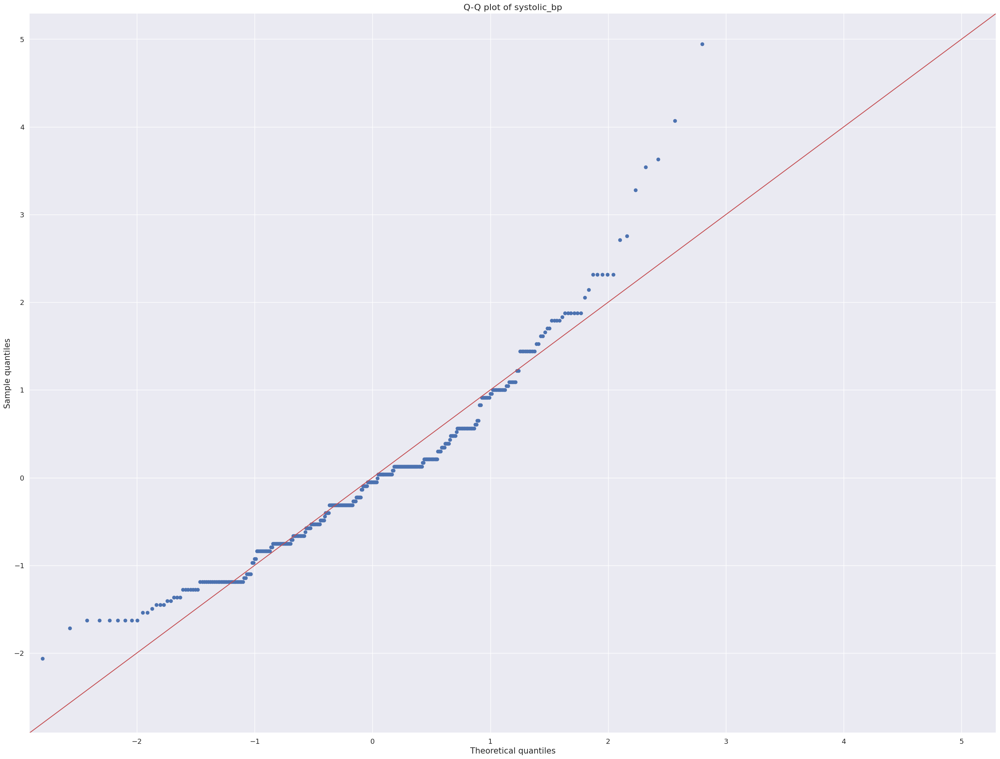

<Figure size 500x300 with 0 Axes>

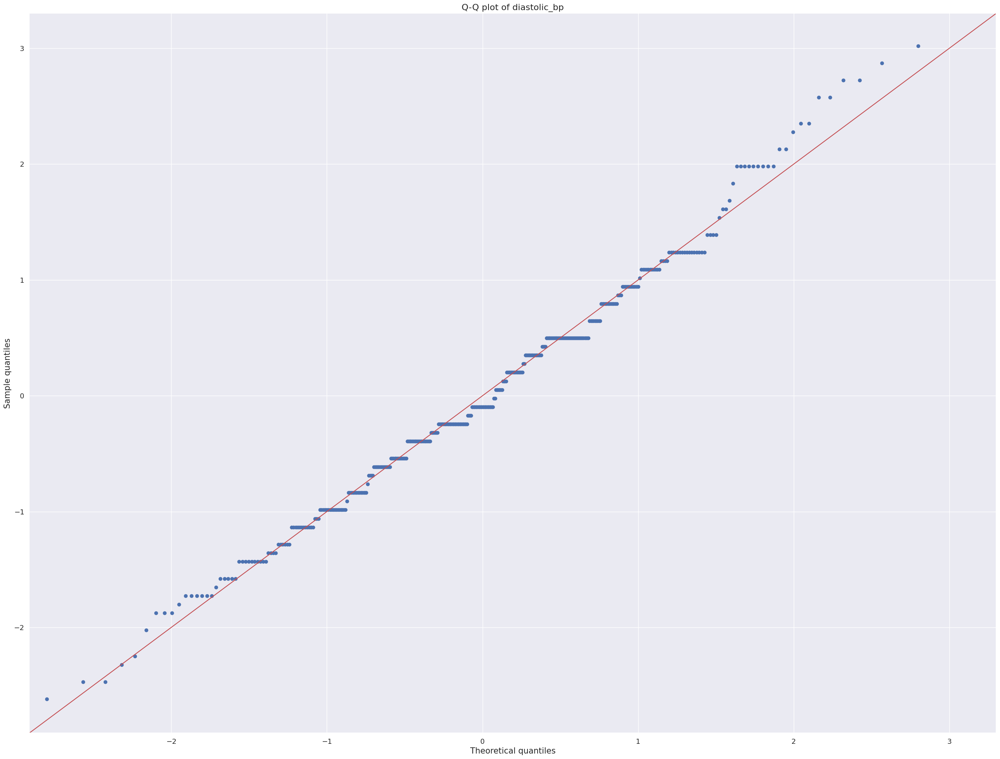

<Figure size 500x300 with 0 Axes>

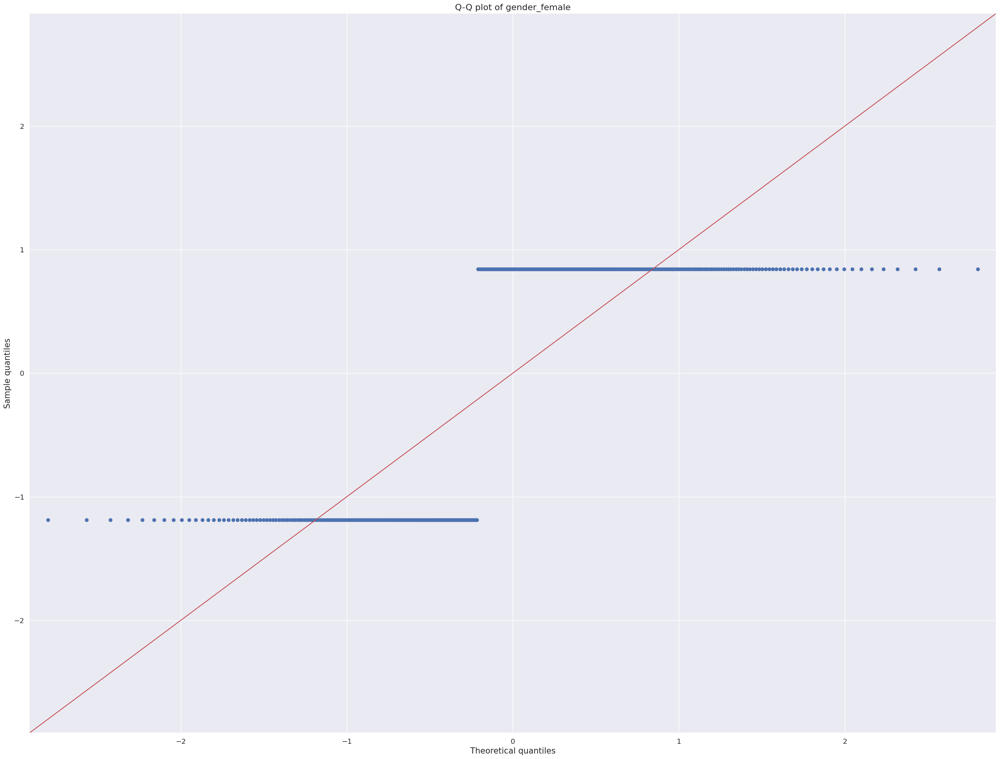

<Figure size 500x300 with 0 Axes>

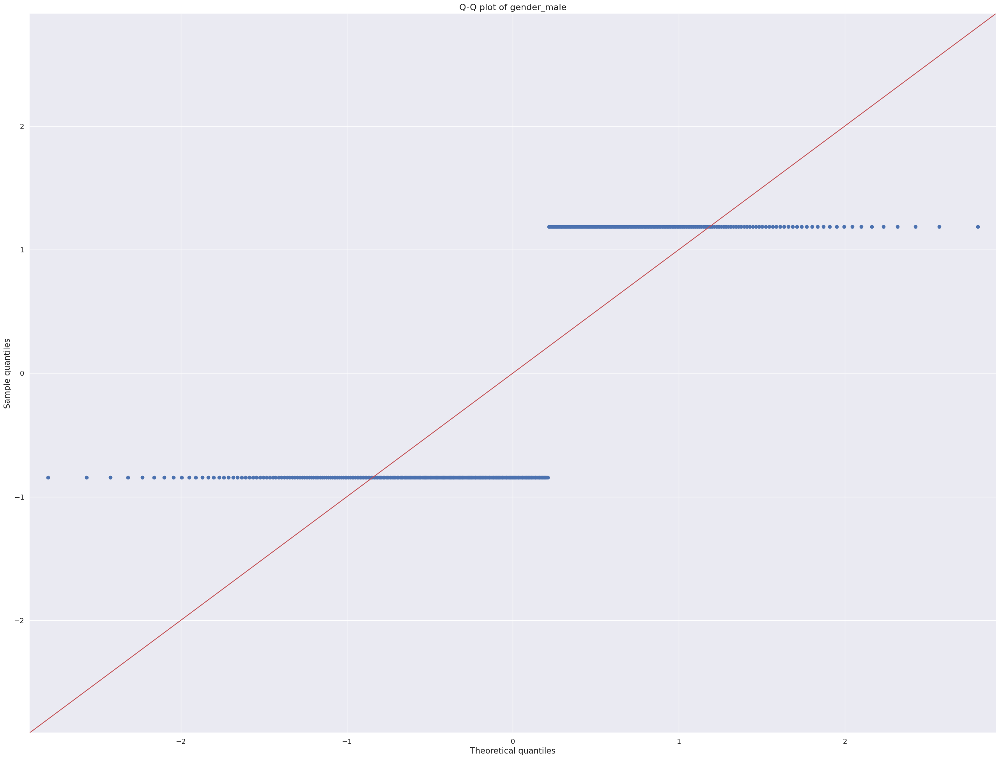

In [134]:
#Plotting qq-plot for all the features
from statsmodels.graphics.gofplots import qqplot
data = df[['cholesterol','glucose','hdl_chol','age','height','weight','systolic_bp','diastolic_bp','gender_female','gender_male']]
for c in data.columns[:]:
  plt.figure(figsize=(5,3))
  fig=qqplot(data[c],line='45',fit='True')
  plt.xticks(fontsize=13)
  plt.yticks(fontsize=13)
  plt.xlabel("Theoretical quantiles",fontsize=15)
  plt.ylabel("Sample quantiles",fontsize=15)
  plt.title("Q-Q plot of {}".format(c),fontsize=16)
  plt.grid(True)
  plt.show()

# **Quantile graphs Explanation from above figures**

1.   Looking at the Q-Q plot above, it appears that all independent variables are roughly following normal distribution except glucose.
2.   There are few outliers in few of the predictor variables like in glucose, Cholestrol, Weight, Diastolic_bp.



<Axes: >

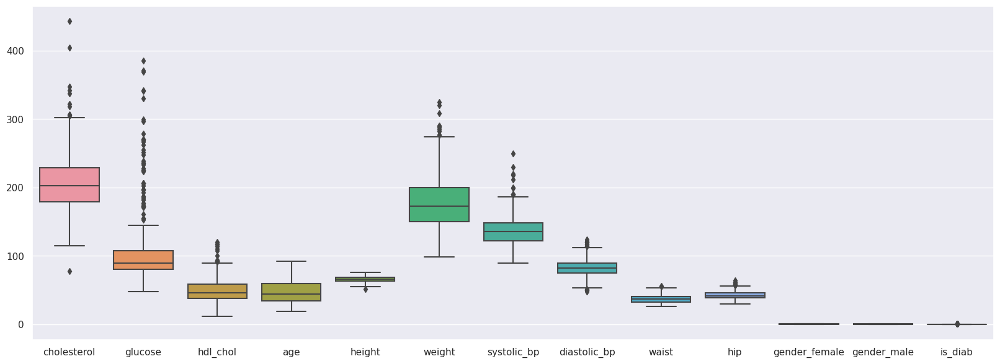

In [135]:
#Boxplot to identify outliers
plt.figure(figsize=(20,7))
sns.boxplot(data=df)

# **What kind of data exploration did you do?**

**Preliminary research results from the EDA.**

**Datatype Verification** : The dataset's characteristics are all integers or floats.

**Missing Data Check** : None of the features in our dataset had any missing values.

**Data distribution for the training dataset** : I examined the probability distribution of each and every feature.

**Correlation Check** : Heatmap and pairplot were used to do a correlation check on the dataset, and the results showed that there were some substantial multicolinearity problems.

**Box Plot Analysis** : Boxplot analysis was carried out to determine the impact of a variable on prediction of diabetes.

The aforementioned graphs provide a clear picture of how prediction of diabetes is evolving in relation to all of the important factors.


# **Feature Importance and Selection**

The process of choosing the characteristics that are pertinent to a machine learning model is known as feature selection. It entails choosing only those attributes that significantly influence the output of the model.

Think about the challenge of determining a student's course grade based solely on their academic performance. The number of completed assignments, the average grade on those assignments, attendance, study time, and the number of prior failures are all potential features for this work. For forecasting the target variable, some of these characteristics might be more important than others.

For instance, it can be discovered that the quantity of prior failures and the average grade on assignments are the most indicative factors, but the quantity of completed assignments and attendance are of less significance. In order to identify and keep only the most crucial information, such as the quantity of prior failures and the average grade on assignments, and toss out the less significant features, such as attendance and the number of assignments completed, feature selection can be used. This can decrease the complexity and processing demands of the prediction model while also increasing its accuracy and effectiveness.

In [136]:
X = df.iloc[:,:-1]
X.head()

,cholesterol,glucose,hdl_chol,age,height,weight,systolic_bp,diastolic_bp,waist,hip,gender_female,gender_male
0,193,77,49,19,61,119,118,70,32,38,1,0
1,146,79,41,19,60,135,108,58,33,40,1,0
2,217,75,54,20,67,187,110,72,40,45,1,0
3,226,97,70,20,64,114,122,64,31,39,1,0
4,164,91,67,20,70,141,122,86,32,39,1,0


In [137]:
y = df['is_diab']
y.head()

0    0
1    0
2    0
3    0
4    0
Name: is_diab, dtype: int64

<Axes: >

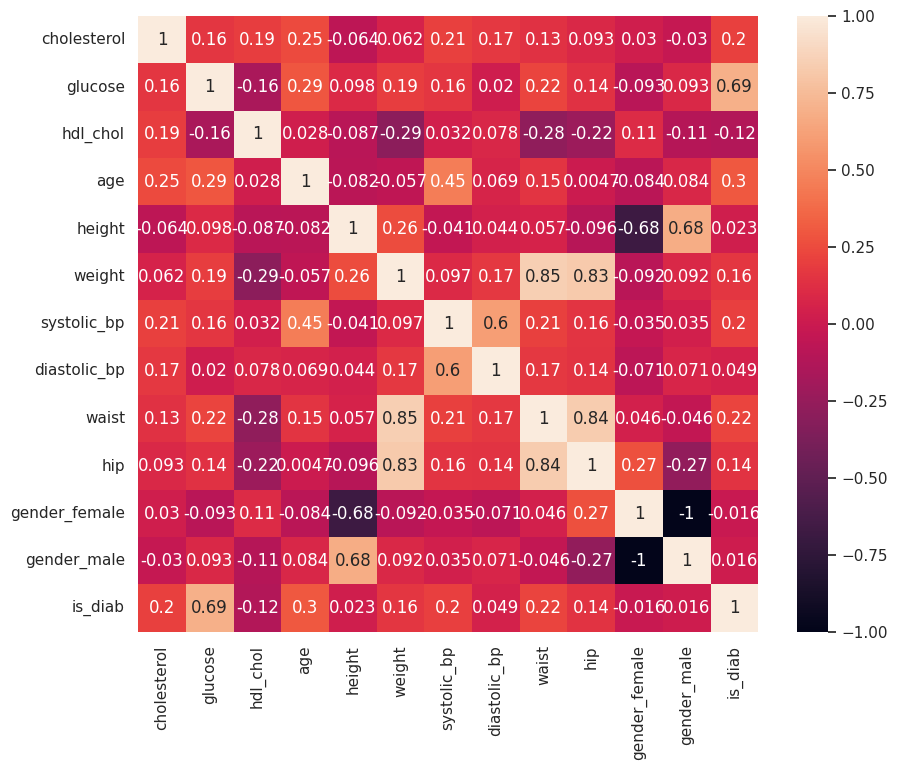

In [138]:
#Heatmap and correlation between variables in the dataset
sns.set(rc={"figure.figsize": (10, 8)})
sns.heatmap(df.corr(),annot=True)

# **Correlation Analysis**

A correlation coefficient, like the Pearson correlation coefficient, can be used to determine the correlation between two sets of variables. The range of values for this coefficient, which measures the linear relationship between two variables, is -1 (perfectly negative correlation) to 1. (perfect positive correlation). Zero means there is no correlation.

From the above heatmap we can infer:

1. Mostly all variables are independent of each other.
2. A few variables show multi-collinearity as waist, hip and weight. Also glucose and is_diab, gender_male and height closely resemble multi-collinearity as the value is close to 0.7

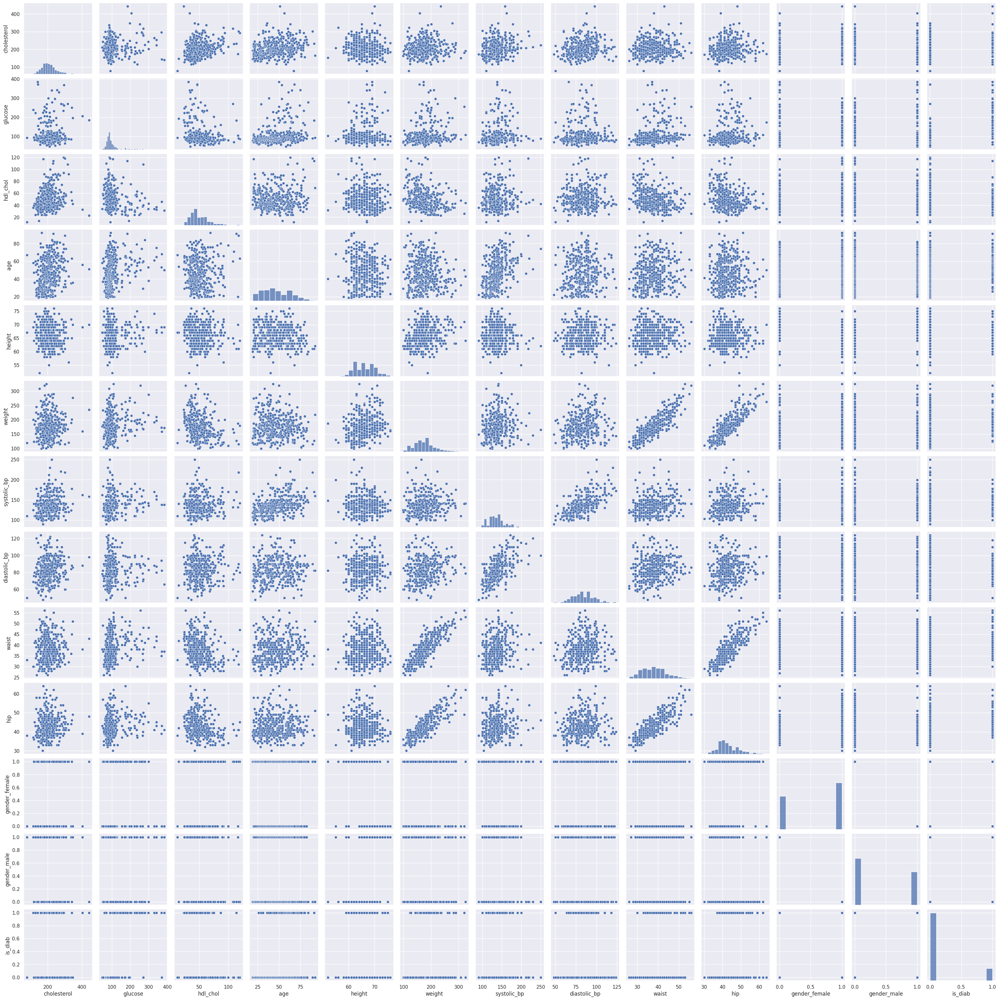

In [139]:
sns.pairplot(df)

# **Understanding the Pairplot and Analyzing Correlation between variables**

1. A pair plot shows the pairwise relationships between variables in a dataset graphically. For each pair of variables, scatter plots are shown.

2. If the histogram follows a bell curve then that particular variable follows a normal distribution and as per the above pairplot, **diastolic_bp, weight, waist** roughly follow normalization.

3. The scatter plots display the associations between different pairings of variables. When two variables are highly correlated, a strong linear relationship between them can be seen on the scatter plot. If there is no link between the variables, a random distribution of points will appear on the scatter plot. The pair plot can be used to find variables that strongly correlate positively or negatively. **Glucose with respect to other variables show random distribution**.

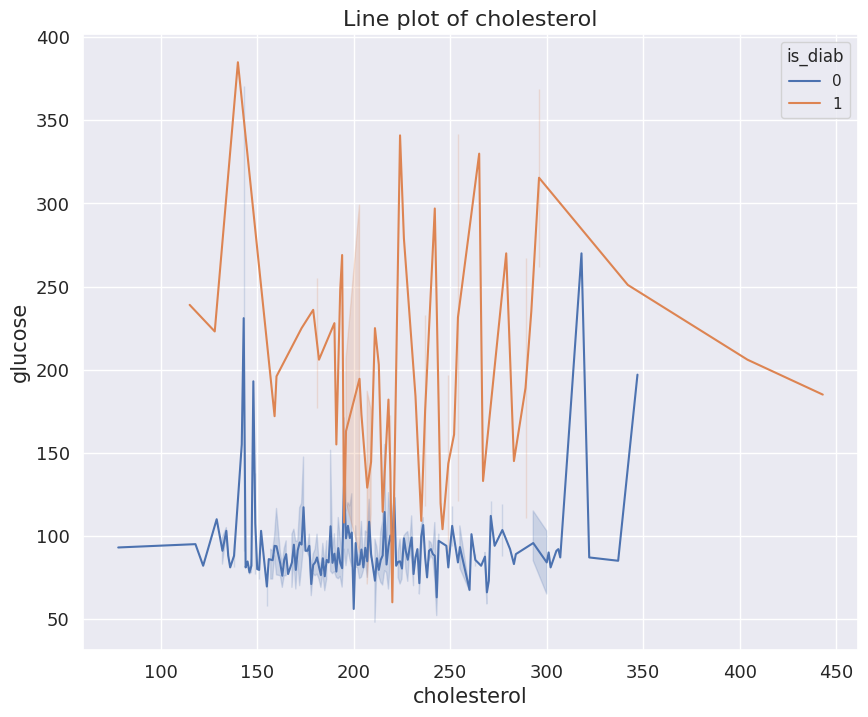

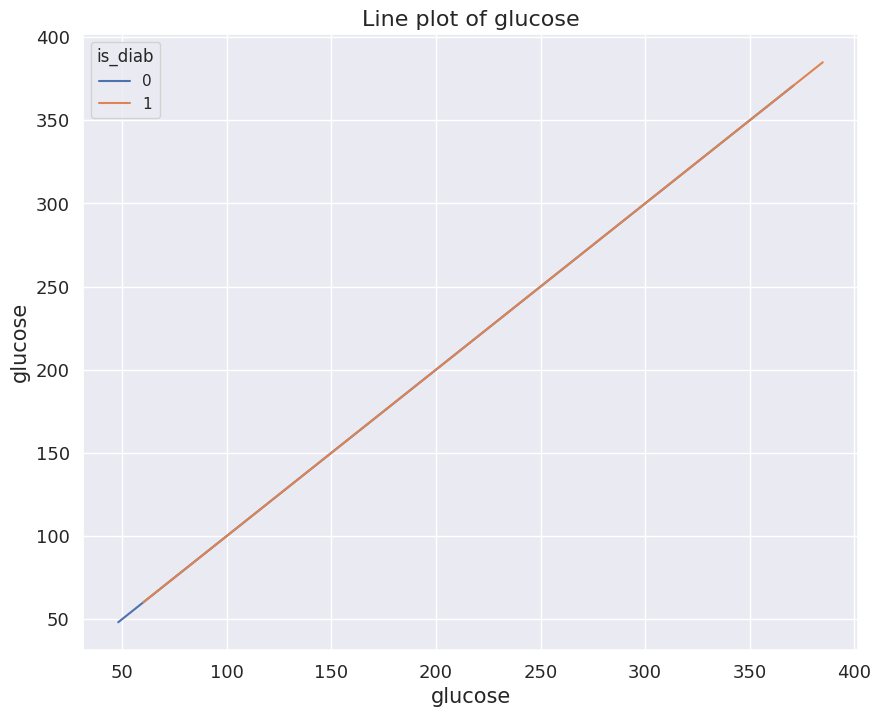

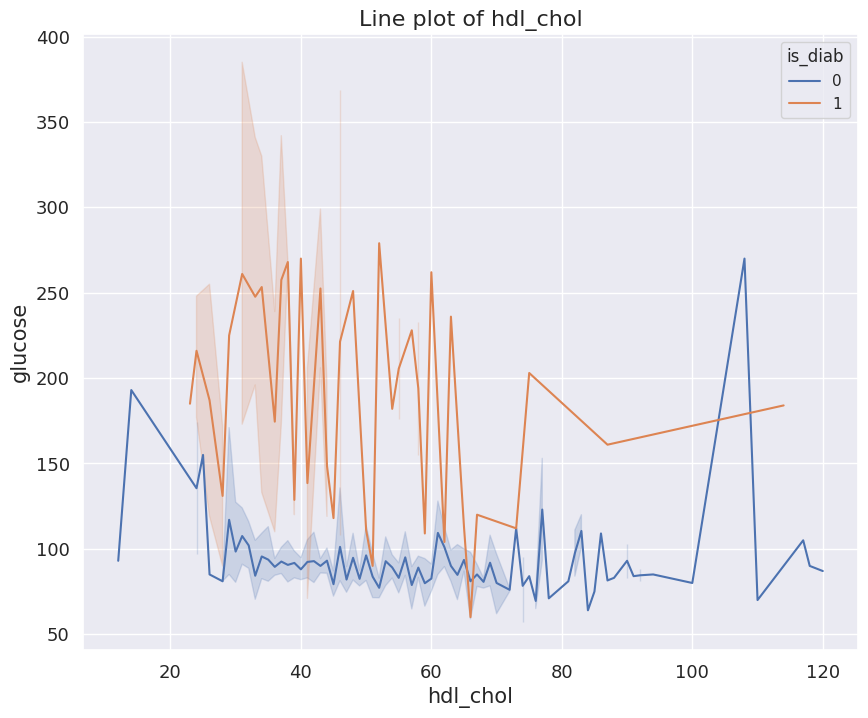

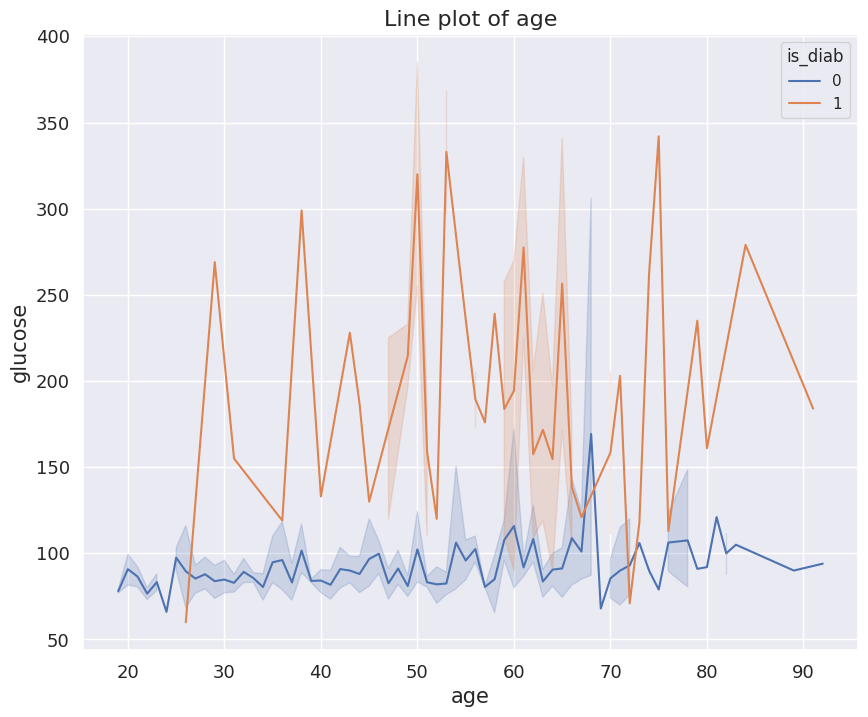

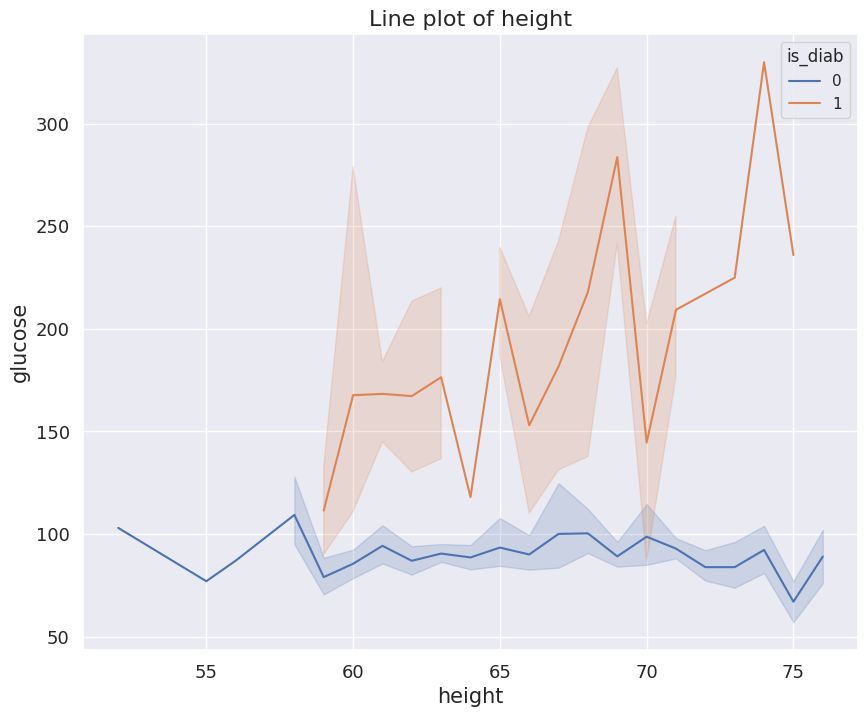

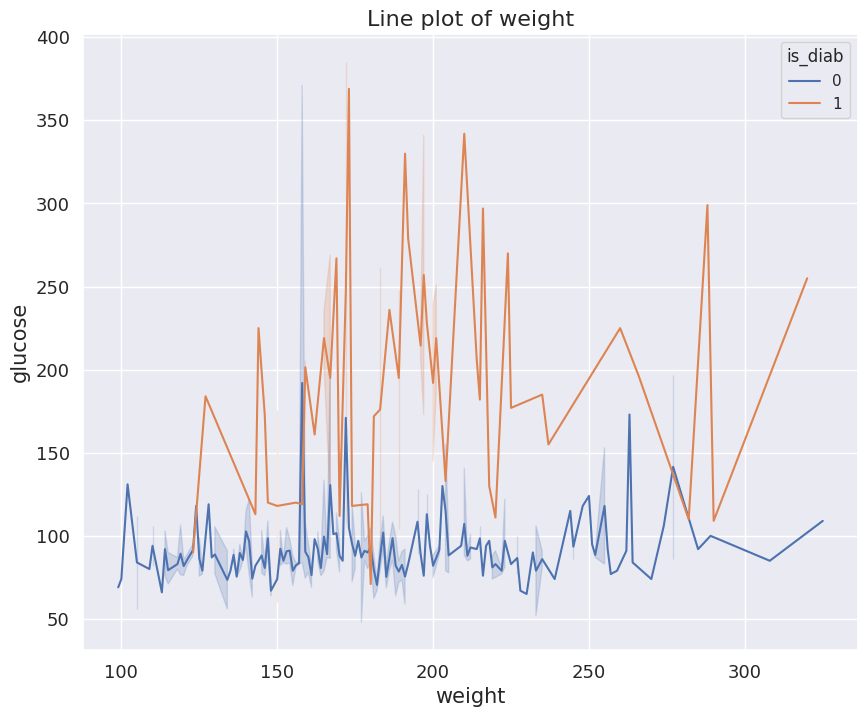

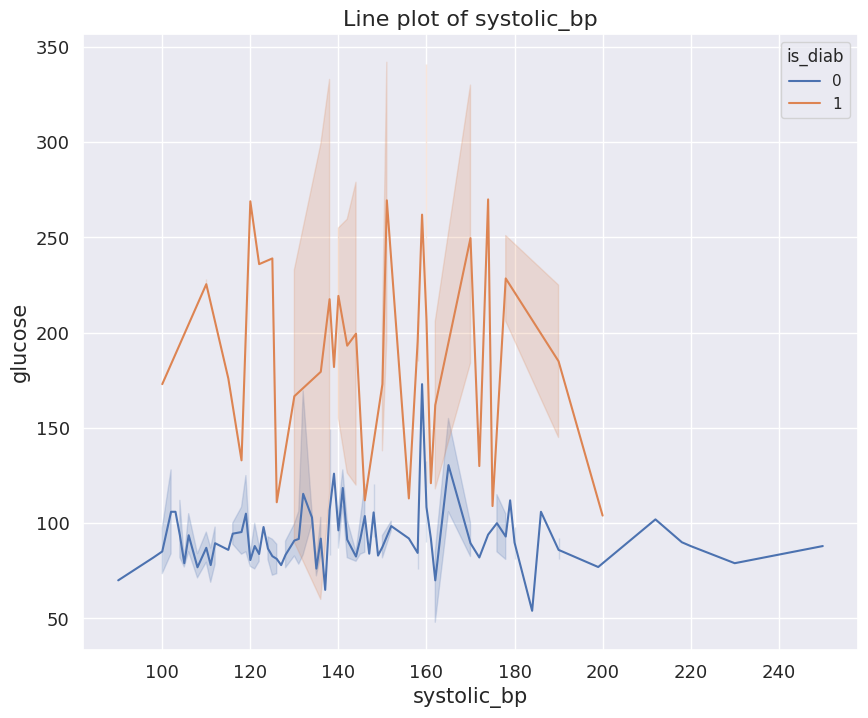

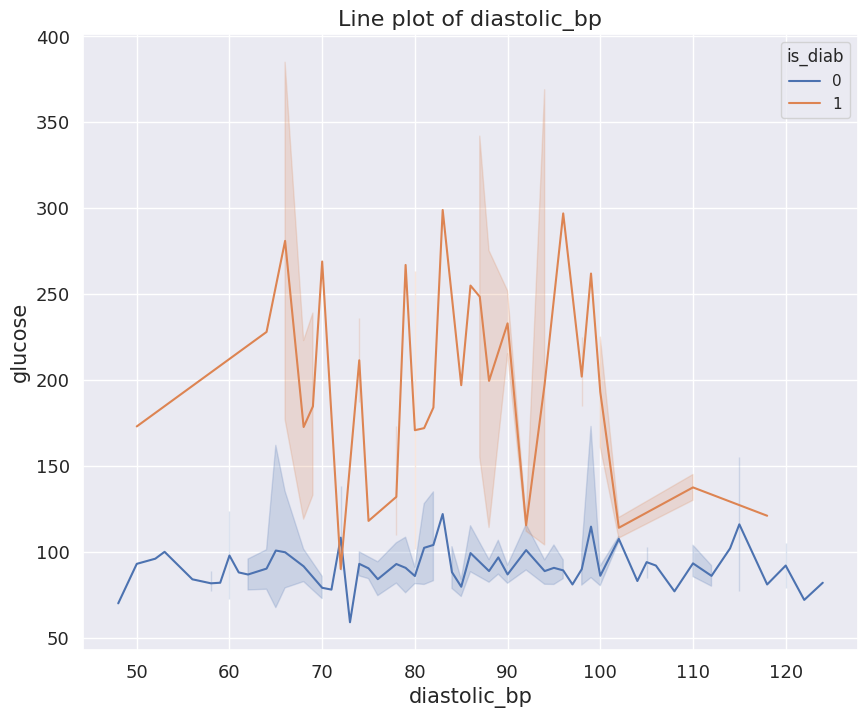

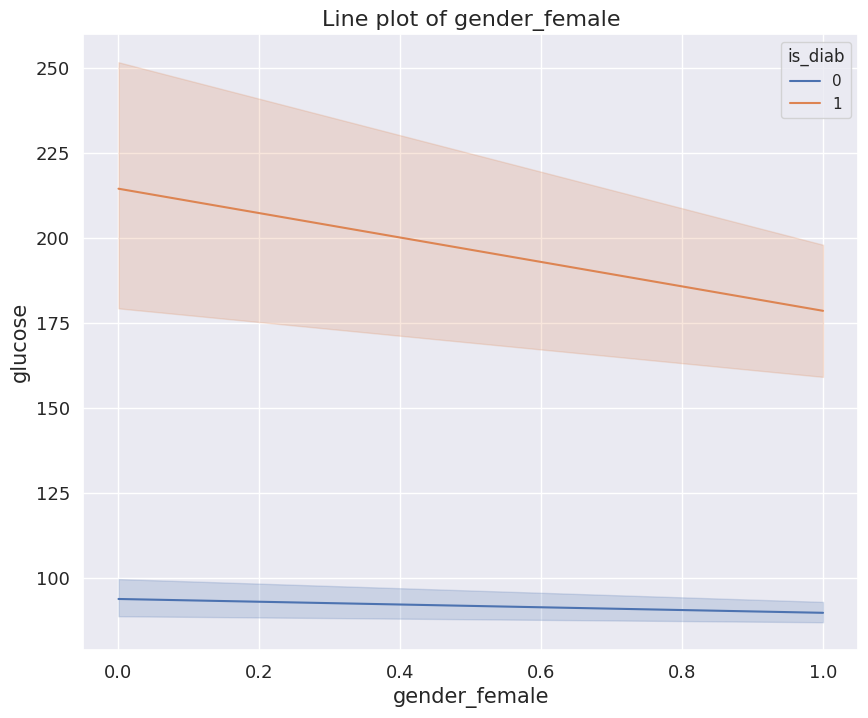

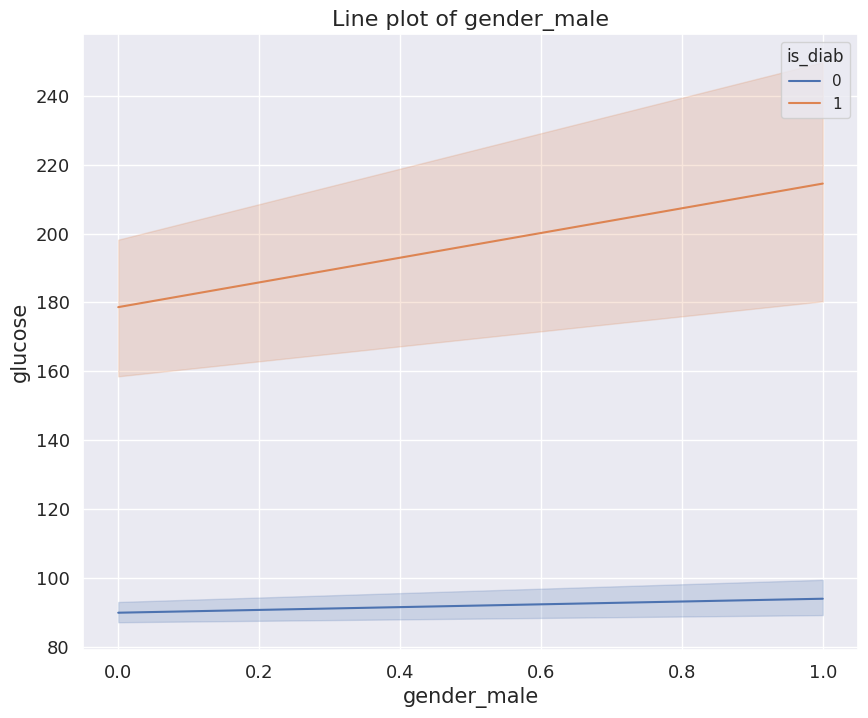

In [140]:
#shows line plot for every feature keeping glucose constant one y axis and with respect to diabetes
for c in data.columns[:]:
  fig=sns.lineplot(x=data[c],y='glucose',hue='is_diab',data=df)
  plt.xticks(fontsize=13)
  plt.yticks(fontsize=13)
  plt.xlabel("{}".format(c),fontsize=15)
  plt.ylabel("glucose",fontsize=15)
  plt.title("Line plot of {}".format(c),fontsize=16)
  plt.grid(True)
  plt.show()

# **Removing 1%, 5%, and 10% of data randomly and imputing the values back**

As the dataset used had no missing values, tried randomly removing the data from glucose feature and imputing them back and checked the difference occurred using three different methods.

They are as follows:
1. KNN Imputer Method
2. Mean Imputation
3. Mice Algorithm for data imputation

In [141]:
df_glucose = df[['glucose']]
df_glucose['glucose_copy_1_percent'] = df[['glucose']]
df_glucose['glucose_copy_5_percent'] = df[['glucose']]
df_glucose['glucose_copy_10_percent'] = df[['glucose']]
df_glucose.head()


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,glucose,glucose_copy_1_percent,glucose_copy_5_percent,glucose_copy_10_percent
0,77,77,77,77
1,79,79,79,79
2,75,75,75,75
3,97,97,97,97
4,91,91,91,91


# **Checking % missing values in the dataframe**

In [142]:
def get_percent_missing(dataframe):
    
    percent_missing = dataframe.isnull().sum() * 100 / len(dataframe)
    missing_value_df = pd.DataFrame({'column_name': dataframe.columns,
                                     'percent_missing': percent_missing})
    return missing_value_df

In [143]:
get_percent_missing(df_glucose)

,column_name,percent_missing
glucose,glucose,0.0
glucose_copy_1_percent,glucose_copy_1_percent,0.0
glucose_copy_5_percent,glucose_copy_5_percent,0.0
glucose_copy_10_percent,glucose_copy_10_percent,0.0


In [144]:
#Create missing helper fn
def create_missing(dataframe, percent, col):
    dataframe.loc[dataframe.sample(frac = percent).index, col] = np.nan

In [145]:
# Create missing data in each col
create_missing(df_glucose, 0.01, 'glucose_copy_1_percent')
create_missing(df_glucose, 0.05, 'glucose_copy_5_percent')
create_missing(df_glucose, 0.1, 'glucose_copy_10_percent')


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [146]:
get_percent_missing(df_glucose)

,column_name,percent_missing
glucose,glucose,0.000000
glucose_copy_1_percent,glucose_copy_1_percent,1.025641
glucose_copy_5_percent,glucose_copy_5_percent,5.128205
glucose_copy_10_percent,glucose_copy_10_percent,10.000000


In [147]:
# Store the indices of missing rows
glucose_1_idx = list(np.where(df_glucose['glucose_copy_1_percent'].isna())[0])
glucose_5_idx = list(np.where(df_glucose['glucose_copy_5_percent'].isna())[0])
glucose_10_idx = list(np.where(df_glucose['glucose_copy_10_percent'].isna())[0])

In [148]:
print(f"Length of glucose_1_idx is {len(glucose_1_idx)} and it contains {(len(glucose_1_idx)/len(df_glucose['glucose_copy_1_percent']))*100}% of total data in column | Total rows: {len(df_glucose['glucose_copy_1_percent'])}")
print(f"Length of glucose_5_idx is {len(glucose_5_idx)} and it contains {(len(glucose_5_idx)/len(df_glucose['glucose_copy_1_percent']))*100}% of total data in column | Total rows: {len(df_glucose['glucose_copy_1_percent'])}")
print(f"Length of glucose_10_idx is {len(glucose_10_idx)} and it contains {(len(glucose_10_idx)/len(df_glucose['glucose_copy_1_percent']))*100}% of total data in column | Total rows: {len(df_glucose['glucose_copy_1_percent'])}")

Length of glucose_1_idx is 4 and it contains 1.0256410256410255% of total data in column | Total rows: 390
Length of glucose_5_idx is 20 and it contains 5.128205128205128% of total data in column | Total rows: 390
Length of glucose_10_idx is 39 and it contains 10.0% of total data in column | Total rows: 390


# **Checking Missing data in each column**

In [149]:
df_glucose.isnull().sum()

glucose                     0
glucose_copy_1_percent      4
glucose_copy_5_percent     20
glucose_copy_10_percent    39
dtype: int64

# **Method 1 : KNN Imputer**

In [150]:
#perfomring scaling before KNN imputation

from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
df_glucose = pd.DataFrame(scaler.fit_transform(df_glucose))
df_glucose.head()

#knn imputer
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=3)
df_glucose = pd.DataFrame(imputer.fit_transform(df_glucose))

#checking for missing values
df_glucose.isnull().sum()

0    0
1    0
2    0
3    0
dtype: int64

In [151]:
#Calculating average difference between the actual values and the imputed values
print('Variance in 1% imputation column is - ', df_glucose[0].mean() - df_glucose[1].mean())
print('Variance in 5% imputation column is - ', df_glucose[0].mean() - df_glucose[2].mean())
print('Variance in 10% imputation column is - ', df_glucose[0].mean() - df_glucose[3].mean())

Variance in 1% imputation column is -  0.0
Variance in 5% imputation column is -  0.00010398437698139196
Variance in 10% imputation column is -  3.0434451799427054e-05


# **Method 2 : Mean Imputation**

In [152]:
df_glucose = df[['glucose']]
df_glucose['glucose_copy_1_percent'] = df[['glucose']]
df_glucose['glucose_copy_5_percent'] = df[['glucose']]
df_glucose['glucose_copy_10_percent'] = df[['glucose']]
df_glucose

def get_percent_missing(dataframe):
    
    percent_missing = dataframe.isnull().sum() * 100 / len(dataframe)
    missing_value_df = pd.DataFrame({'column_name': dataframe.columns,
                                     'percent_missing': percent_missing})
    return missing_value_df
  
get_percent_missing(df_glucose)

#Create missing helper fn
def create_missing(dataframe, percent, col):
    dataframe.loc[dataframe.sample(frac = percent).index, col] = np.nan

# Create missing data in each col
create_missing(df_glucose, 0.01, 'glucose_copy_1_percent')
create_missing(df_glucose, 0.05, 'glucose_copy_5_percent')
create_missing(df_glucose, 0.1, 'glucose_copy_10_percent')

get_percent_missing(df_glucose)

# Store the indices of missing rows
glucose_1_idx = list(np.where(df_glucose['glucose_copy_1_percent'].isna())[0])
glucose_5_idx = list(np.where(df_glucose['glucose_copy_5_percent'].isna())[0])
glucose_10_idx = list(np.where(df_glucose['glucose_copy_10_percent'].isna())[0])

print(f"Length of glucose_1_idx is {len(glucose_1_idx)} and it contains {(len(glucose_1_idx)/len(df_glucose['glucose_copy_1_percent']))*100}% of total data in column | Total rows: {len(df_glucose['glucose_copy_1_percent'])}")
print(f"Length of glucose_5_idx is {len(glucose_5_idx)} and it contains {(len(glucose_5_idx)/len(df_glucose['glucose_copy_1_percent']))*100}% of total data in column | Total rows: {len(df_glucose['glucose_copy_1_percent'])}")
print(f"Length of glucose_10_idx is {len(glucose_10_idx)} and it contains {(len(glucose_10_idx)/len(df_glucose['glucose_copy_1_percent']))*100}% of total data in column | Total rows: {len(df_glucose['glucose_copy_1_percent'])}")

df_glucose.isnull().sum()


Length of glucose_1_idx is 4 and it contains 1.0256410256410255% of total data in column | Total rows: 390
Length of glucose_5_idx is 20 and it contains 5.128205128205128% of total data in column | Total rows: 390
Length of glucose_10_idx is 39 and it contains 10.0% of total data in column | Total rows: 390



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/

glucose                     0
glucose_copy_1_percent      4
glucose_copy_5_percent     20
glucose_copy_10_percent    39
dtype: int64

In [153]:
#Applying mean to all the columns where data is missing
df_glucose['glucose_copy_1_percent'] = df_glucose['glucose_copy_1_percent'].fillna(df_glucose['glucose_copy_1_percent'].mean())
df_glucose['glucose_copy_5_percent'] = df_glucose['glucose_copy_5_percent'].fillna(df_glucose['glucose_copy_5_percent'].mean())
df_glucose['glucose_copy_10_percent'] = df_glucose['glucose_copy_10_percent'].fillna(df_glucose['glucose_copy_10_percent'].mean())
df_glucose.isnull().sum()


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


glucose                    0
glucose_copy_1_percent     0
glucose_copy_5_percent     0
glucose_copy_10_percent    0
dtype: int64

In [154]:
#Calculating average difference between the actual values and the imputed values
print('Variance in 1% imputation column is - ', df_glucose['glucose'].mean() - df_glucose['glucose_copy_1_percent'].mean())
print('Variance in 5% imputation column is - ', df_glucose['glucose'].mean() - df_glucose['glucose_copy_5_percent'].mean())
print('Variance in 10% imputation column is - ', df_glucose['glucose'].mean() - df_glucose['glucose_copy_10_percent'].mean())

Variance in 1% imputation column is -  -0.1641291351135834
Variance in 5% imputation column is -  -0.7399168399168445
Variance in 10% imputation column is -  -1.4250712250712212


# **Method 3 : Mice Imputation**


In [155]:
df_glucose = df[['glucose']]
df_glucose['glucose_copy_1_percent'] = df[['glucose']]
df_glucose['glucose_copy_5_percent'] = df[['glucose']]
df_glucose['glucose_copy_10_percent'] = df[['glucose']]
df_glucose

def get_percent_missing(dataframe):
    
    percent_missing = dataframe.isnull().sum() * 100 / len(dataframe)
    missing_value_df = pd.DataFrame({'column_name': dataframe.columns,
                                     'percent_missing': percent_missing})
    return missing_value_df
  
get_percent_missing(df_glucose)

#Create missing helper fn
def create_missing(dataframe, percent, col):
    dataframe.loc[dataframe.sample(frac = percent).index, col] = np.nan

# Create missing data in each col
create_missing(df_glucose, 0.01, 'glucose_copy_1_percent')
create_missing(df_glucose, 0.05, 'glucose_copy_5_percent')
create_missing(df_glucose, 0.1, 'glucose_copy_10_percent')

get_percent_missing(df_glucose)

# Store the indices of missing rows
glucose_1_idx = list(np.where(df_glucose['glucose_copy_1_percent'].isna())[0])
glucose_5_idx = list(np.where(df_glucose['glucose_copy_5_percent'].isna())[0])
glucose_10_idx = list(np.where(df_glucose['glucose_copy_10_percent'].isna())[0])

print(f"Length of glucose_1_idx is {len(glucose_1_idx)} and it contains {(len(glucose_1_idx)/len(df_glucose['glucose_copy_1_percent']))*100}% of total data in column | Total rows: {len(df_glucose['glucose_copy_1_percent'])}")
print(f"Length of glucose_5_idx is {len(glucose_5_idx)} and it contains {(len(glucose_5_idx)/len(df_glucose['glucose_copy_1_percent']))*100}% of total data in column | Total rows: {len(df_glucose['glucose_copy_1_percent'])}")
print(f"Length of glucose_10_idx is {len(glucose_10_idx)} and it contains {(len(glucose_10_idx)/len(df_glucose['glucose_copy_1_percent']))*100}% of total data in column | Total rows: {len(df_glucose['glucose_copy_1_percent'])}")

df_glucose.isnull().sum()

Length of glucose_1_idx is 4 and it contains 1.0256410256410255% of total data in column | Total rows: 390
Length of glucose_5_idx is 20 and it contains 5.128205128205128% of total data in column | Total rows: 390
Length of glucose_10_idx is 39 and it contains 10.0% of total data in column | Total rows: 390



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/

glucose                     0
glucose_copy_1_percent      4
glucose_copy_5_percent     20
glucose_copy_10_percent    39
dtype: int64

In [156]:
import numpy as np
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.linear_model import LinearRegression

lr = LinearRegression()
imp = IterativeImputer(estimator=lr,missing_values=np.nan, max_iter=10, verbose=2, imputation_order='roman',random_state=0)
data=imp.fit_transform(data)

#checking for missing values
df_glucose.isnull().sum()
print('\n Values are inserted with MICE Imputer successfully!')

[IterativeImputer] Completing matrix with shape (390, 10)
[IterativeImputer] Ending imputation round 1/10, elapsed time 0.02
[IterativeImputer] Change: 0.0, scaled tolerance: 0.443 
[IterativeImputer] Early stopping criterion reached.

 Values are inserted with MICE Imputer successfully!


In [157]:
#Calculating average difference between the actual values and the imputed values
print('Variance in 1% imputation column is - ', df_glucose['glucose'].mean() - df_glucose['glucose_copy_1_percent'].mean())
print('Variance in 5% imputation column is - ', df_glucose['glucose'].mean() - df_glucose['glucose_copy_5_percent'].mean())
print('Variance in 10% imputation column is - ', df_glucose['glucose'].mean() - df_glucose['glucose_copy_10_percent'].mean())

Variance in 1% imputation column is -  0.06385013949781637
Variance in 5% imputation column is -  -0.0020790020790002472
Variance in 10% imputation column is -  0.6119658119658169


In [158]:
df.head()

,cholesterol,glucose,hdl_chol,age,height,weight,systolic_bp,diastolic_bp,waist,hip,gender_female,gender_male,is_diab
0,193,77,49,19,61,119,118,70,32,38,1,0,0
1,146,79,41,19,60,135,108,58,33,40,1,0,0
2,217,75,54,20,67,187,110,72,40,45,1,0,0
3,226,97,70,20,64,114,122,64,31,39,1,0,0
4,164,91,67,20,70,141,122,86,32,39,1,0,0


# **Modeling**

# **How did you split the data into train, and test?**

* The data was splitted into Training and Testing Data into 90% and 10% respectively.

In [159]:
#Training the dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42, shuffle=False)

In [160]:
# Taking 100 samples out for SHAP analysis as it is a computationally expensive process
X_train_100 = shap.utils.sample(X_train, 100)  

# Taking 100 samples out for SHAP analysis as it is a computationally expensive process
X_test_100 = shap.utils.sample(X_test, 100)  

# **Logistic Regression**

In [161]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
regr = LogisticRegression()
regr.fit(X_train,y_train)

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


LogisticRegression()

In [162]:
y_pred_lr = regr.predict(X_test)
y_pred_lr

array([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0])

In [163]:
from sklearn.metrics import mean_absolute_error
score = regr.score(X_test, y_test)
print(f"R^2 score on test set: {score:.3f}")
mae = mean_absolute_error(y_test, y_pred_lr)
print(f"MAE = {round(mae, 3)} ")
accuracy_lr = accuracy_score(y_test, y_pred_lr)
print(f"Accuracy = {accuracy_lr : .3f}")

R^2 score on test set: 0.846
MAE = 0.154 
Accuracy =  0.846


In [164]:
X_train = sm.add_constant(X_train)
reg = sm.OLS(y_train, X_train).fit()

In [165]:
reg.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                is_diab   R-squared:                       0.497
Model:                            OLS   Adj. R-squared:                  0.481
Method:                 Least Squares   F-statistic:                     30.48
Date:                Mon, 10 Apr 2023   Prob (F-statistic):           2.34e-44
Time:                        00:51:36   Log-Likelihood:                -2.3806
No. Observations:                 351   AIC:                             28.76
Df Residuals:                     339   BIC:                             75.09
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const            -0.3583      0.249     -1.440      0.151      -0.848       0.131
cholesterol       0.0006      0.000      1.941      0.053   -8.18e-06       0.001
glucose           0.0041      0.000     14.840      0.000       0.004       0.005
hdl_chol         -0.0013      0.001     -1.494      0.136      -0.003       0.000
age               0.0016      0.001      1.376      0.170      -0.001       0.004
height           -0.0002      0.005     -0.048      0.961      -0.010       0.009
weight         9.767e-05      0.001      0.112      0.911      -0.002       0.002
systolic_bp       0.0012      0.001      1.317      0.189      -0.001       0.003
diastolic_bp     -0.0008      0.001     -0.635      0.526      -0.003       0.002
waist             0.0036      0.005      0.680      0.497      -0.007       0.014
hip              -0.0029      0.006     -0.493      0.622      -0.014       0.009
gender_female    -0.1618      0.119     -1.358      0.175      -0.396       0.073
gender_male      -0.1965      0.133     -1.481      0.140      -0.458       0.065
==============================================================================
Omnibus:                      112.040   Durbin-Watson:                   1.676
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              591.257
Skew:                           1.236   Prob(JB):                    4.07e-129
Kurtosis:                       8.858   Cond. No.                     3.05e+18
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 4.71e-30. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

# **Interpreting Regression Coefficient**

Model Co-efficient:

A coeficient's positive or negative value indicates whether the target and predictors have a positive or negative association. A positive number means that if the co-value efficient's rises, the target's value will rise as well, and vice versa. The negative numbers, on the other hand, show that the goal value rises if the co-efficient value falls and vice versa.

As seen table in the coeffcient column:

1. Glucose has the highest coeffcient.
2. Followed by waist

Coefficients with high absolute values can be used to estimate how significant a given variable is in a linear regression. As was already said, in this case, glucose and waist appear to be the most crucial factors in predicting the target, which is diabetes.

**P Values**

The result is hailed as significant if the p-value is 0.05 or less; however, if it is more than 0.05, the result is non-significant.

*   Glucose
*   Cholestrol

**Skew and Kurtosis**

Kurtosis reveals the height and sharpness of the center peak, whereas Skewness reveals the quantity and direction of skew (Departure from the central axis). The ideal value for these two measurements is 0, but in our situation, Skew and Kurtosis are respectively -0.143 and 3.717.

**Durbin-Watson**

A statistical test called the Durbin-Watson test is used to find auto-correlation in the residuals of a regression study. It falls between 0 and 4. 
1. Value 2 denotes the absence of any autocorrelation.
2. Value between 0 and 2 denotes the presence of positive autocorrelation.
3. Values between 2 and 4 denote the presence of negative autocorrelation.

Our model has a DW score of 1.676, which indicates that the regression residuals have a positive auto-correlation.

**Jarque-Bera**

Whether or not the data has skew or kurtosis, the JB test is known as the test of normality. It indicates that the data do not have a normal distribution if it is far from zero. Our JB value is 591.257, which confirms the meaning Skew and Kurtosis gave us.

# **Random Forest**

In [166]:
#Training the dataset for Tree based model
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42, shuffle=False)

from sklearn.ensemble import RandomForestClassifier

# Create a random forest regressor model with 100 trees
rf_model = RandomForestClassifier(n_estimators=10)

# Fit the model to the data
rf_model.fit(X_train, y_train)

RandomForestClassifier(n_estimators=10)

In [167]:
y_pred_rf = rf_model.predict(X_test)
y_pred_rf

array([0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0])

In [168]:
from sklearn.metrics import mean_absolute_error
score = rf_model.score(X_test, y_test)
print(f"R^2 score on test set: {score:.3f}")
mae = mean_absolute_error(y_test, y_pred_rf)
print(f"MAE = {round(mae, 3)} ")
accuracy_rf = accuracy_score(y_test, y_pred_rf)
print(f"Accuracy = {accuracy_rf : .3f}")

R^2 score on test set: 0.897
MAE = 0.103 
Accuracy =  0.897


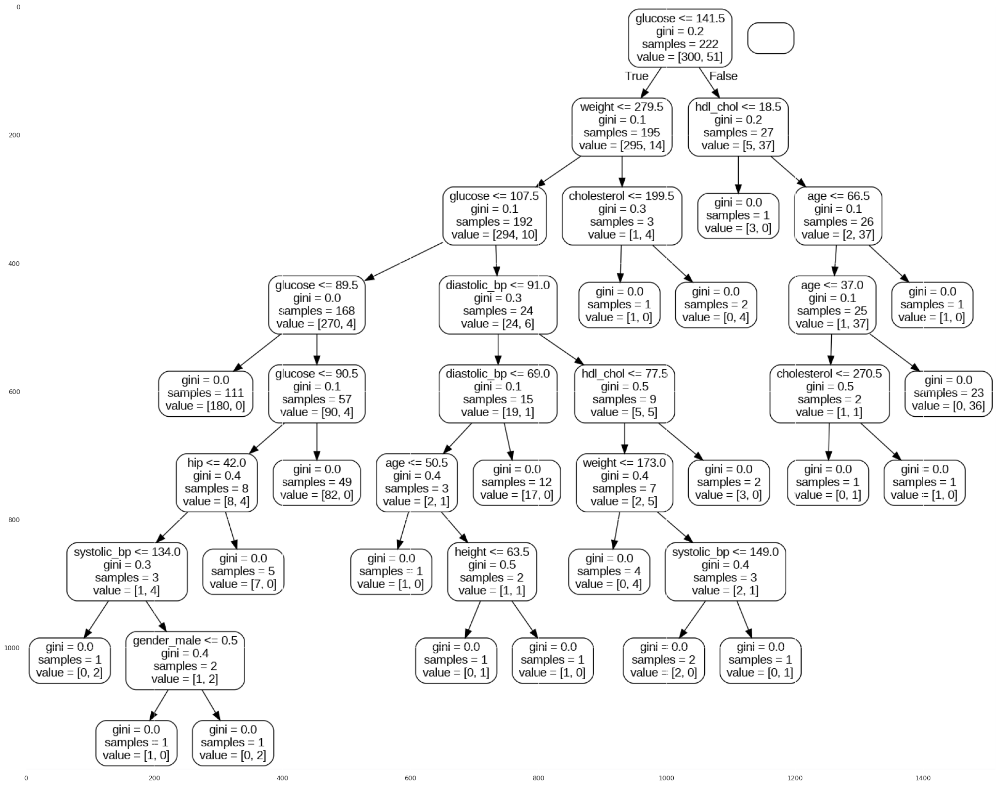

In [169]:
# Visualization of Nodes for the purpose of explainability
figure(figsize=(32, 24), dpi=80)
tree = rf_model.estimators_[0]
export_graphviz(
    tree,
    out_file="tree.dot",
    feature_names=list(X_train.columns),
    rounded=True,
    precision=1,
)
(graph,) = pydot.graph_from_dot_file("tree.dot")
graph.write_png("tree.png")
img = mpimg.imread("tree.png")
imgplot = plt.imshow(img)
plt.show()

# **Interpreting Nodes of a Tree Based Model**

The Random Forest Regressor relies on the idea of group intelligence. One of the numerous trees used to predict the target variable is the decision tree mentioned above. For a specific input, each decision tree regression forecasts a number as the result. The output of random forest regression is the average of those forecasts.

The tree, as normal, includes criteria on every internal node and a value assigned to every leaf (i.e. the value to be predicted). The mean of the response variables at each internal node, or the value at each internal node, has also been mapped out.

In [170]:
# Get numerical feature importances
tree_importances = list(rf_model.feature_importances_)
# List of tuples with variable and importance
feature_importances = [
    (feature, round(importance, 2))
    for feature, importance in zip(X_train.columns, tree_importances)
]
# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key=lambda x: x[1], reverse=True)

In [171]:
# Print out the feature and importances
[print("Variable: {:20} Importance: {}".format(*pair)) for pair in feature_importances];

Variable: glucose              Importance: 0.51
Variable: age                  Importance: 0.09
Variable: cholesterol          Importance: 0.08
Variable: hdl_chol             Importance: 0.07
Variable: weight               Importance: 0.07
Variable: waist                Importance: 0.05
Variable: height               Importance: 0.04
Variable: diastolic_bp         Importance: 0.04
Variable: systolic_bp          Importance: 0.03
Variable: hip                  Importance: 0.02
Variable: gender_female        Importance: 0.01
Variable: gender_male          Importance: 0.0


# **Getting the best model using AutoML**

In [172]:
# Converting Pandas dataframe in H2O dataframe
df1 = h2o.H2OFrame(df)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [173]:
# Setting up the data split between training and test dataset
pct_rows = 0.80  
df1_train, df1_test = df1.split_frame([pct_rows])

In [174]:
#Setting predictor and target variables
X = df1.columns
print(X)

['cholesterol', 'glucose', 'hdl_chol', 'age', 'height', 'weight', 'systolic_bp', 'diastolic_bp', 'waist', 'hip', 'gender_female', 'gender_male', 'is_diab']


In [175]:
#Setting predictor and target variables
X1 = df[['cholesterol', 'glucose', 'hdl_chol', 'age', 'height', 'weight', 'systolic_bp', 'diastolic_bp', 'waist', 'hip', 'gender_female', 'gender_male']]
X1.head()

,cholesterol,glucose,hdl_chol,age,height,weight,systolic_bp,diastolic_bp,waist,hip,gender_female,gender_male
0,193,77,49,19,61,119,118,70,32,38,1,0
1,146,79,41,19,60,135,108,58,33,40,1,0
2,217,75,54,20,67,187,110,72,40,45,1,0
3,226,97,70,20,64,114,122,64,31,39,1,0
4,164,91,67,20,70,141,122,86,32,39,1,0


In [176]:
y1 = df['is_diab']

In [177]:
y = "is_diab"
X.remove(y)  # Removing the result from our predictors data
print(X)

['cholesterol', 'glucose', 'hdl_chol', 'age', 'height', 'weight', 'systolic_bp', 'diastolic_bp', 'waist', 'hip', 'gender_female', 'gender_male']


In [178]:
# Setting of AutoML
aml = H2OAutoML(max_runtime_secs=run_time, seed=1)

In [179]:
# Converting is_diab to binary 0 and 1
df1_train["is_diab"] = df1_train["is_diab"].asfactor()

In [180]:
# Training the dataset on different models
aml.train(x=X, y=y, training_frame=df1_train)

AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2OXGBoostEstimator : XGBoost
Model Key: XGBoost_2_AutoML_1_20230410_05144


Model Summary: 
    number_of_trees
--  -----------------
    40

ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.045210895840575256
RMSE: 0.21262853957212624
LogLoss: 0.16178925001878697
Mean Per-Class Error: 0.07285622179239201
AUC: 0.9606302385557706
AUCPR: 0.8756050704890347
Gini: 0.9212604771115411

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.28860968351364136
       0    1    Error    Rate
-----  ---  ---  -------  ------------
0      248  16   0.0606   (16.0/264.0)
1      4    43   0.0851   (4.0/47.0)
Total  252  59   0.0643   (20.0/311.0)

Maximum Metrics: Maximum metrics at their respective thresholds
metric                       threshold    value     idx
---------------------------  -----------  --------  -----
max f1                       0.28861      0.811321  57
max f2                       0.28861      0.870445  57
max f0point5                 0.670128     0.855615  33
max accuracy                 0.53278      0.945338  40
max precision                0.970643     1         0
max recall                   0.0223564    1         176
max specificity              0.970643     1         0
max absolute_mcc             0.28861      0.780421  57
max min_per_class_accuracy   0.219585     0.920455  63
max mean_per_class_accuracy  0.219585     0.928312  63
max tns                      0.970643     264       0
max fns                      0.970643     46        0
max fps                      0.00270533   264       282
max tps                      0.0223564    47        176
max tnr                      0.970643     1         0
max fnr                      0.970643     0.978723  0
max fpr                      0.00270533   1         282
max tpr                      0.0223564    1         176

Gains/Lift Table: Avg response rate: 15.11 %, avg score: 16.29 %
group    cumulative_data_fraction    lower_threshold    lift      cumulative_lift    response_rate    score       cumulative_response_rate    cumulative_score    capture_rate    cumulative_capture_rate    gain      cumulative_gain    kolmogorov_smirnov
-------  --------------------------  -----------------  --------  -----------------  ---------------  ----------  --------------------------  ------------------  --------------  -------------------------  --------  -----------------  --------------------
1        0.0128617                   0.964385           6.61702   6.61702            1                0.967877    1                           0.967877            0.0851064       0.0851064                  561.702   561.702            0.0851064
2        0.022508                    0.946546           6.61702   6.61702            1                0.954619    1                           0.962195            0.0638298       0.148936                   561.702   561.702            0.148936
3        0.0321543                   0.941232           6.61702   6.61702            1                0.943826    1                           0.956685            0.0638298       0.212766                   561.702   561.702            0.212766
4        0.0418006                   0.922707           6.61702   6.61702            1                0.935013    1                           0.951684            0.0638298       0.276596                   561.702   561.702            0.276596
5        0.0514469                   0.892776           6.61702   6.61702            1                0.912776    1                           0.944388            0.0638298       0.340426                   561.702   561.702            0.340426
6        0.102894                    0.693246           5.37633   5.99668            0.8125           0.785248    0.90625                     0.864818            0.276596        0.617021                   437.633   499.668            0.605658
7        0.151125                    0.488881           3.52908   5.20914            0.533333         0.575692

In [181]:
# Leaderboard displaying the effectiveness of several models on the dataset.
print(aml.leaderboard)

model_id                                                     auc    logloss     aucpr    mean_per_class_error      rmse        mse
XGBoost_2_AutoML_1_20230410_05144                       0.937339   0.20537   0.799371                0.165982  0.244357  0.0597104
GBM_grid_1_AutoML_1_20230410_05144_model_29             0.934034   0.208192  0.781275                0.155343  0.245082  0.0600654
StackedEnsemble_BestOfFamily_3_AutoML_1_20230410_05144  0.933269   0.209792  0.782077                0.181576  0.247614  0.0613129
GBM_grid_1_AutoML_1_20230410_05144_model_36             0.931979   0.214184  0.757818                0.170938  0.249284  0.0621424
XGBoost_grid_1_AutoML_1_20230410_05144_model_1          0.929965   0.21247   0.778754                0.115409  0.247676  0.0613435
GBM_grid_1_AutoML_1_20230410_05144_model_3              0.929965   0.230153  0.742354                0.201684  0.264074  0.0697353
XGBoost_grid_1_AutoML_1_20230410_05144_model_20         0.928756   0.228165  0.7741

In [182]:
model_index = 0
glm_index = 0
glm_model = ""
aml_leaderboard_df = aml.leaderboard.as_data_frame()
models_dict = {}
for m in aml_leaderboard_df["model_id"]:
    models_dict[m] = model_index
    if "StackedEnsemble" not in m:
        break
    model_index = model_index + 1

for m in aml_leaderboard_df["model_id"]:
    if "GLM" in m:
        models_dict[m] = glm_index
        break
    glm_index = glm_index + 1
models_dict

{'XGBoost_2_AutoML_1_20230410_05144': 0, 'GLM_1_AutoML_1_20230410_05144': 27}

In [183]:
print(model_index)
best_model = h2o.get_model(aml.leaderboard[model_index, "model_id"])

0


In [184]:
#Getting the best model
best_model.algo

'xgboost'

In [185]:
print(best_model.r2(train=True))

0.6475787349616151


In [186]:
predictions = best_model.predict(df1_test)

xgboost prediction progress: |███████████████████████████████████████████████████| (done) 100%


In [187]:
# Predictions on Test Dataset using the best model from the leaderboard.
y_pred_aml = h2o.as_list(predictions)
print(y_pred_aml)

    predict        p0        p1
0         0  0.995753  0.004247
1         0  0.981602  0.018398
2         0  0.968557  0.031443
3         0  0.997706  0.002294
4         0  0.993792  0.006208
..      ...       ...       ...
74        1  0.039103  0.960897
75        1  0.055597  0.944403
76        0  0.967960  0.032040
77        1  0.058026  0.941974
78        1  0.060521  0.939479

[79 rows x 3 columns]


In [188]:
# Real Answers
y_test = h2o.as_list(df1_test[y])  
y_test

,is_diab
0,0
1,0
2,0
3,0
4,0
...,...
74,1
75,1
76,0
77,1


# **Checking if Assumptions Violated**

In [189]:
df = pd.get_dummies(df, columns=['is_diab'], drop_first=True)

In [190]:
#Seperating the predictor and target variables
A=df.drop(['is_diab_1'],axis=1)
B=df['is_diab_1']

In [191]:
#Splitting the data
from sklearn.model_selection import train_test_split 

A_train,A_test,b_train,b_test=train_test_split(A,B,test_size=0.2,random_state=42)


In [192]:
import statsmodels.api as sm
from statsmodels.compat import lzip
import statsmodels.stats.api as sms

model1 = sm.OLS(b_train,sm.add_constant(A_train)).fit()

In [193]:
b_pred = model1.predict(sm.add_constant(A_train))

In [194]:
residuals = b_train-b_pred
mean_residuals = np.mean(residuals)
print("Mean of Residuals {}".format(mean_residuals))

Mean of Residuals -8.719520831863729e-15




`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751



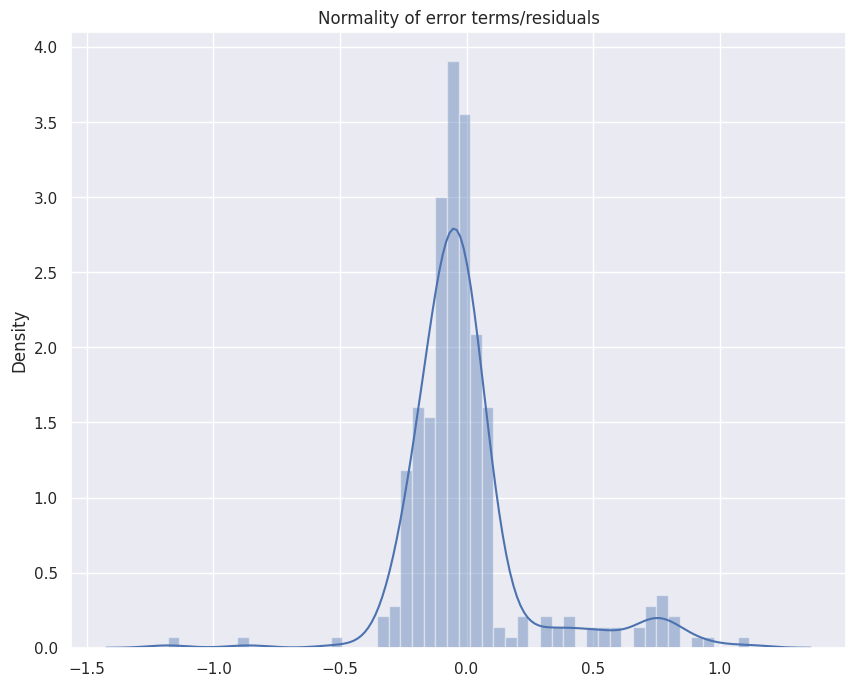

In [195]:
p = sns.distplot(residuals,kde=True)
p = plt.title('Normality of error terms/residuals')

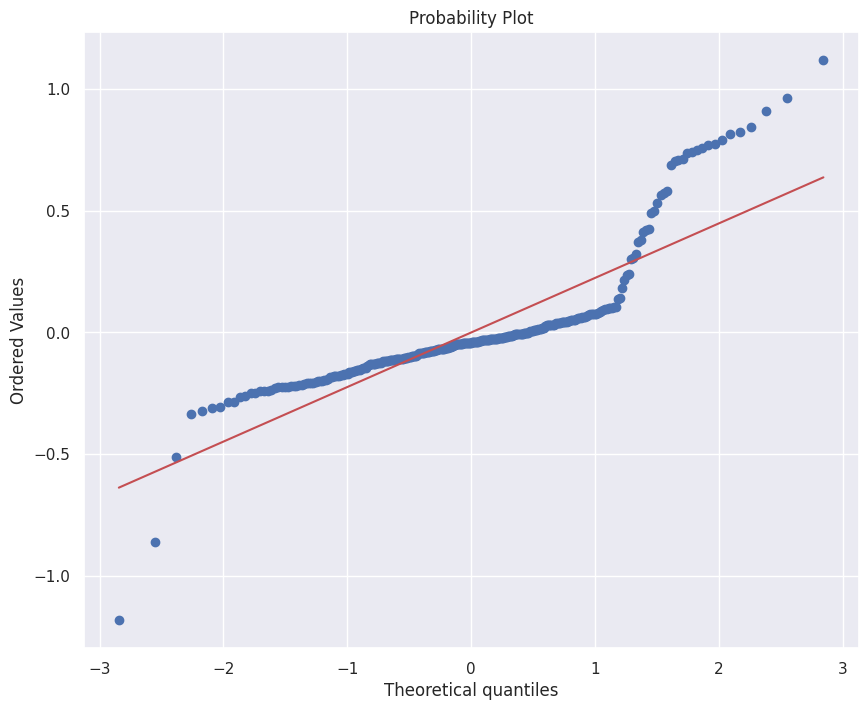

In [196]:
import pylab 
import scipy.stats as stats   
stats.probplot(residuals, dist="norm", plot=pylab)
pylab.show()

<Axes: xlabel='is_diab_1', ylabel='Count'>

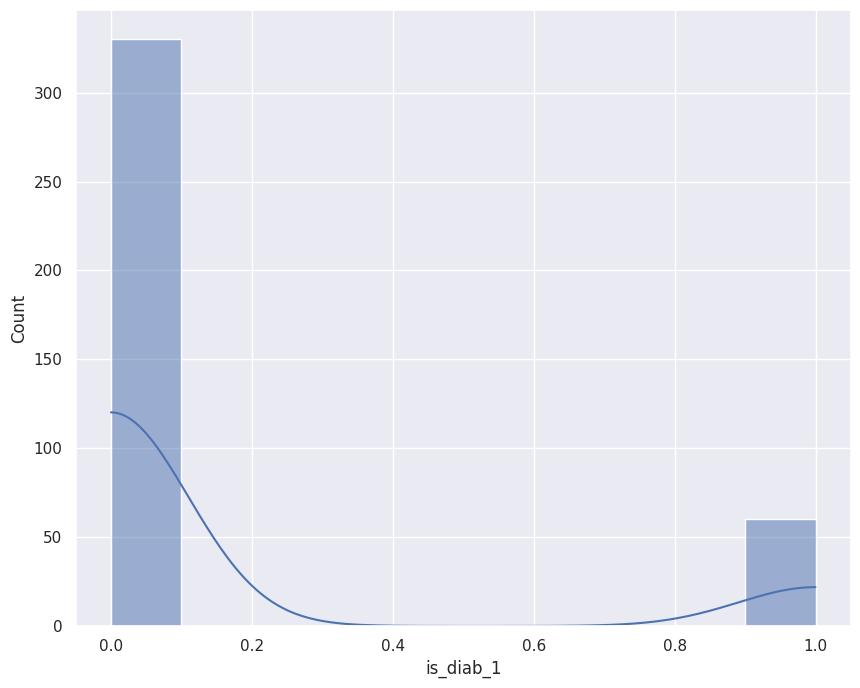

In [197]:
sns.histplot(df.is_diab_1, kde = True)

# **Regularization**

In this section, we will test if regularization aids in increasing accuracy and lowering overfitting using the GLM model.

Regularization methods like Ridge and Lasso are used in linear regression to reduce overfitting and enhance the generalizability of the model.

The least-squares objective function of the linear regression model receives a penalty component as a result of ridge regularization. This penalty term reduces the model's coefficients toward zero by having a square relationship with their magnitude. To achieve the greatest performance, the regularization parameter, a hyperparameter that controls the intensity of the penalty, must be modified.

Ridge regularization and Lasso regularization are similar, but Lasso regularization adds a penalty term proportional to the absolute value of the coefficients rather than the square of the coefficients. Lasso regularization is a valuable technique for feature selection since this penalty term has the ability to set some coefficients to exactly zero. Lasso can efficiently eliminate pointless variables from the model by setting some coefficients to zero, which can result in a model that is easier to understand and simpler.

The kind of punishment function utilized is the primary distinction between Ridge and Lasso regularization. Although Lasso employs L1 regularization, Ridge uses L2 regularization.

In [198]:
from h2o.estimators.glm import H2OGeneralizedLinearEstimator
from sklearn.ensemble import GradientBoostingRegressor

diabetes_glm = H2OGeneralizedLinearEstimator(family="binomial", lambda_=0, compute_p_values=True, nfolds=5, remove_collinear_columns=True)
     
diabetes_glm_regularization_ridge = H2OGeneralizedLinearEstimator(
    family="binomial", alpha=0, nfolds=5, compute_p_values=True, remove_collinear_columns=True
)  # RIDGE Regularization
diabetes_glm_regularization_lasso = H2OGeneralizedLinearEstimator(
    family="binomial", alpha=1, nfolds=5
)  # LASSO Regularization
diabetes_glm_regularization_lambda_search = H2OGeneralizedLinearEstimator(
    lambda_search=True
)  # Lambda Search

The H2O machine learning platform is used in this code to build generalized linear regression models using the Elastic Net, Ridge, Lambda_search and Lasso regularization techniques.

1. Ridge regularization is used in the first model, "diabetes glm regularization ridge." The "family" option is set to "binomial," which denotes that the model is employing a normal (binomial) error distribution and that the response variable is continuous. Ridge regularization is used by the model because the "alpha" argument is set to 0. The model is using 5-fold cross-validation to assess its performance because the "nfolds" parameter is set to 5.

2. Lasso regularization is used in the "diabetes glm regularization lasso" model. The Ridge model's "family" and "nfolds" arguments are the same, but the "alpha" argument is set to 1, which indicates the model is using Lasso regularization.

In [199]:
diabetes_glm.train(x=X, y=y, training_frame=df1_train)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2OGeneralizedLinearEstimator : Generalized Linear Modeling
Model Key: GLM_model_python_1681087728371_9252


GLM Model: summary
    family    link    regularization    number_of_predictors_total    number_of_active_predictors    number_of_iterations    training_frame
--  --------  ------  ----------------  ----------------------------  -----------------------------  ----------------------  ----------------
    binomial  logit   None              12                            11                             5                       py_259_sid_afe3

ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.05573566608631947
RMSE: 0.2360840233610048
LogLoss: 0.2153468780613617
AUC: 0.9358478401031594
AUCPR: 0.8058765927182715
Gini: 0.8716956802063187
Null degrees of freedom: 310
Residual degrees of freedom: 299
Null deviance: 264.1361903534826
Residual deviance: 133.945758154167
AIC: 157.945758154167

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.2644399728498217
       0    1    Error    Rate
-----  ---  ---  -------  ------------
0      252  12   0.0455   (12.0/264.0)
1      8    39   0.1702   (8.0/47.0)
Total  260  51   0.0643   (20.0/311.0)

Maximum Metrics: Maximum metrics at their respective thresholds
metric                       threshold    value     idx
---------------------------  -----------  --------  -----
max f1                       0.26444      0.795918  50
max f2                       0.144874     0.843137  66
max f0point5                 0.674621     0.81761   27
max accuracy                 0.327343     0.935691  40
max precision                0.999774     1         0
max recall                   0.00415011   1         306
max specificity              0.999774     1         0
max absolute_mcc             0.26444      0.758716  50
max min_per_class_accuracy   0.144874     0.909091  66
max mean_per_class_accuracy  0.144874     0.911992  66
max tns                      0.999774     264       0
max fns                      0.999774     46        0
max fps                      0.00106142   264       310
max tps                      0.00415011   47        306
max tnr                      0.999774     1         0
max fnr                      0.999774     0.978723  0
max fpr                      0.00106142   1         310
max tpr                      0.00415011   1         306

Gains/Lift Table: Avg response rate: 15.11 %, avg score: 83.80 %
group    cumulative_data_fraction    lower_threshold    lift      cumulative_lift    response_rate    score     cumulative_response_rate    cumulative_score    capture_rate    cumulative_capture_rate    gain      cumulative_gain    kolmogorov_smirnov
-------  --------------------------  -----------------  --------  -----------------  ---------------  --------  --------------------------  ------------------  --------------  -------------------------  --------  -----------------  --------------------
1        0.0128617                   1.56656            6.61702   6.61702            1                1.73569   1                           1.73569             0.0851064       0.0851064                  561.702   561.702            0.0851064
2        0.022508                    1.46192            2.20567   4.72644            0.333333         1.48923   0.714286                    1.63007             0.0212766       0.106383                   120.567   372.644            0.0988072
3        0.0321543                   1.38779            4.41135   4.63191            0.666667         1.40419   0.7                         1.5623              0.0425532       0.148936                   341.135   363.191            0.137573
4        0.0418006                   1.33141            2.20567   4.07201            0.333333         1.36955   0.615385                    1.51782             0.0212766       0.170213                   120.567   307.201            0.151273
5        0.0514469                   1.23233            4.41135   4.13564            0.66666

In [200]:
diabetes_glm_regularization_ridge.train(x=X, y=y, training_frame=df1_train)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2OGeneralizedLinearEstimator : Generalized Linear Modeling
Model Key: GLM_model_python_1681087728371_9270


GLM Model: summary
    family    link    regularization               number_of_predictors_total    number_of_active_predictors    number_of_iterations    training_frame
--  --------  ------  ---------------------------  ----------------------------  -----------------------------  ----------------------  ----------------
    binomial  logit   Ridge ( lambda = 2.387E-4 )  12                            11                             5                       py_259_sid_afe3

ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.05573566608631947
RMSE: 0.2360840233610048
LogLoss: 0.2153468780613617
AUC: 0.9358478401031594
AUCPR: 0.8058765927182715
Gini: 0.8716956802063187
Null degrees of freedom: 310
Residual degrees of freedom: 299
Null deviance: 264.1361903534826
Residual deviance: 133.945758154167
AIC: 157.945758154167

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.2644399728498217
       0    1    Error    Rate
-----  ---  ---  -------  ------------
0      252  12   0.0455   (12.0/264.0)
1      8    39   0.1702   (8.0/47.0)
Total  260  51   0.0643   (20.0/311.0)

Maximum Metrics: Maximum metrics at their respective thresholds
metric                       threshold    value     idx
---------------------------  -----------  --------  -----
max f1                       0.26444      0.795918  50
max f2                       0.144874     0.843137  66
max f0point5                 0.674621     0.81761   27
max accuracy                 0.327343     0.935691  40
max precision                0.999774     1         0
max recall                   0.00415011   1         306
max specificity              0.999774     1         0
max absolute_mcc             0.26444      0.758716  50
max min_per_class_accuracy   0.144874     0.909091  66
max mean_per_class_accuracy  0.144874     0.911992  66
max tns                      0.999774     264       0
max fns                      0.999774     46        0
max fps                      0.00106142   264       310
max tps                      0.00415011   47        306
max tnr                      0.999774     1         0
max fnr                      0.999774     0.978723  0
max fpr                      0.00106142   1         310
max tpr                      0.00415011   1         306

Gains/Lift Table: Avg response rate: 15.11 %, avg score: 83.80 %
group    cumulative_data_fraction    lower_threshold    lift      cumulative_lift    response_rate    score     cumulative_response_rate    cumulative_score    capture_rate    cumulative_capture_rate    gain      cumulative_gain    kolmogorov_smirnov
-------  --------------------------  -----------------  --------  -----------------  ---------------  --------  --------------------------  ------------------  --------------  -------------------------  --------  -----------------  --------------------
1        0.0128617                   1.56656            6.61702   6.61702            1                1.73569   1                           1.73569             0.0851064       0.0851064                  561.702   561.702            0.0851064
2        0.022508                    1.46192            2.20567   4.72644            0.333333         1.48923   0.714286                    1.63007             0.0212766       0.106383                   120.567   372.644            0.0988072
3        0.0321543                   1.38779            4.41135   4.63191            0.666667         1.40419   0.7                         1.5623              0.0425532       0.148936                   341.135   363.191            0.137573
4        0.0418006                   1.33141            2.20567   4.07201            0.333333         1.36955   0.615385                    1.51782             0.0212766       0.170213                   120.567   307.201            0.151273
5        0.0514469                   1.23233            4.4

In [201]:
diabetes_glm_regularization_lasso.train(x=X, y=y, training_frame=df1_train)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2OGeneralizedLinearEstimator : Generalized Linear Modeling
Model Key: GLM_model_python_1681087728371_9288


GLM Model: summary
    family    link    regularization              number_of_predictors_total    number_of_active_predictors    number_of_iterations    training_frame
--  --------  ------  --------------------------  ----------------------------  -----------------------------  ----------------------  ----------------
    binomial  logit   Lasso (lambda = 2.387E-4 )  12                            12                             5                       py_259_sid_afe3

ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.0557741294227352
RMSE: 0.23616547042854338
LogLoss: 0.21536649786291492
AUC: 0.9360896196002579
AUCPR: 0.8064878626928808
Gini: 0.8721792392005159
Null degrees of freedom: 310
Residual degrees of freedom: 298
Null deviance: 264.1361903534826
Residual deviance: 133.9579616707331
AIC: 159.9579616707331

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.2626909371729537
       0    1    Error    Rate
-----  ---  ---  -------  ------------
0      252  12   0.0455   (12.0/264.0)
1      8    39   0.1702   (8.0/47.0)
Total  260  51   0.0643   (20.0/311.0)

Maximum Metrics: Maximum metrics at their respective thresholds
metric                       threshold    value     idx
---------------------------  -----------  --------  -----
max f1                       0.262691     0.795918  50
max f2                       0.17287      0.84      61
max f0point5                 0.67032      0.81761   27
max accuracy                 0.321813     0.938907  41
max precision                0.999758     1         0
max recall                   0.00442334   1         306
max specificity              0.999758     1         0
max absolute_mcc             0.262691     0.758716  50
max min_per_class_accuracy   0.144344     0.905303  67
max mean_per_class_accuracy  0.144344     0.910098  67
max tns                      0.999758     264       0
max fns                      0.999758     46        0
max fps                      0.00110707   264       310
max tps                      0.00442334   47        306
max tnr                      0.999758     1         0
max fnr                      0.999758     0.978723  0
max fpr                      0.00110707   1         310
max tpr                      0.00442334   1         306

Gains/Lift Table: Avg response rate: 15.11 %, avg score: 15.11 %
group    cumulative_data_fraction    lower_threshold    lift      cumulative_lift    response_rate    score       cumulative_response_rate    cumulative_score    capture_rate    cumulative_capture_rate    gain      cumulative_gain    kolmogorov_smirnov
-------  --------------------------  -----------------  --------  -----------------  ---------------  ----------  --------------------------  ------------------  --------------  -------------------------  --------  -----------------  --------------------
1        0.0128617                   0.998826           6.61702   6.61702            1                0.999237    1                           0.999237            0.0851064       0.0851064                  561.702   561.702            0.0851064
2        0.022508                    0.995961           4.41135   5.67173            0.666667         0.99734     0.857143                    0.998424            0.0425532       0.12766                    341.135   467.173            0.123872
3        0.0321543                   0.989021           6.61702   5.95532            1                0.991553    0.9                         0.996363            0.0638298       0.191489                   561.702   495.532            0.187701
4        0.0418006                   0.977062           4.41135   5.59902            0.666667         0.981956    0.846154                    0.993038            0.0425532       0.234043                   341.135   459.902            0.226467
5        0.0514469                   0.916805   

In [202]:
diabetes_glm_regularization_lambda_search.train(x=X,y=y,training_frame=df1_train)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2OGeneralizedLinearEstimator : Generalized Linear Modeling
Model Key: GLM_model_python_1681087728371_9306


GLM Model: summary
    family    link    regularization                                 lambda_search                                                                 number_of_predictors_total    number_of_active_predictors    number_of_iterations    training_frame
--  --------  ------  ---------------------------------------------  ----------------------------------------------------------------------------  ----------------------------  -----------------------------  ----------------------  ----------------
    binomial  logit   Elastic Net (alpha = 0.5, lambda = 5.885E-4 )  nlambda = 100, lambda.max = 0.4774, lambda.min = 5.885E-4, lambda.1se = -1.0  12                            12                             116                     py_259_sid_afe3

ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.055920970992585715
RMSE: 0.23647615311609269
LogLoss: 0.21539858131580616
AUC: 0.9363313990973566
AUCPR: 0.8072261104472196
Gini: 0.8726627981947133
Null degrees of freedom: 310
Residual degrees of freedom: 298
Null deviance: 264.1361903534826
Residual deviance: 133.97791757843143
AIC: 159.97791757843143

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.2619225090024123
       0    1    Error    Rate
-----  ---  ---  -------  ------------
0      252  12   0.0455   (12.0/264.0)
1      8    39   0.1702   (8.0/47.0)
Total  260  51   0.0643   (20.0/311.0)

Maximum Metrics: Maximum metrics at their respective thresholds
metric                       threshold    value     idx
---------------------------  -----------  --------  -----
max f1                       0.261923     0.795918  50
max f2                       0.174846     0.843373  60
max f0point5                 0.663538     0.81761   27
max accuracy                 0.318657     0.938907  41
max precision                0.999726     1         0
max recall                   0.00460074   1         305
max specificity              0.999726     1         0
max absolute_mcc             0.261923     0.758716  50
max min_per_class_accuracy   0.145002     0.905303  67
max mean_per_class_accuracy  0.174846     0.910824  60
max tns                      0.999726     264       0
max fns                      0.999726     46        0
max fps                      0.00117262   264       310
max tps                      0.00460074   47        305
max tnr                      0.999726     1         0
max fnr                      0.999726     0.978723  0
max fpr                      0.00117262   1         310
max tpr                      0.00460074   1         305

Gains/Lift Table: Avg response rate: 15.11 %, avg score: 15.11 %
group    cumulative_data_fraction    lower_threshold    lift      cumulative_lift    response_rate    score      cumulative_response_rate    cumulative_score    capture_rate    cumulative_capture_rate    gain      cumulative_gain    kolmogorov_smirnov
-------  --------------------------  -----------------  --------  -----------------  ---------------  ---------  --------------------------  ------------------  --------------  -------------------------  --------  -----------------  --------------------
1        0.0128617                   0.998718           6.61702   6.61702            1                0.999158   1                           0.999158            0.0851064       0.0851064                  561.702   561.702            0.0851064
2        0.022508                    0.995626           4.41135   5.67173            0.666667         0.997099   0.857143                    0.998276            0.0425532       0.12766                    341.135   467.173            0.123872
3        0.0321543                   0.988049           6.61702   5.95532            1                0.990821   0.9                         0.996039            0.0638298       0.191489                   561.702   495.532            0.187701
4

# **Did Regularization help?**

In comparison to the non-regularized, Ridge regularized models and the Lasso regularization seems to have raised the MSE, RMSE, MAE, and RMSLE values, indicating worse performance. Moreover, the R-squared value dropped, demonstrating a weaker fit to the data.

According to these data, it appears that Lasso did not contribute to the situation and instead underperformed Ridge. The best regularization strategy, however, can vary depending on the particular dataset and modeling objective, thus it's always a good idea to experiment with a variety of regularization techniques and compare their performance using various metrics.

Here, we can see that there is a little improvement in the evaluation metrics on the cross validation data after applying the ridge regularization, hence it can be concluded that Ridge regularization helps us avoid the overfitting of model and improvements of metrics on the validation dataset.

# **Hyperparameter Tuning of AutoML's Best Model**

In [203]:
import statsmodels.formula.api as smf  # OLS model Library

In [204]:
import h2o

pandas_df = h2o.as_list(df1)

In [205]:
results = smf.ols(
    "is_diab ~ cholesterol + glucose + hdl_chol + age + height + weight + systolic_bp + diastolic_bp + waist + hip + gender_female + gender_male",
    data=pandas_df,
).fit()

results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                is_diab   R-squared:                       0.500
Model:                            OLS   Adj. R-squared:                  0.485
Method:                 Least Squares   F-statistic:                     34.33
Date:                Mon, 10 Apr 2023   Prob (F-statistic):           2.25e-50
Time:                        00:55:41   Log-Likelihood:                -20.737
No. Observations:                 390   AIC:                             65.47
Df Residuals:                     378   BIC:                             113.1
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept        -0.3894      0.254     -1.535      0.126      -0.888       0.109
cholesterol       0.0006      0.000      1.950      0.052   -5.05e-06       0.001
glucose           0.0043      0.000     16.021      0.000       0.004       0.005
hdl_chol         -0.0007      0.001     -0.859      0.391      -0.002       0.001
age               0.0016      0.001      1.542      0.124      -0.000       0.004
height         3.826e-05      0.005      0.008      0.994      -0.010       0.010
weight            0.0003      0.001      0.376      0.707      -0.001       0.002
systolic_bp       0.0008      0.001      0.902      0.368      -0.001       0.002
diastolic_bp     -0.0003      0.001     -0.202      0.840      -0.003       0.002
waist             0.0043      0.005      0.827      0.409      -0.006       0.015
hip              -0.0047      0.006     -0.802      0.423      -0.016       0.007
gender_female    -0.1679      0.121     -1.385      0.167      -0.406       0.071
gender_male      -0.2215      0.135     -1.637      0.102      -0.487       0.045
==============================================================================
Omnibus:                      118.680   Durbin-Watson:                   1.774
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              516.038
Skew:                           1.257   Prob(JB):                    8.78e-113
Kurtosis:                       8.043   Cond. No.                     5.90e+17
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 1.41e-28. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [206]:
train, validate, test = np.split(
    pandas_df.sample(frac=1, random_state=42), [int(0.6 * len(df1)), int(0.8 * len(df1))]
)

train = h2o.H2OFrame(train)
validate = h2o.H2OFrame(validate)
test = h2o.H2OFrame(test)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [207]:
gbm_parameters = {
    "learn_rate": [i * 0.01 for i in range(1, 11)],
    "max_depth": list(range(2, 11)),
    "sample_rate": [i * 0.1 for i in range(5, 11)],
    "col_sample_rate": [i * 0.1 for i in range(1, 11)],
}

In [208]:
search_criteria = {"strategy": "RandomDiscrete", "max_models": 36, "seed": 1}

In [209]:
gbm_grid2 = H2OGridSearch(
    model=H2OGradientBoostingEstimator,
    grid_id="gbm_grid2",
    hyper_params=gbm_parameters,
    search_criteria=search_criteria,
)


In [210]:
gbm_grid2.train(
    x=X, y=y, training_frame=train, validation_frame=validate, ntrees=100, seed=1
)

gbm Grid Build progress: |███████████████████████████████████████████████████████| (done) 100%


,col_sample_rate,learn_rate,max_depth,sample_rate,model_ids,residual_deviance
,0.5,0.02,2.0,0.9,gbm_grid2_model_35,0.0760915
,0.7000000,0.03,6.0,1.0,gbm_grid2_model_6,0.0769644
,0.5,0.03,2.0,0.6000000,gbm_grid2_model_26,0.0778717
,0.5,0.01,10.0,1.0,gbm_grid2_model_24,0.0786067
,0.9,0.03,10.0,0.5,gbm_grid2_model_21,0.0790480
,0.6000000,0.01,9.0,0.8,gbm_grid2_model_11,0.0795865
,0.5,0.1,4.0,0.8,gbm_grid2_model_33,0.0802217
,1.0,0.01,2.0,0.5,gbm_grid2_model_23,0.0803065
,1.0,0.01,2.0,0.7000000,gbm_grid2_model_10,0.0807191
,0.8,0.03,5.0,0.5,gbm_grid2_model_12,0.0810364


In [211]:
gbm_gridperf2 = gbm_grid2.get_grid(sort_by="residual_deviance", decreasing=False)
gbm_gridperf2

,col_sample_rate,learn_rate,max_depth,sample_rate,model_ids,residual_deviance
,0.5,0.02,2.0,0.9,gbm_grid2_model_35,0.0760915
,0.7000000,0.03,6.0,1.0,gbm_grid2_model_6,0.0769644
,0.5,0.03,2.0,0.6000000,gbm_grid2_model_26,0.0778717
,0.5,0.01,10.0,1.0,gbm_grid2_model_24,0.0786067
,0.9,0.03,10.0,0.5,gbm_grid2_model_21,0.0790480
,0.6000000,0.01,9.0,0.8,gbm_grid2_model_11,0.0795865
,0.5,0.1,4.0,0.8,gbm_grid2_model_33,0.0802217
,1.0,0.01,2.0,0.5,gbm_grid2_model_23,0.0803065
,1.0,0.01,2.0,0.7000000,gbm_grid2_model_10,0.0807191
,0.8,0.03,5.0,0.5,gbm_grid2_model_12,0.0810364


In [212]:
list_hyperparameters = []
for i in range(36):
    hyperparameters = gbm_gridperf2.get_hyperparams_dict(i)
    list_hyperparameters.append(hyperparameters)

Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperparameters: [learn_rate, max_depth, sample_rate, col_sample_rate]
Hyperp

In [213]:
models = gbm_gridperf2.models

In [214]:
list_residual_deviance = []
for i in range(36):
    model = models[i]
    performance_metrics = model.model_performance(validate)
    residual_deviance = performance_metrics.mean_residual_deviance()
    list_residual_deviance.append(residual_deviance)

In [215]:
for i in range(36):
    list_hyperparameters[i]["Residual_Deviance"] = list_residual_deviance[i]

In [216]:
hyperparameters_dataframe = pd.DataFrame(list_hyperparameters)


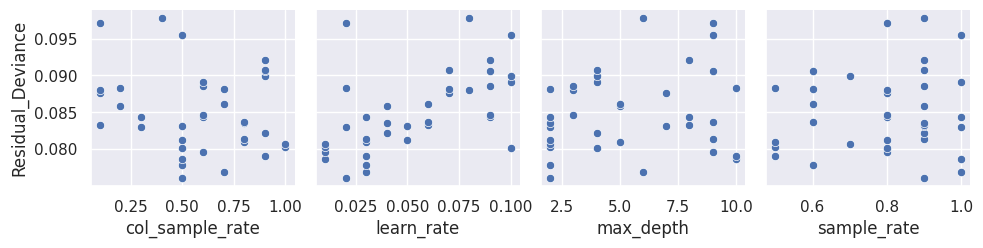

In [217]:
sns.pairplot(
    hyperparameters_dataframe,
    y_vars=["Residual_Deviance"],
    x_vars=["col_sample_rate", "learn_rate", "max_depth", "sample_rate"],
)

# **Hyper Parameter Analysis**

The tuning of four hyperparameters—col sample rate, learn rate, max depth, and sample rate—for an GBM model involved a grid search over a range of values. Below is a summary of that work. A total of 36 hyperparameter combinations were found as a consequence of the search, and the Residual Deviance was determined for each combination as an evaluation metric.

According to the findings, a model with col sample rate of 0.5, learn rate of 0.02, max depth of 2, and sample rate of 1.0 had the lowest Residual Deviance, with a Residual Deviance of 0.076092. The worst-performing models had Residual Deviances above 0.09, while the next best models had Residual Deviances between 0.07 and 0.08.

Overall, the results indicate that hyperparameter adjustment can significantly enhance the performance of an GBM model and that the interaction between col sample rate, learn rate, max depth, and sample rate can have a considerable impact on model performance.

In [218]:
def find_best_model_from_grid(h2o_grid, test_parameter):
    model_list = []
    for grid_item in h2o_grid:
        if test_parameter is "r2":
            if not (grid_item.r2() == "NaN"):
                model_list.append(grid_item.r2())
            else:
                model_list.append(0.0)
        elif test_parameter is "auc":
            if not (grid_item.auc() == "NaN"):
                model_list.append(grid_item.auc())
            else:
                model_list.append(0.0)
    max_index = model_list.index(max(model_list))
    best_model = h2o_grid[max_index]
    print("Model ID with best R2: " + best_model.model_id)
    if test_parameter is "r2":
        print("Best R2: " + str(best_model.r2()))
    elif test_parameter is "auc":
        print("Best AUC: " + str(best_model.auc()))
    return best_model


best_model2 = find_best_model_from_grid(gbm_grid2, "r2")

Model ID with best R2: gbm_grid2_model_7
Best R2: 0.9729457255358147


"is" with a literal. Did you mean "=="?
"is" with a literal. Did you mean "=="?
"is" with a literal. Did you mean "=="?
"is" with a literal. Did you mean "=="?
"is" with a literal. Did you mean "=="?
"is" with a literal. Did you mean "=="?
"is" with a literal. Did you mean "=="?
"is" with a literal. Did you mean "=="?
"is" with a literal. Did you mean "=="?
"is" with a literal. Did you mean "=="?
"is" with a literal. Did you mean "=="?
"is" with a literal. Did you mean "=="?


# **What metric do you employ for evaluation?**

These are the evaluation metrics I'm using:

* Mean Squared Error
* Root Mean Squared Error
* Mean Absolute Error
* Mean Residual Deviance
* Accuracy

Given that the issue is one of regression, the optimal model is evaluated using these evaluation measures. The most crucial metrics utilized to assess the mode in this case are Mean Residual Deviance and Accuracy.

The residual deviation indicates how effectively a model with p predictor variables can predict the response variable. The model's ability to predict the value of the response variable improves with decreasing value.

Our model's accuracy reveals how accurate and exact it is.

In [219]:
best_model2

,number_of_trees,number_of_internal_trees,model_size_in_bytes,min_depth,max_depth,mean_depth,min_leaves,max_leaves,mean_leaves
,100.0,100.0,26998.0,6.0,9.0,8.55,10.0,20.0,16.76
,timestamp,duration,number_of_trees,training_rmse,training_mae,training_deviance,validation_rmse,validation_mae,validation_deviance
,2023-04-10 00:55:45,3.163 sec,0.0,0.3801498,0.2890277,0.1445138,0.3727760,0.2834758,0.1389619
,2023-04-10 00:55:45,3.167 sec,1.0,0.3553423,0.2698217,0.1262682,0.3512089,0.2675000,0.1233477
,2023-04-10 00:55:45,3.170 sec,2.0,0.3367798,0.2549465,0.1134206,0.3338801,0.2525495,0.1114759
,2023-04-10 00:55:45,3.173 sec,3.0,0.3185339,0.2397958,0.1014639,0.3195363,0.2417075,0.1021034
,2023-04-10 00:55:45,3.176 sec,4.0,0.3009974,0.2251495,0.0905994,0.3073038,0.2313483,0.0944356
,2023-04-10 00:55:45,3.179 sec,5.0,0.2873448,0.2128533,0.0825670,0.2987796,0.2232014,0.0892692
,2023-04-10 00:55:45,3.182 sec,6.0,0.2738600,0.2007216,0.0749993,0.2913195,0.2153284,0.0848670
,2023-04-10 00:55:45,3.184 sec,7.0,0.2631776,0.1904368,0.0692625,0.2855952,0.2079407,0.0815646


In [220]:
# Evaluating the model on Test Data
autoML_best_predictions_2 = best_model2.predict(df1_test).round()
autoMLpredictions_2 = h2o.as_list(autoML_best_predictions_2, use_pandas=False)
y_test_h2O_2 = h2o.as_list(df1_test["is_diab"], use_pandas=False)


gbm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


In [221]:
accuracy_aml2 = accuracy_score(y_test_h2O_2, autoMLpredictions_2)
print(f"Accuracy = {accuracy_aml2 : .3f}")

Accuracy =  0.975


In [222]:
print(
    "Accuracy of predicting diabetes in a patient using diagnostic measures using Logistic Regression = ",
    accuracy_lr
)
print(
    "Accuracy of predicting diabetes in a patient using diagnostic measures using Random Forest Classifier = ",
    accuracy_rf
)
print(
    "Accuracy of predicting diabetes in a patient using diagnostic measures using Best AutoML Model with tuned hyperparameters = ",
    accuracy_aml2
)


Accuracy of predicting diabetes in a patient using diagnostic measures using Logistic Regression =  0.8461538461538461
Accuracy of predicting diabetes in a patient using diagnostic measures using Random Forest Classifier =  0.8974358974358975
Accuracy of predicting diabetes in a patient using diagnostic measures using Best AutoML Model with tuned hyperparameters =  0.975


# **Model Selection**

From the above summary of the models trained on the dataset, the two best models are SVM and AutoML's best model with tuned hyperparameters.

1. AutoML's Hyperparameter Tuned Version ~ 96.0%
2. Logistic Regression with an Accuracy of ~ 84.61%



# **SHAP, Partial Dependence Plot, Individual Conditional Expectation Analysis for AutoML Best Model**

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

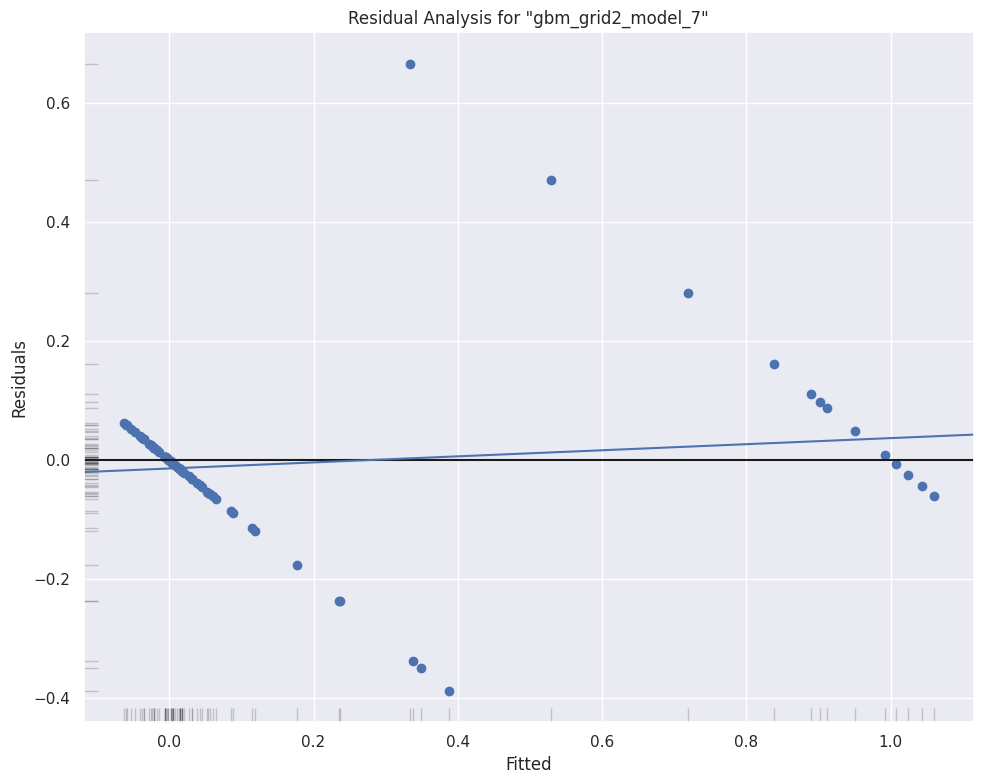

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

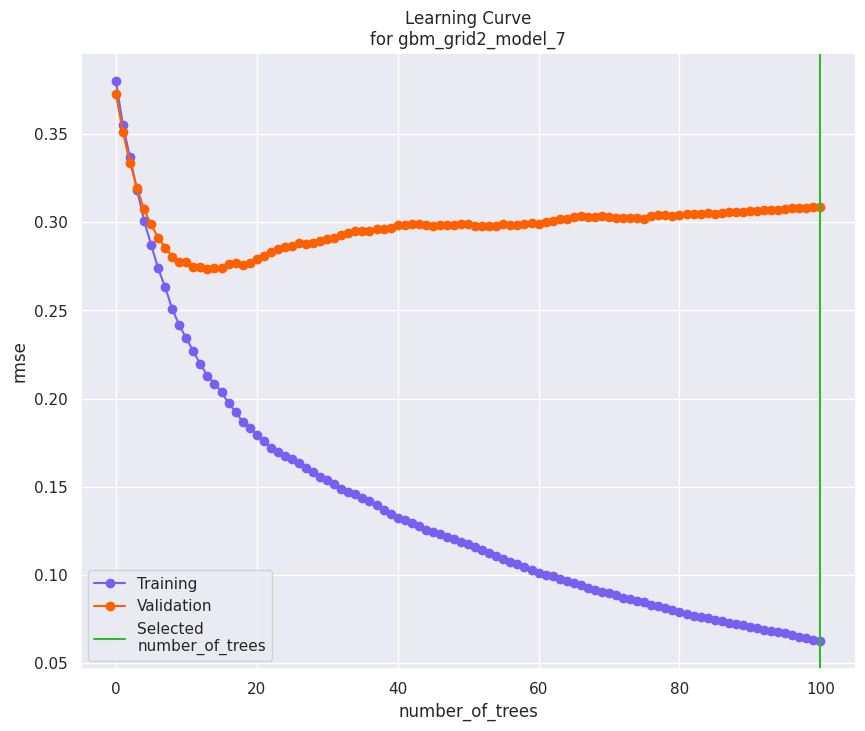

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

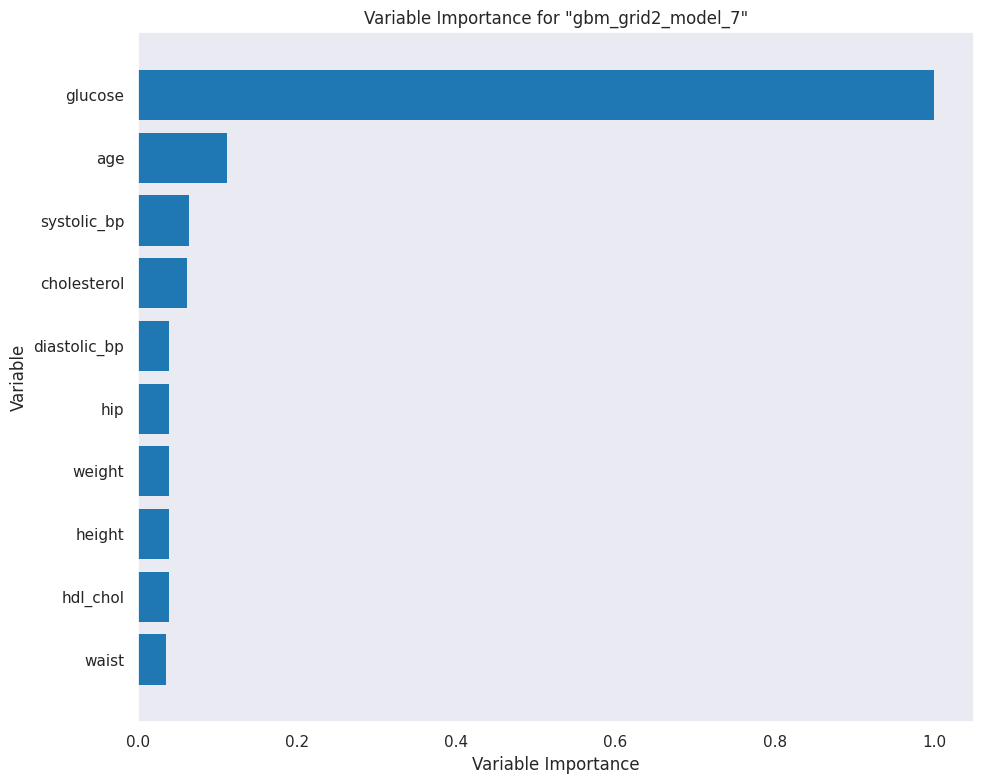

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

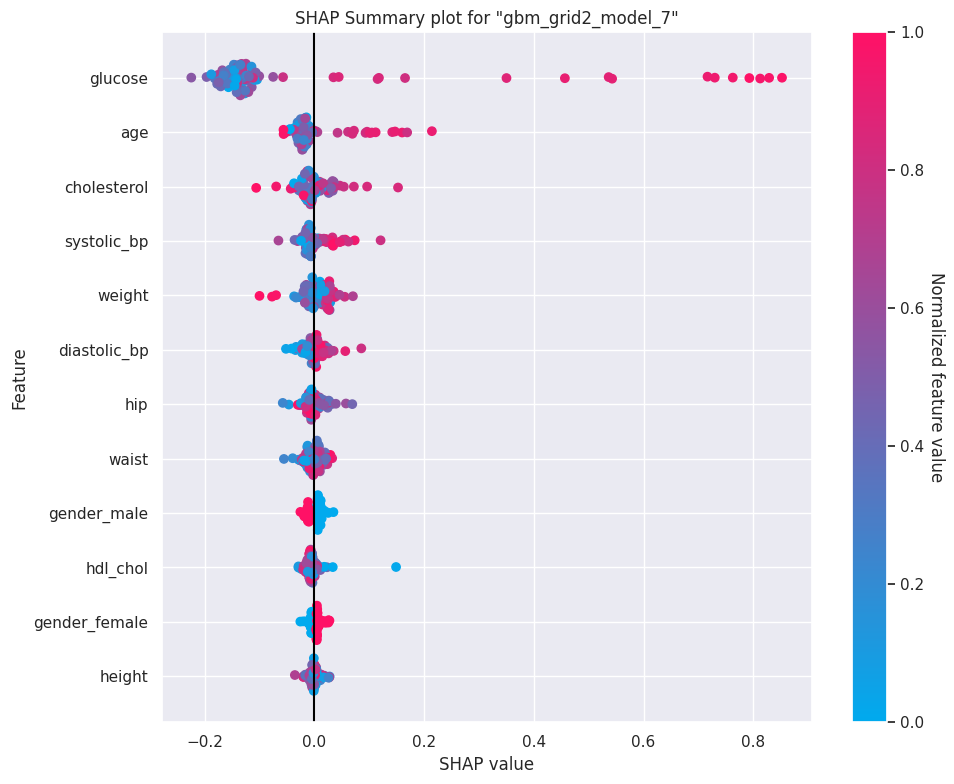

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

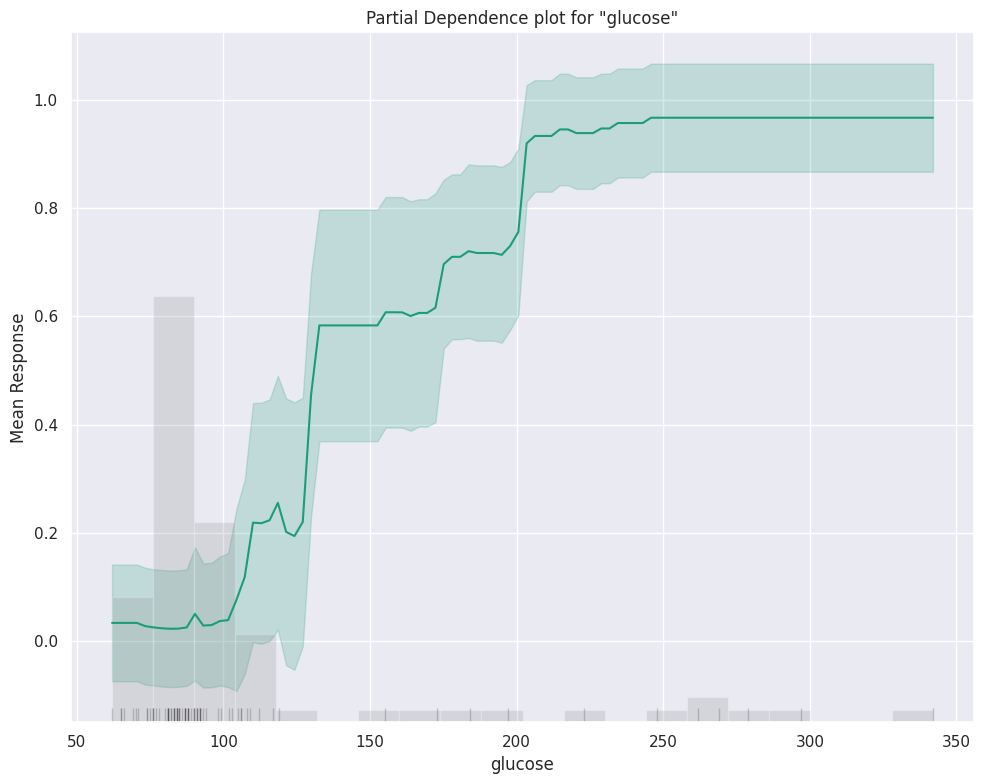

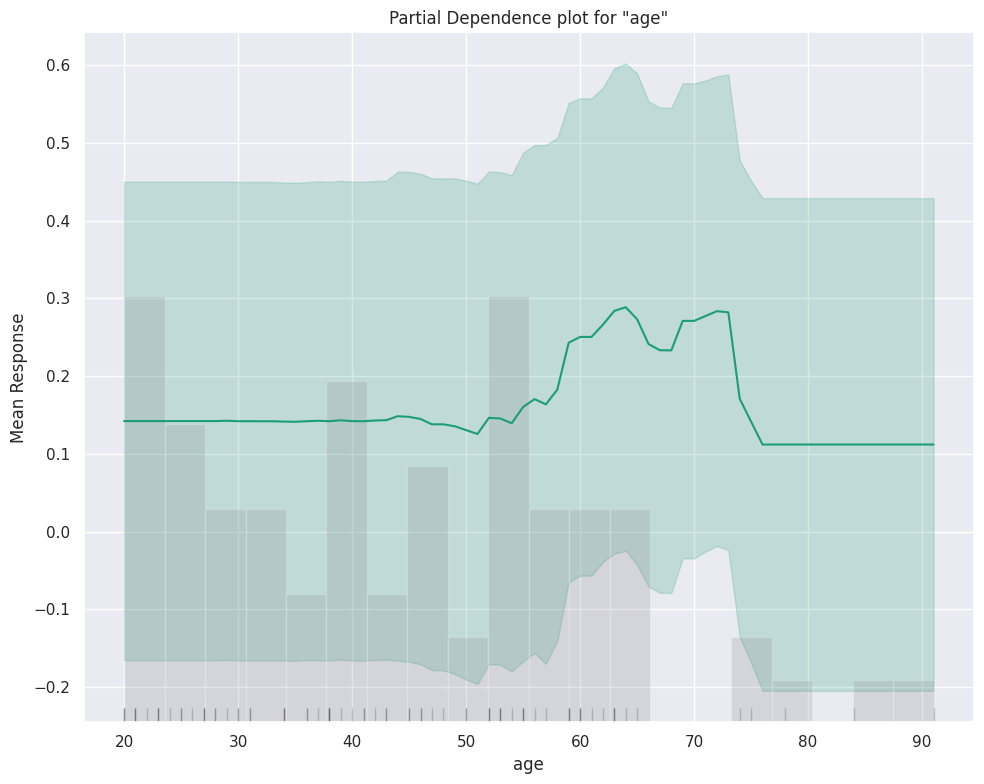

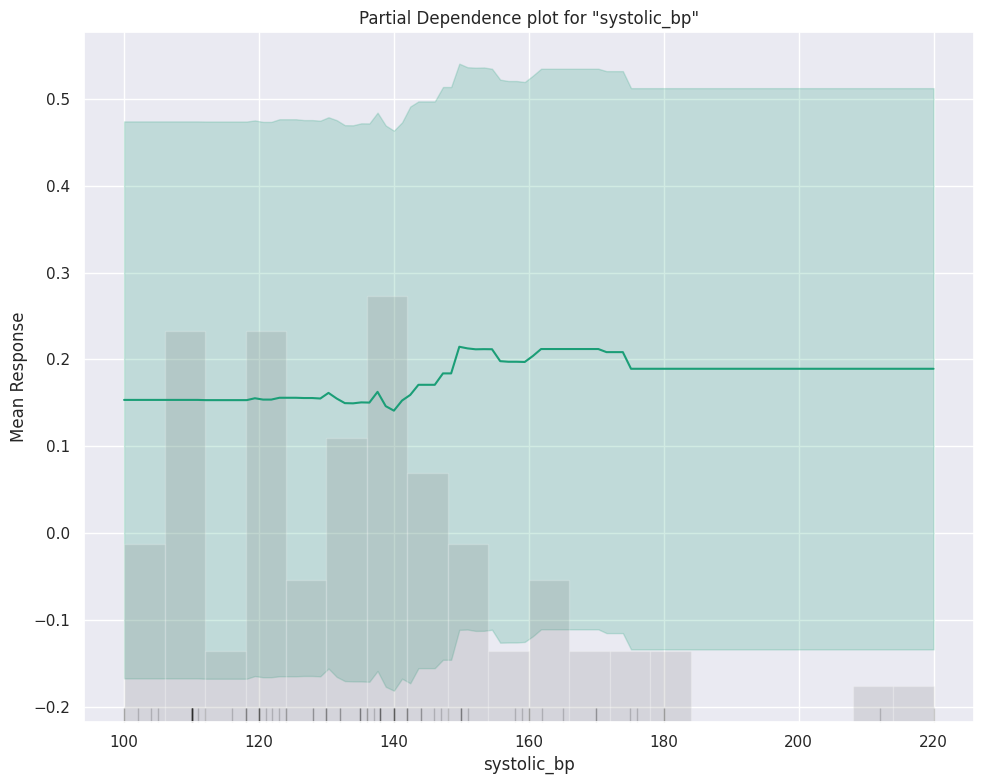

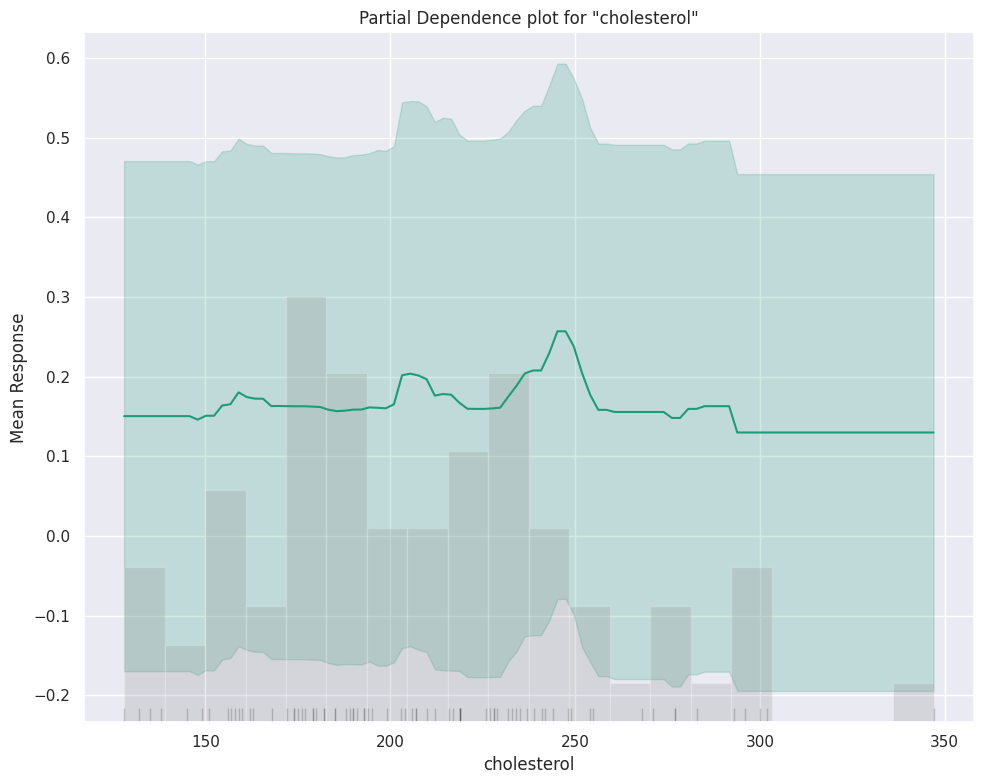

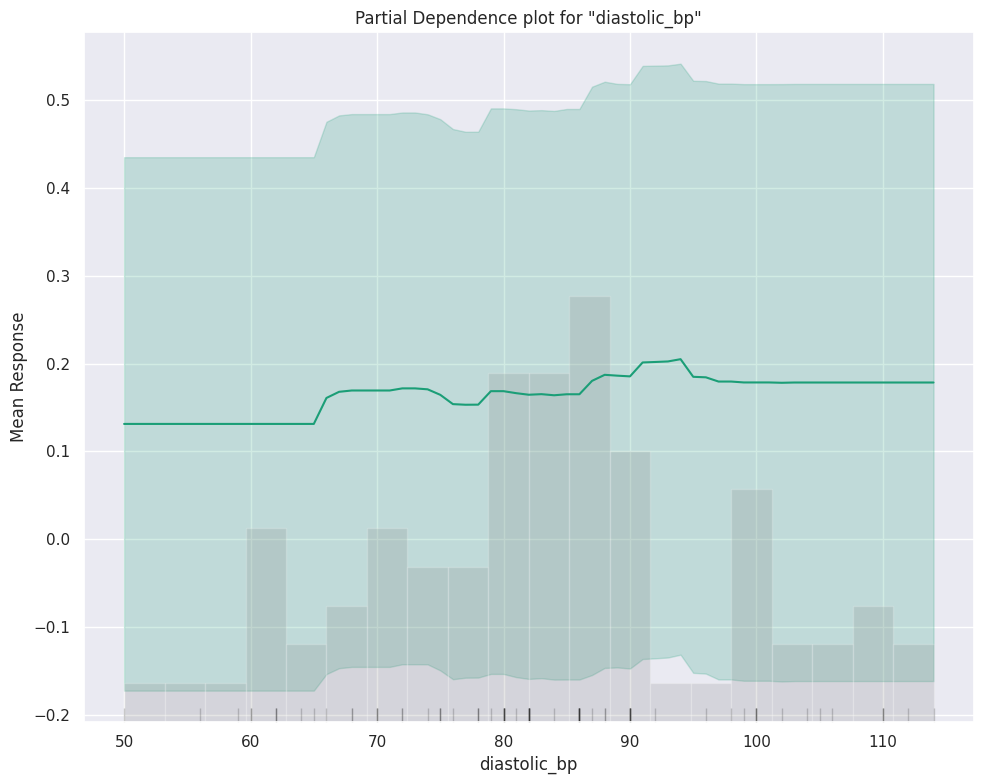

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

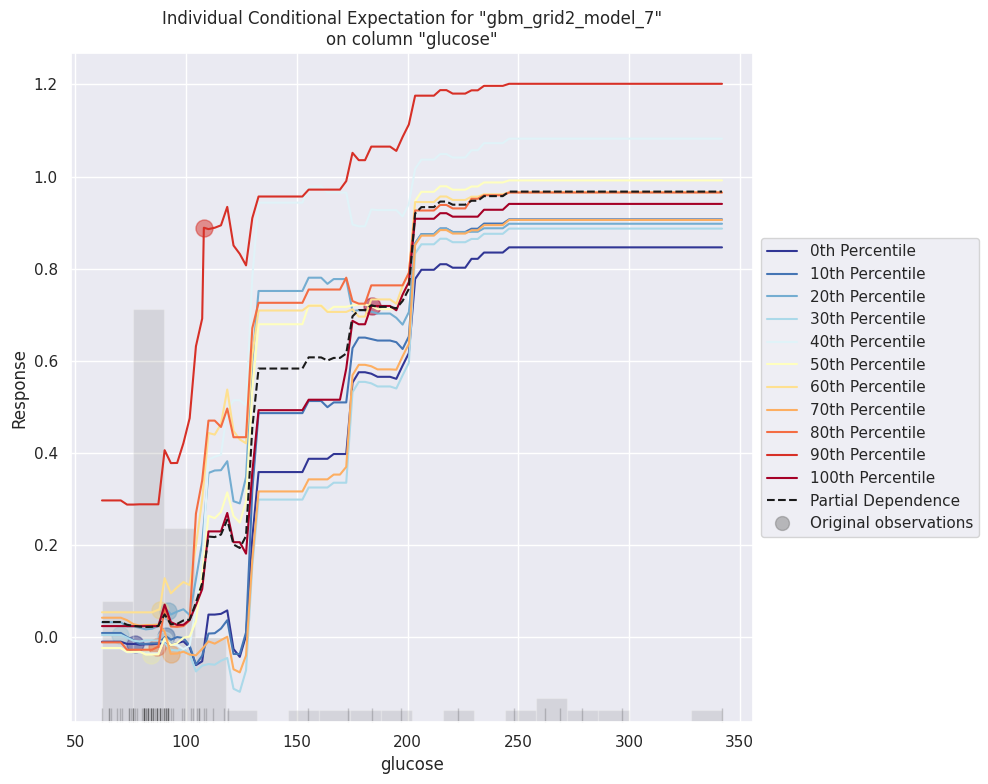

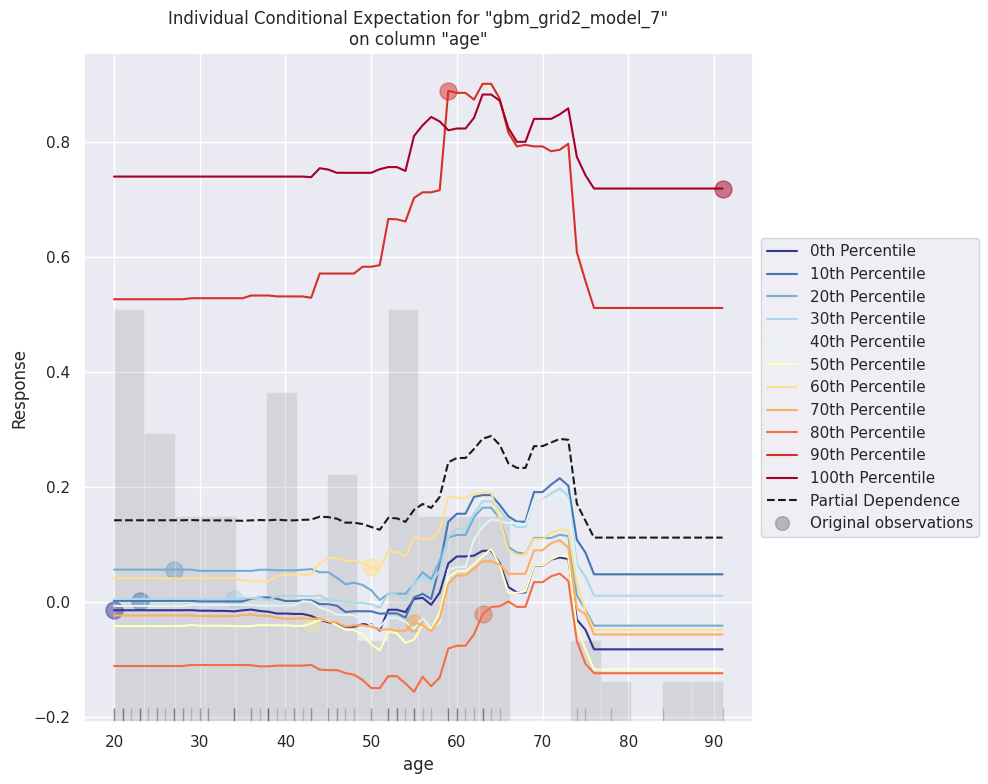

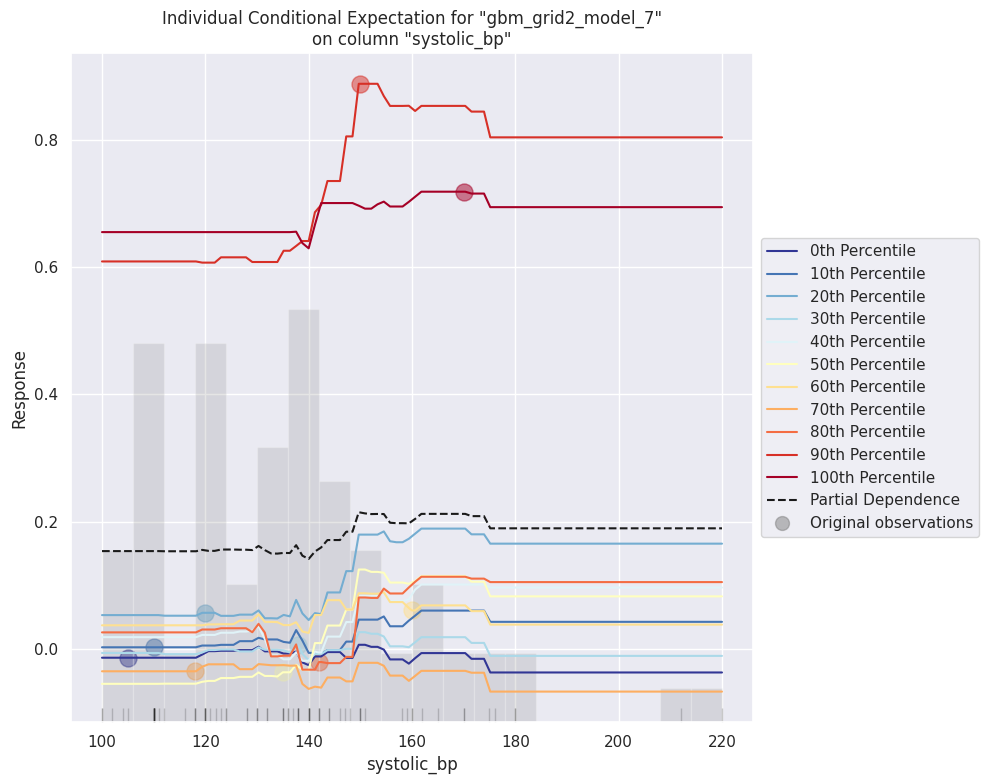

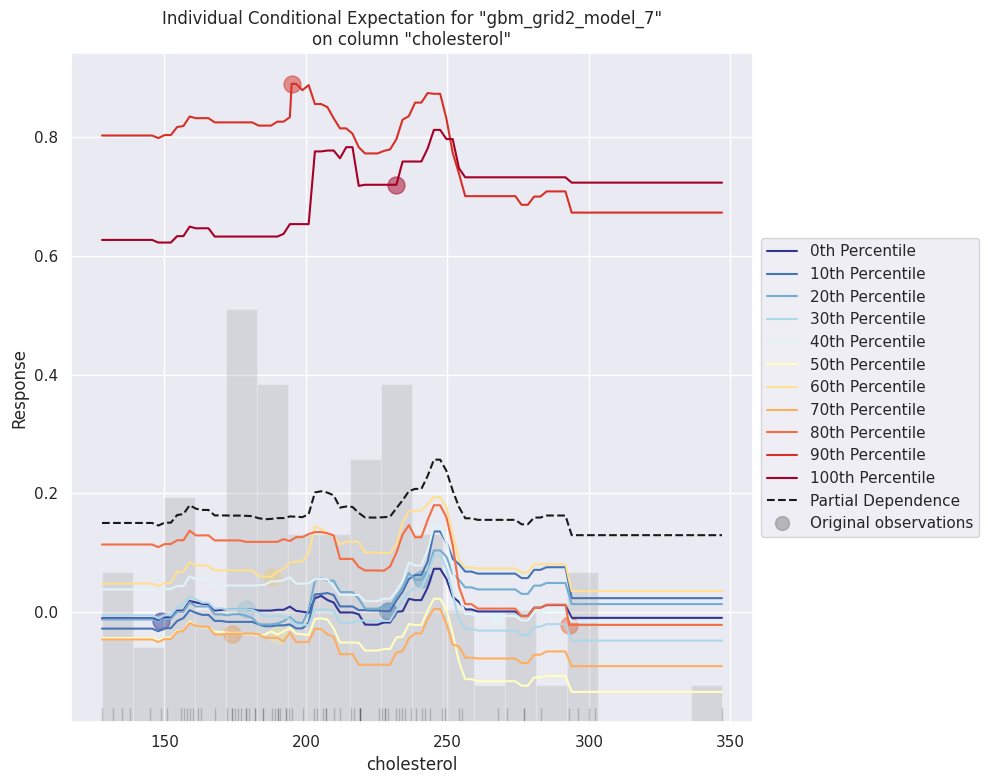

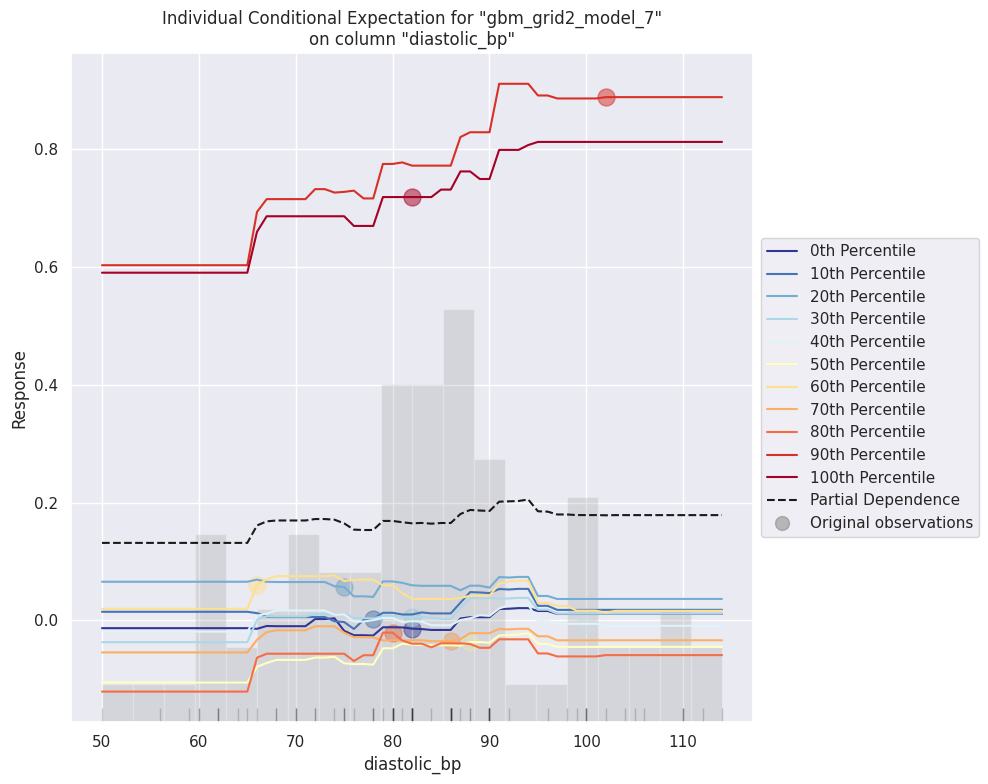

In [224]:
# explain_model = aml.explain(frame = df1_test, figsize = (10,8))
explain_model = best_model2.explain(frame = df1_test, figsize = (10,8))

# **Interpreting Best Model from AutoML**

# Residual Analysis
Here, the residuals are visible as striped lines, which is an effect of using an integer number as the response value rather than a real value. The graph below also shows that residuals have a normal distribution. Remainders denote the absence of heteroscedasticity in the residuals.

# Variable Importance
We can see from the variable importance plot that the plot duplicates the outcomes from the aforementioned linear model and tree-based model. For clarity, the variable importance has been scaled from 0 to 1.

# SHAP Summary
From the SHAP summary diagram, we can interpret a few conclusions -

Glucose is the most significant component, followed by Cholestrol, and so on. The other factors are given according to their significance in generating the forecast. Gender is therefore the least important predictor in our model.

The feature's influence on the prediction, whether positive or negative, is shown by its location on the SHAP value axis. In other words, the impact of a data point increases with the distance between it and the shap value of 0.0. As we can see, glucose has the greatest influence in the prediction of diabetes. The dot's color denotes the influence of the value on the outcome (Red - High, Blue - Low). For example, a patient with a high glucose content will be diabetic.

# Partial Dependence Plot(PDP)

The marginal impact of a feature on the target is depicted by a partial dependence graphic (prediction of diabetes in our dataset). It is accomplished by maintaining the values of all other variables constant while modifying one variable's value to determine its PDP.

For Interpretation purposes, let us pick up the two most important variables - Glucose and Cholestrol.

1. The mean reaction increases glucose levels, as can be seen when the other variables are held constant and the glucose level is marginally changed. This could be taken to mean that the diabetes may depend on the glucose in this range. 
2. In a similar way, we can see the mean response of increasing between the cholesterol range when the other variables are held constant and a little adjustment in cholesterol is made. So, it can be inferred that this range determines the prediction of diabetes.

It is simple to calculate partial dependence plots: If we compel all data points to assume a certain feature value, the partial dependence function at that feature value represents the average prediction.

# SHAP Explanation

> SHAP explanation shows contribution of features for a given instance. The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function. H2O implements TreeSHAP which when the features are correlated, can increase contribution of a feature that had no influence on the prediction.

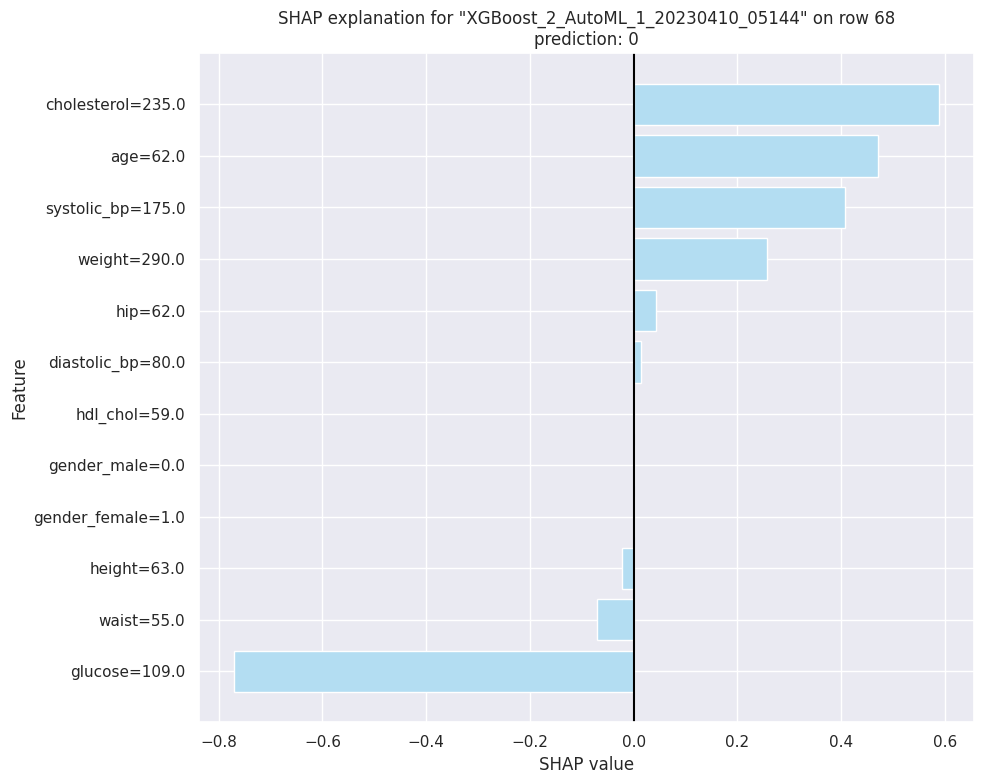

# SHAP Explanation

> SHAP explanation shows contribution of features for a given instance. The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function. H2O implements TreeSHAP which when the features are correlated, can increase contribution of a feature that had no influence on the prediction.

In [225]:
aml.explain_row(frame = df1_test, row_index = 68, figsize = (10,8), exclude_explanations = "leaderboard")

# SHAP Explanation

> SHAP explanation shows contribution of features for a given instance. The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function. H2O implements TreeSHAP which when the features are correlated, can increase contribution of a feature that had no influence on the prediction.

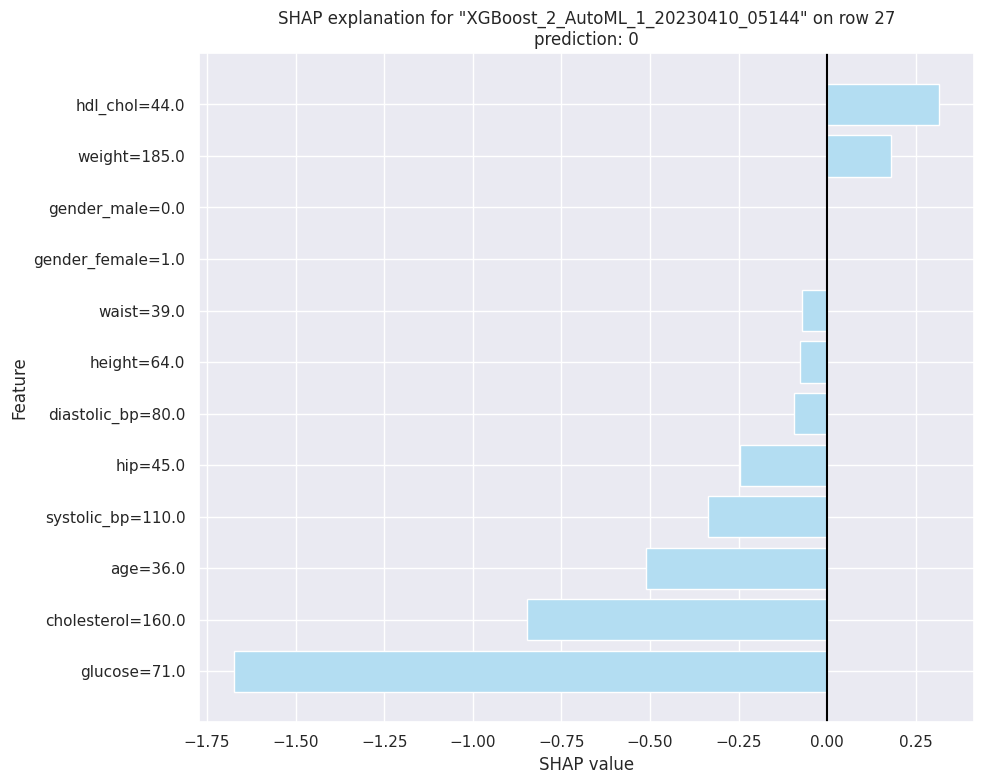

# SHAP Explanation

> SHAP explanation shows contribution of features for a given instance. The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function. H2O implements TreeSHAP which when the features are correlated, can increase contribution of a feature that had no influence on the prediction.

In [226]:
aml.explain_row(frame = df1_test, row_index = 27, figsize = (10,8), exclude_explanations = "leaderboard")

Permutation explainer: 352it [00:34,  6.17it/s]                         


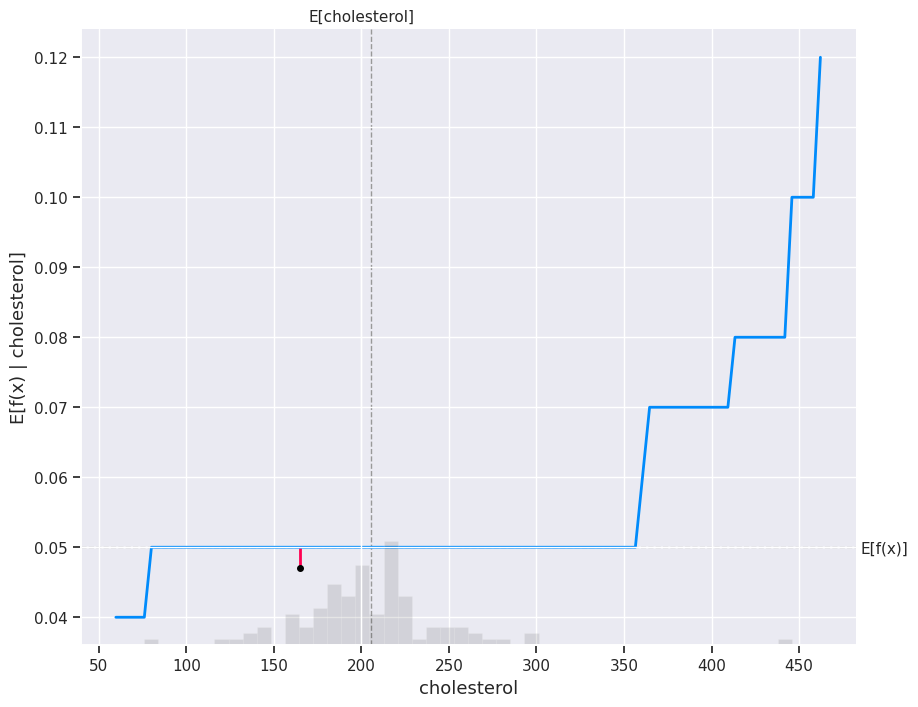

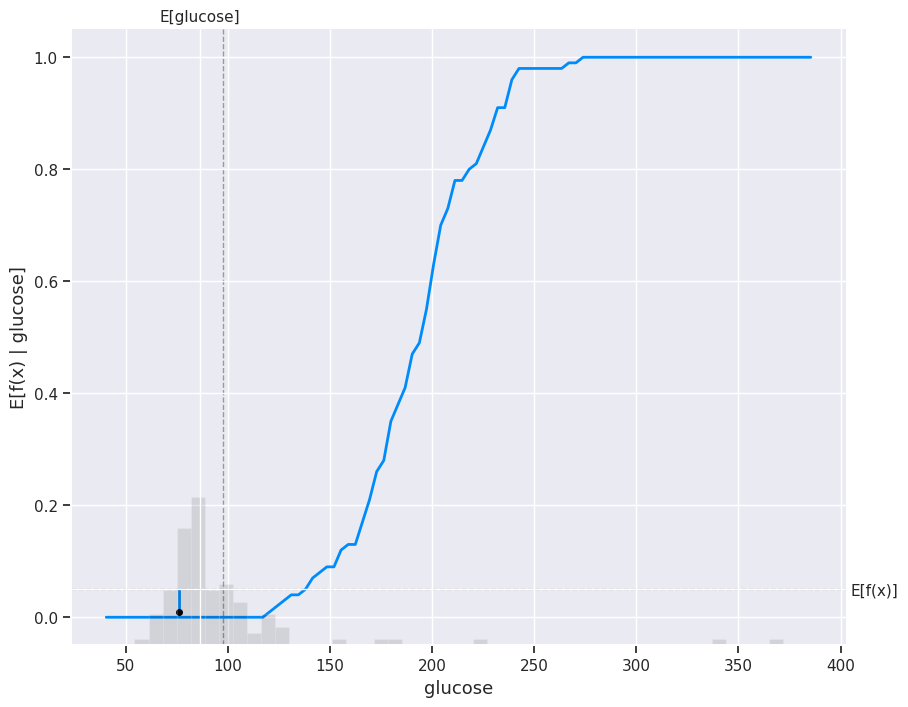

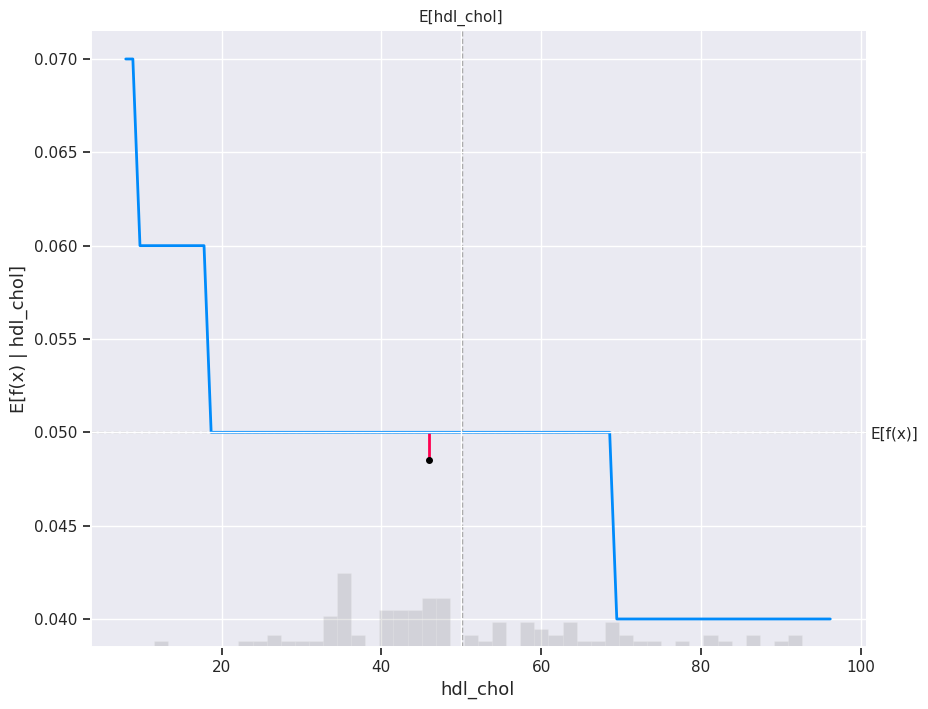

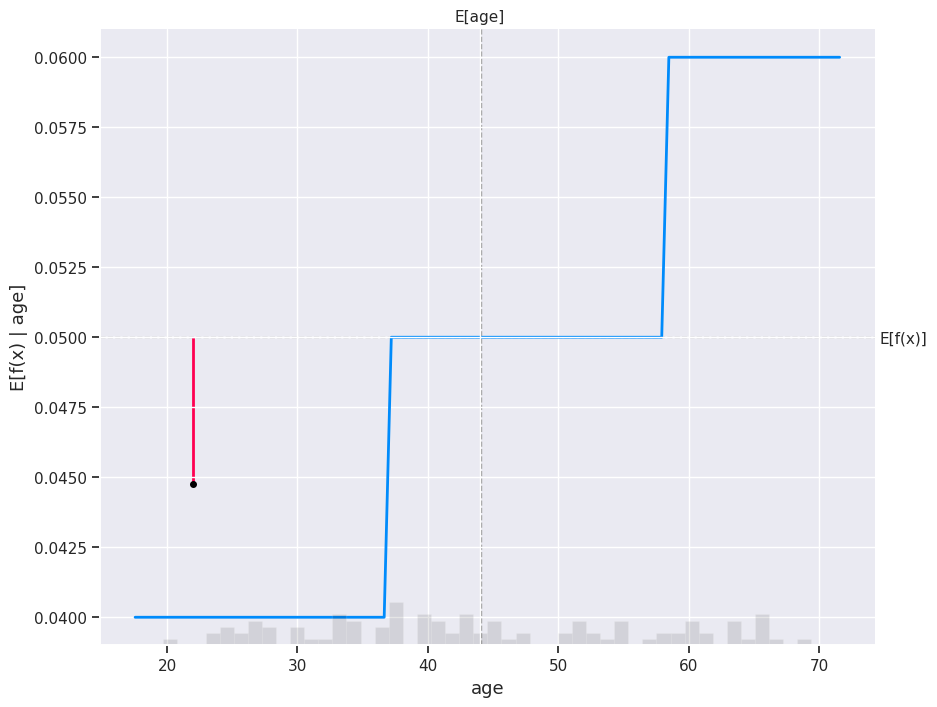

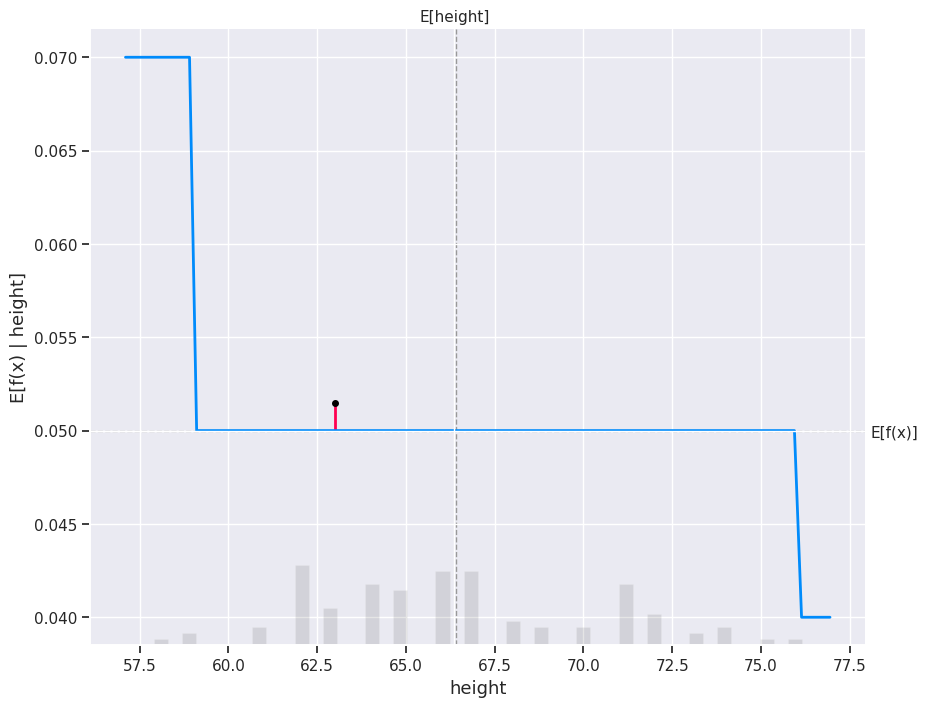

...

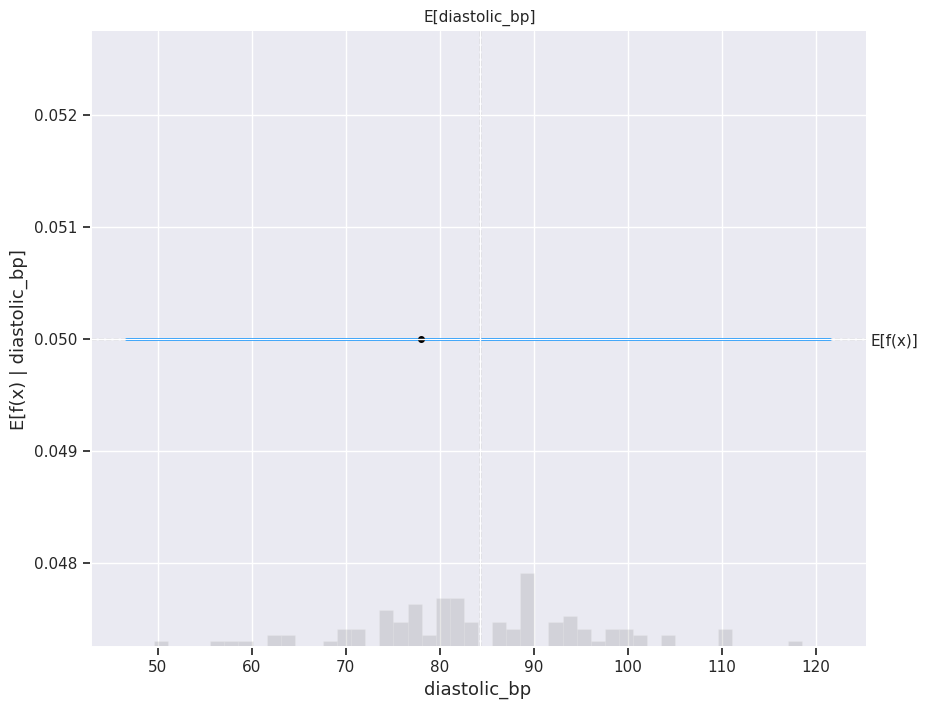

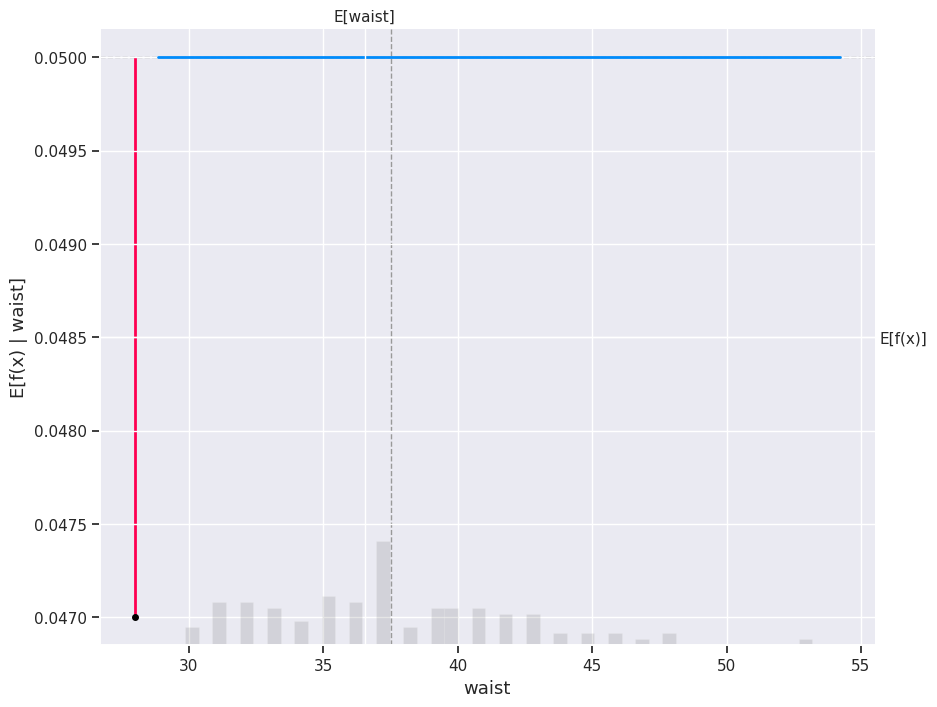

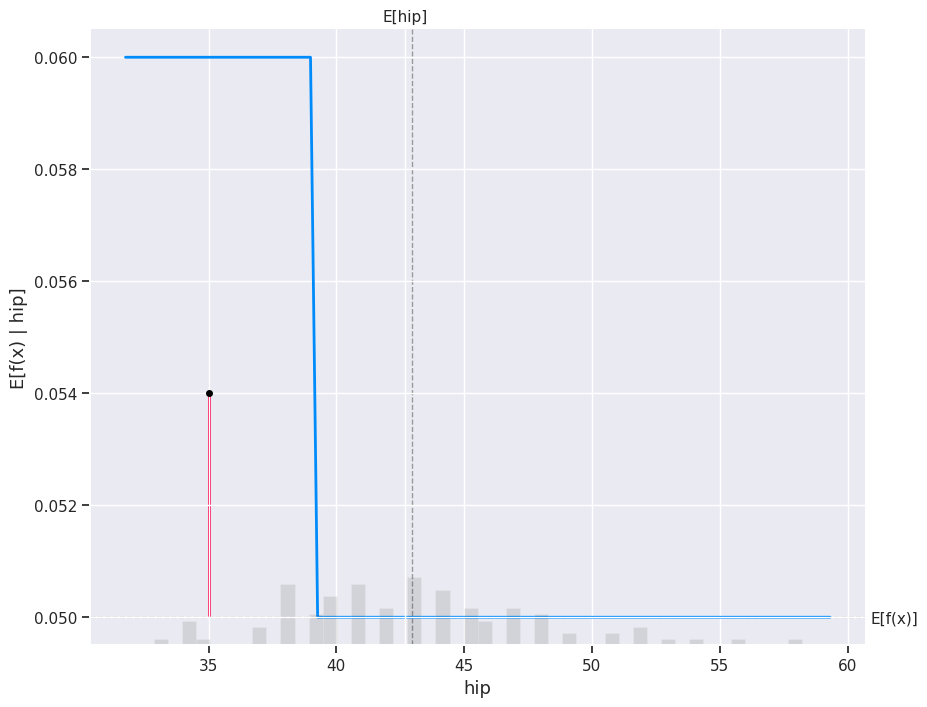

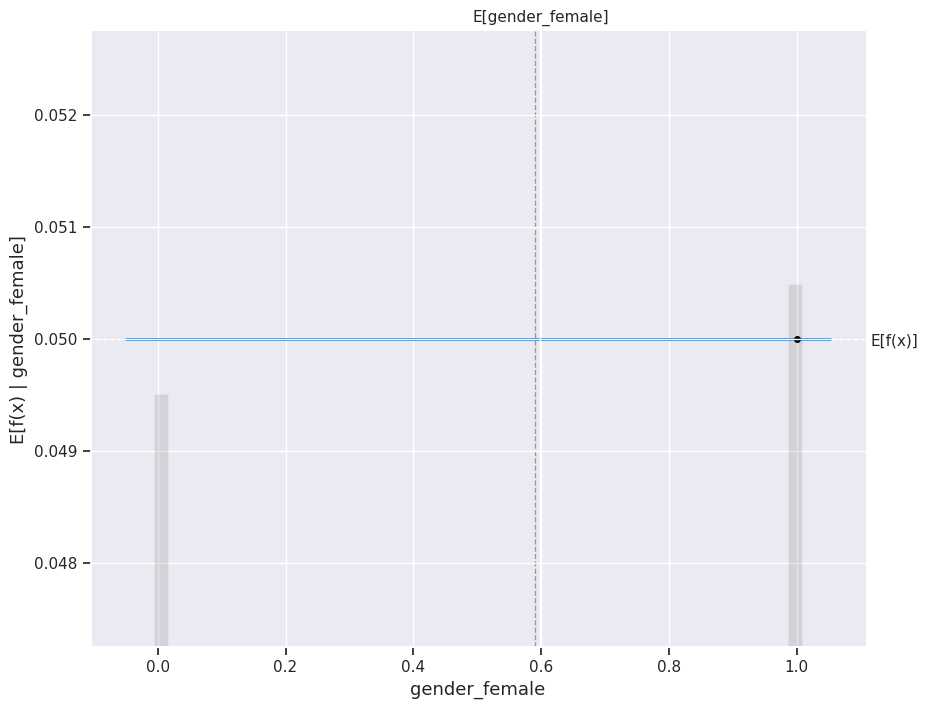

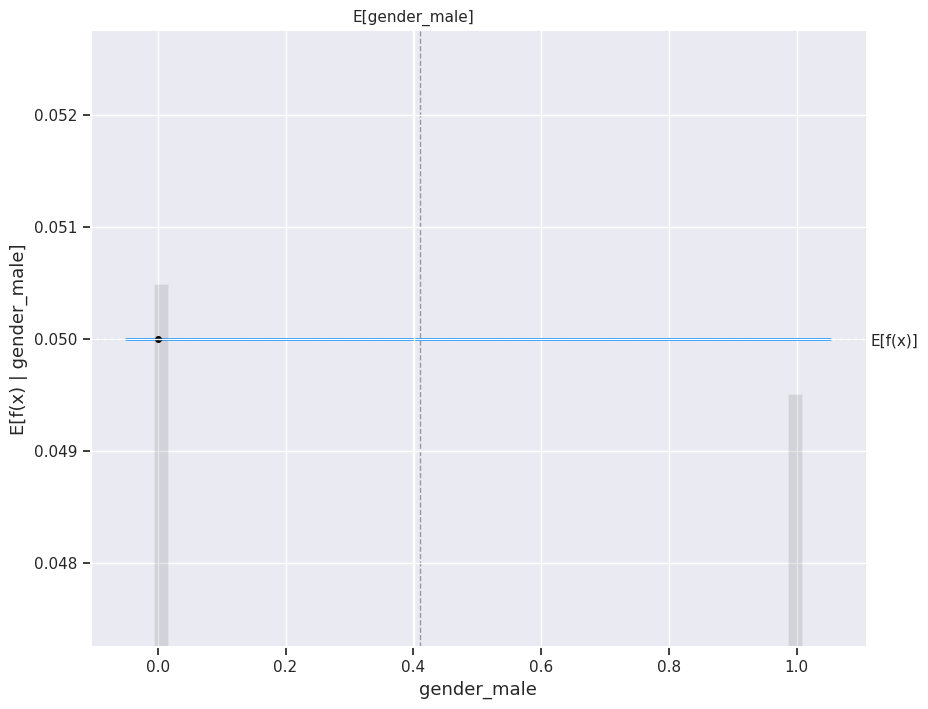

In [227]:
# SHAP explanation of a Linear Model
linear_explainer = shap.Explainer(regr.predict, X_train_100)
linear_shap_values = linear_explainer(X_train)
for i in X_train.columns:
    # make a standard partial dependence plot
    sample_ind = 18
    shap.partial_dependence_plot(
        i,
        regr.predict,
        X_train_100,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=linear_shap_values[sample_ind : sample_ind + 1, :],
    )

Permutation explainer: 352it [00:47,  5.83it/s]


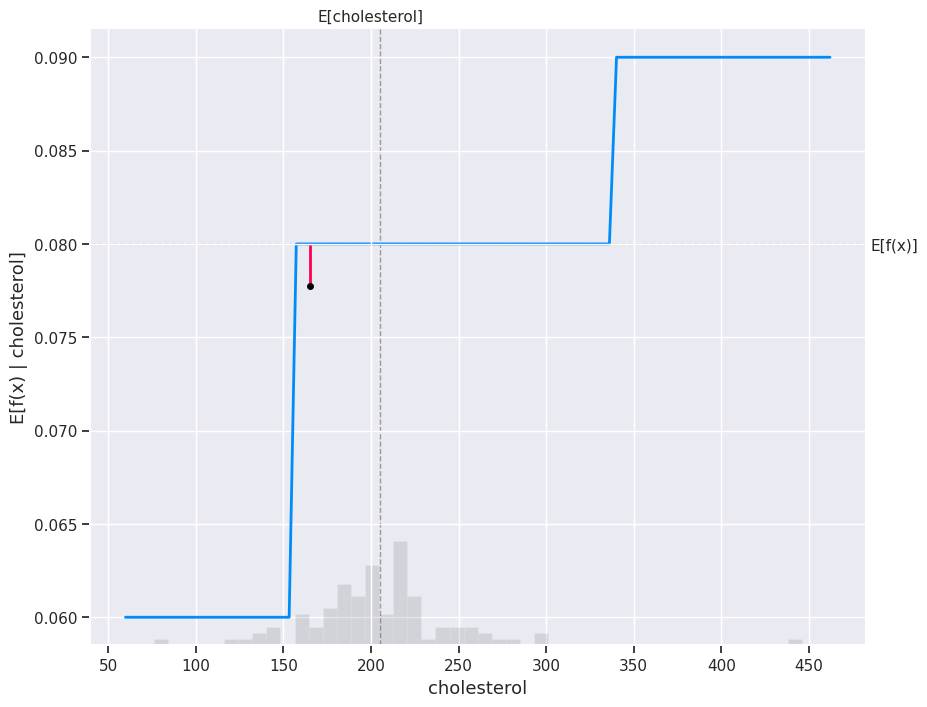

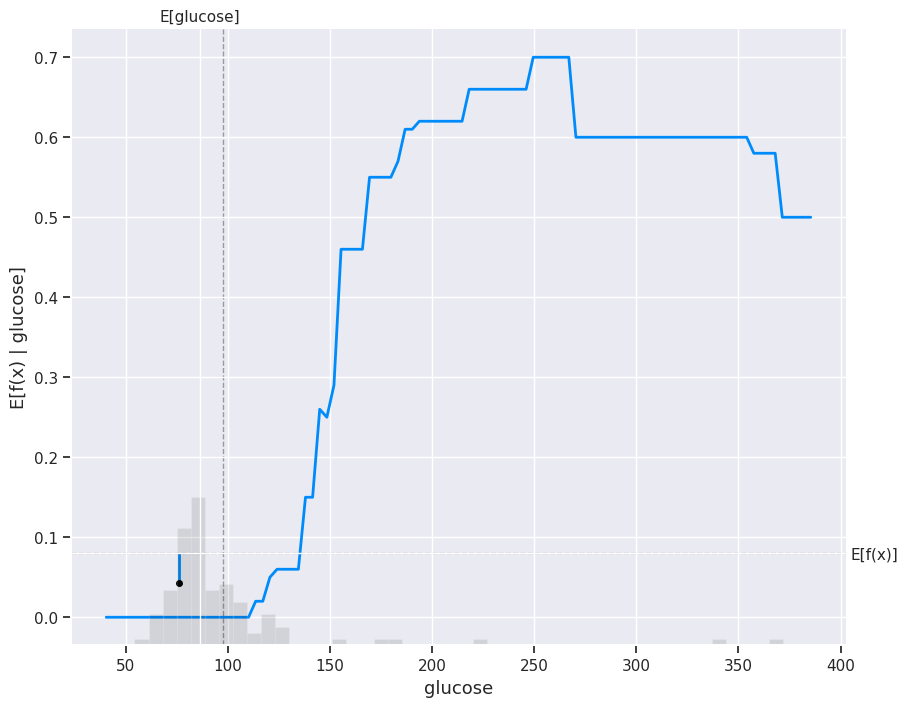

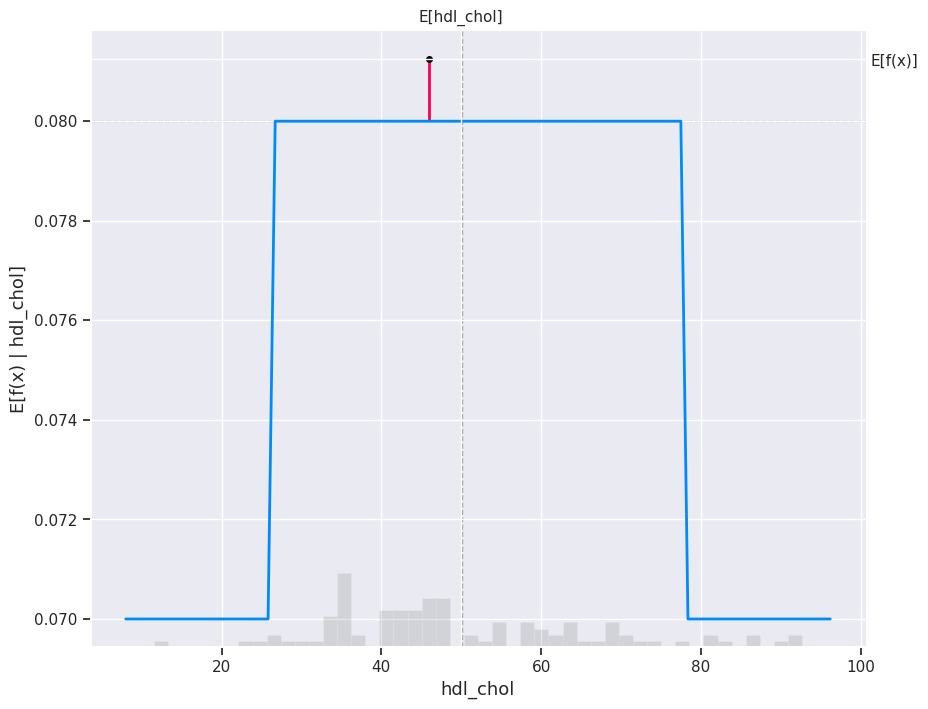

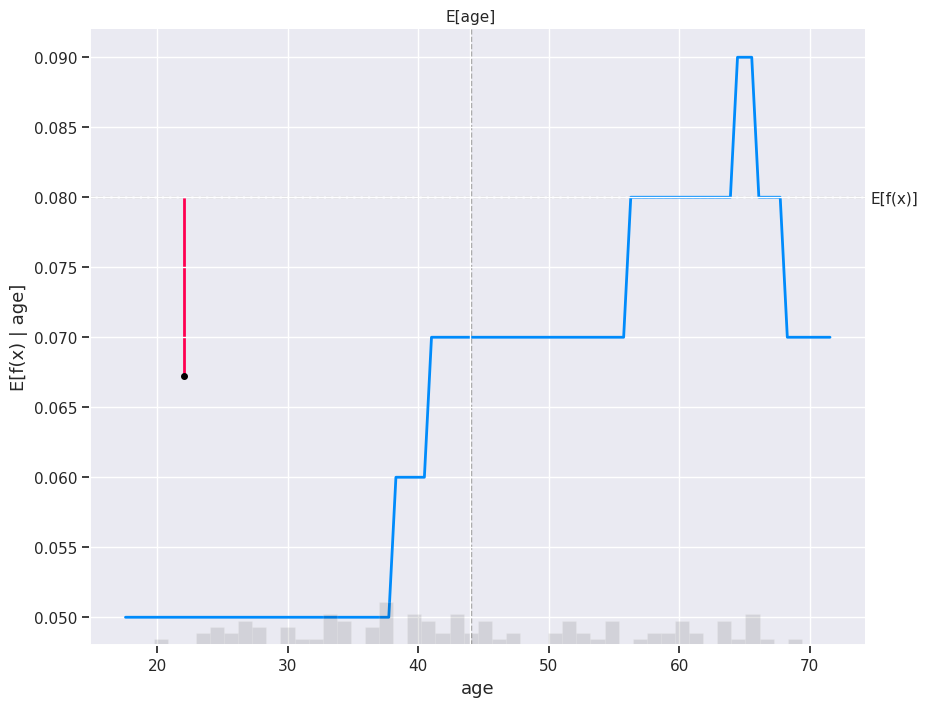

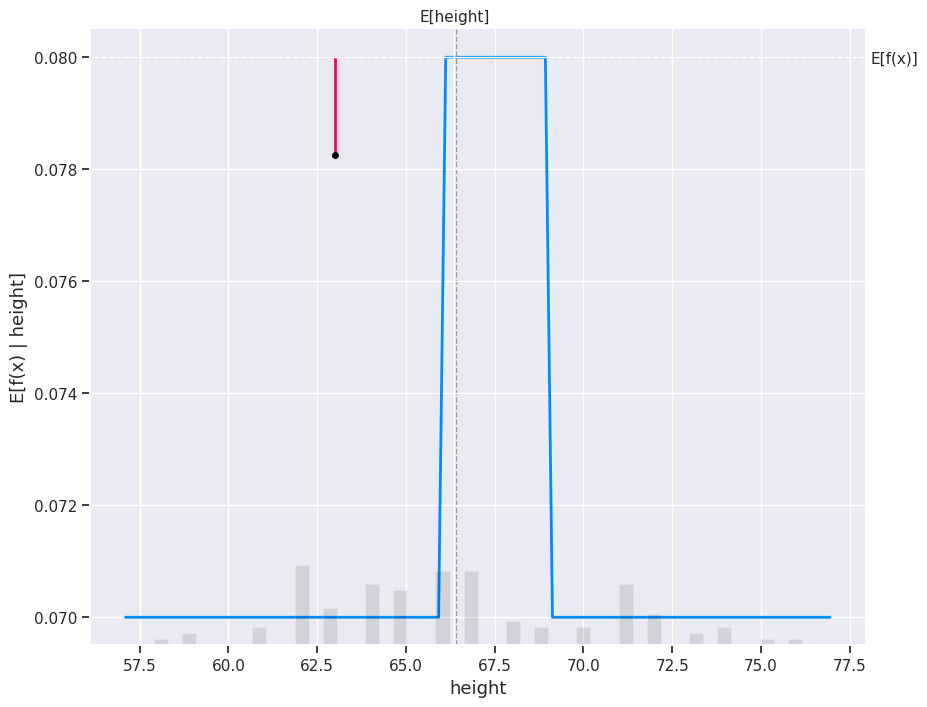

...

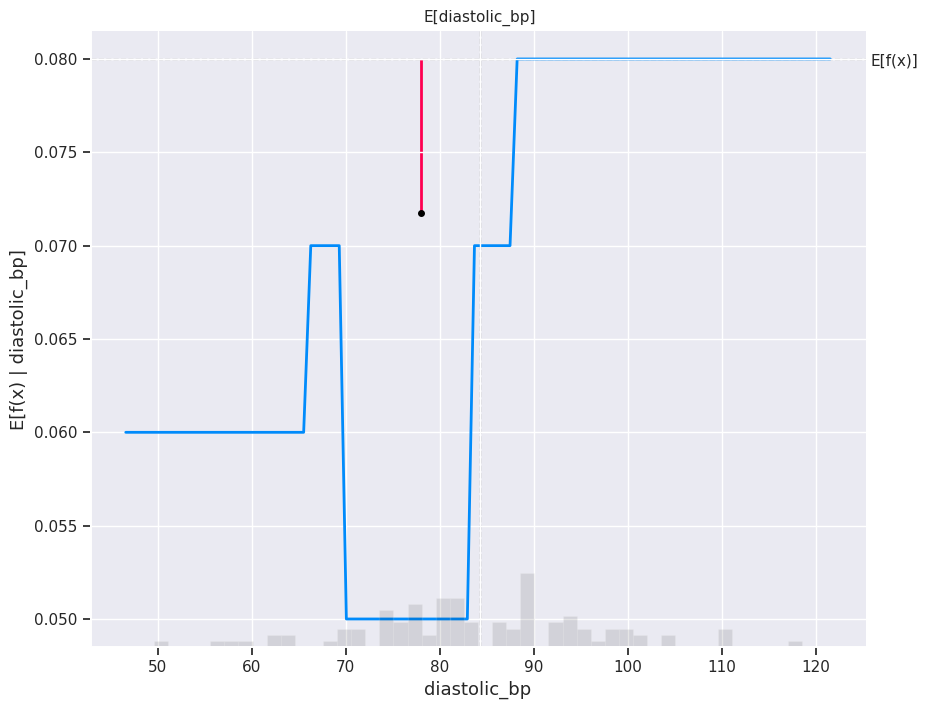

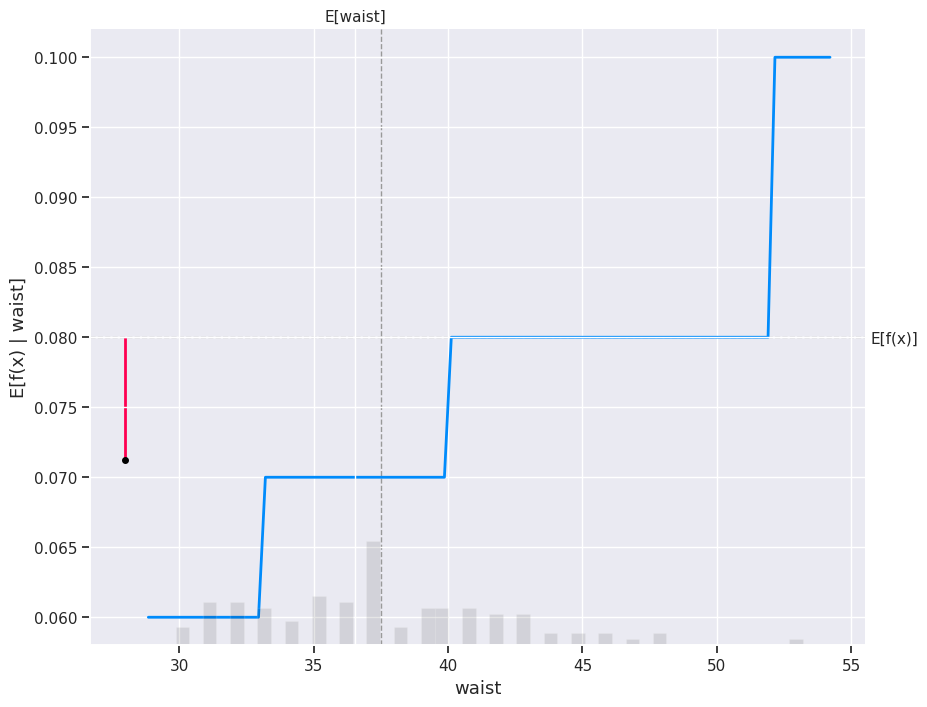

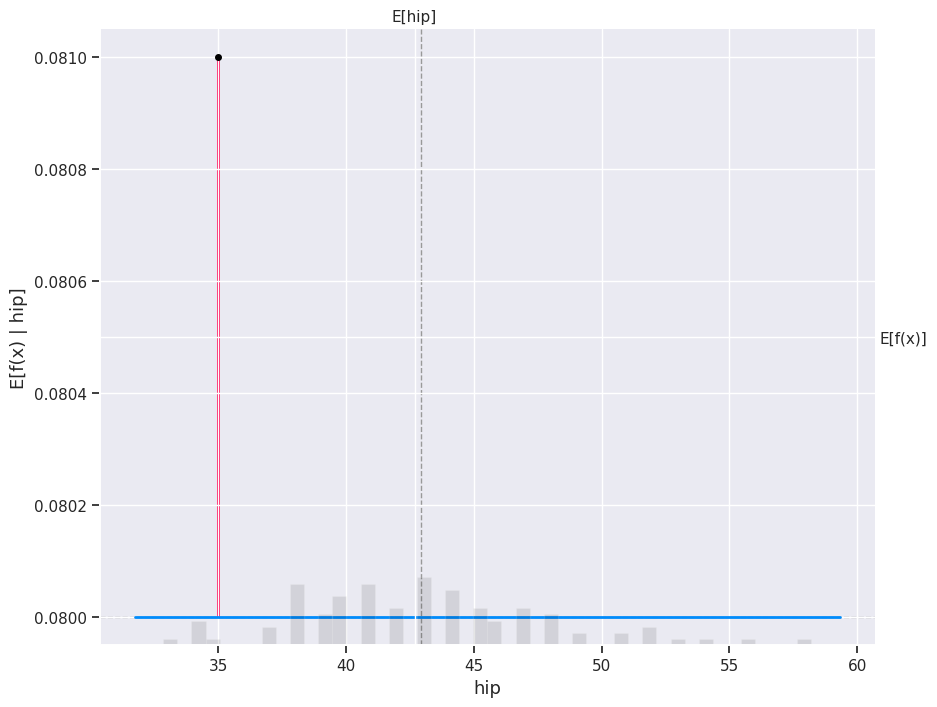

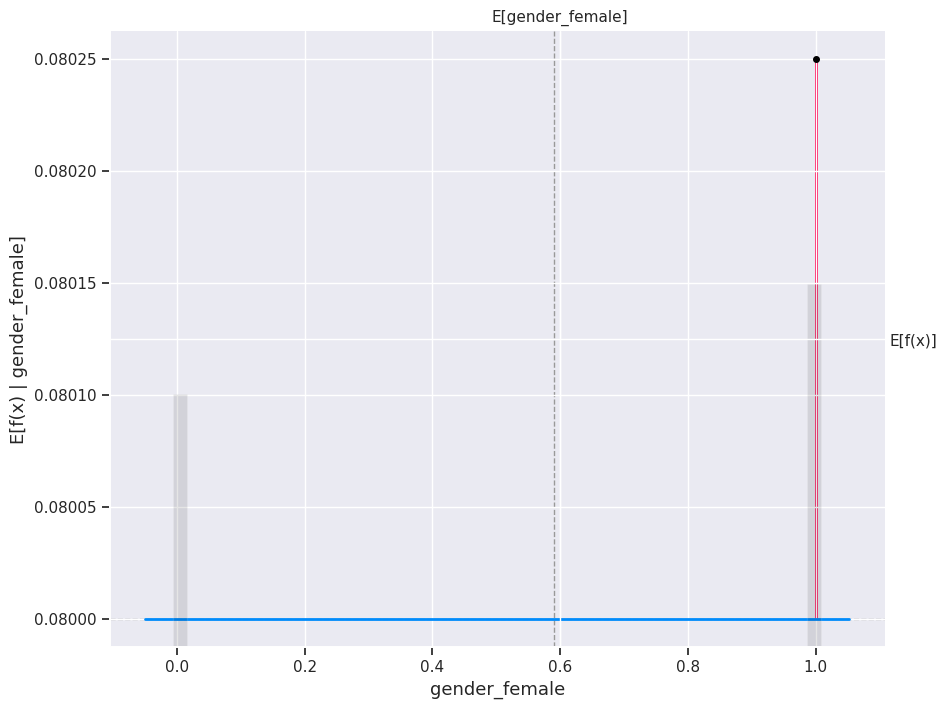

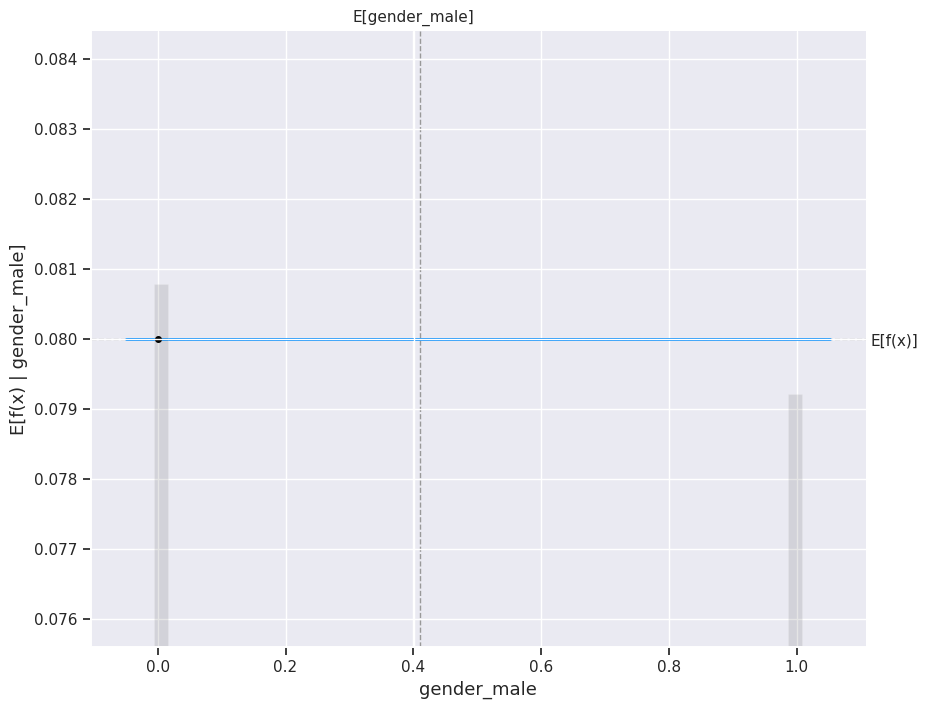

In [228]:
# SHAP explanation of a Tree based Model
tree_explainer = shap.Explainer(rf_model.predict, X_train_100)
tree_shap_values = tree_explainer(X_train)
for i in X_train.columns:
    # make a standard partial dependence plot
    sample_ind = 18
    shap.partial_dependence_plot(
        i,
        rf_model.predict,
        X_train_100,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=tree_shap_values[sample_ind : sample_ind + 1, :],
    )

# **SHAP Analysis for Linear Model and Tree Based Model**

Here, the output is on the y-axis as we vary the feature, and the x-axis represents the feature. The gray histogram represents the dataset's variable distribution, and the cross formed by E[Feature] and E[f(x)] represents the anticipated values.

Let us take a feature of Cholesterol:

1. For the Linear model the cross is made at approx E[f(x)] 0.05
2. For the Tree Based model the cross is made at approx E[f(x)] 0.093

When we provide a sample as an input (sample ind = 18) to examine the result, the red line on the plot appears. We may visualize the deviation between the model output and the expected value by charting this.

# **Interpreting SHAP Feature Importance Plot for Linear and Tree-based model**

It's easy to understand the concept underlying SHAP feature importance: Features with high absolute Shapley values are significant. We average the absolute Shapley values for each feature throughout the data because we want to determine global relevance. The features are then sorted and plotted in decreasing order of relevance.

The plots listed below are

1. The significance of SHAP features for a linear model
2. Importance of SHAP characteristic for tree-based model

There is a difference in feature importance for both models, as seen below in the charts.

While systolic_bp is the second-most important feature in our tree-based model when we take the average of SHAP values into account to determine feature importance, age is the second-most important feature in the linear model.

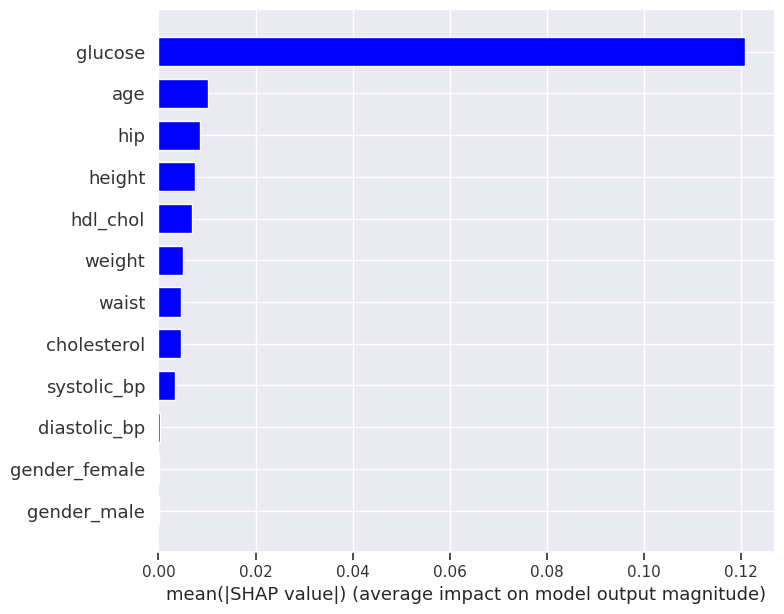

In [229]:
# SHAP variable importance for a Linear Model
shap.summary_plot(linear_shap_values, X_train, plot_type="bar", color="blue")

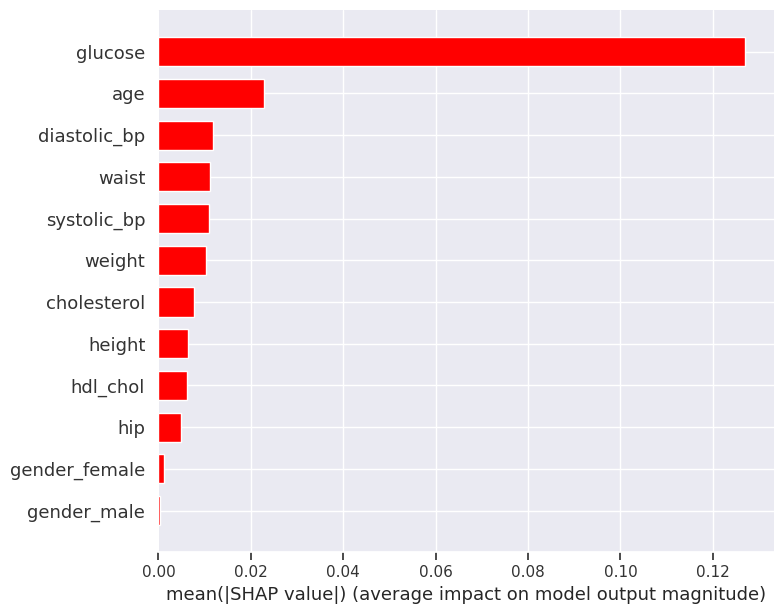

In [230]:
# SHAP variable importance for a Tree based Model
shap.summary_plot(tree_shap_values, X_train, plot_type="bar", color="red")

# **Interpreting Waterfall SHAP Visualization**

Let's consider the same sample (sample_ind = 18)

1. Note that the waterfall model's value for Cholesterol matches the partial dependence graphic from SHAP. It states that the model output was f(x) = -0 while the expected output for this sample was f(x) = 0.05. Given that the difference is only 0.05, we were really close to figuring it out. The waterfall model describes how we arrived at the desired result and what contributions certain components made. According to the graph below, cholesterol has the made no effect on the prediction of diabetes in this particular case.

2. With the tree-based model, we simply observe that the amount of the influence made by different attributes differs from what we had in a linear model, where the output we got was 0 and the expected output was 0.093. Here, only two features—glucose and systolic_bp decide the output of the tree-based model.

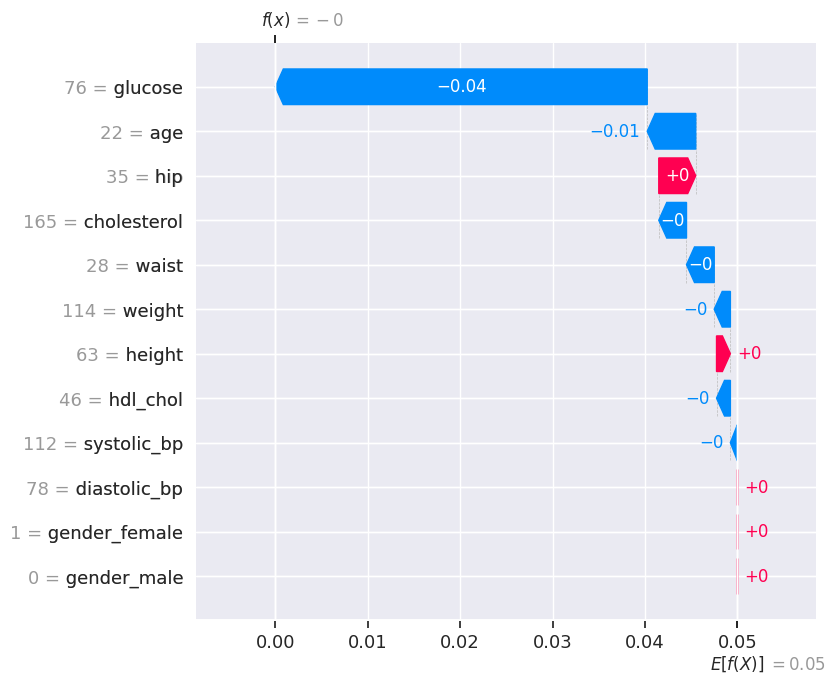

In [231]:
# Waterfall plot for linear model
shap.plots.waterfall(linear_shap_values[sample_ind], max_display=14)

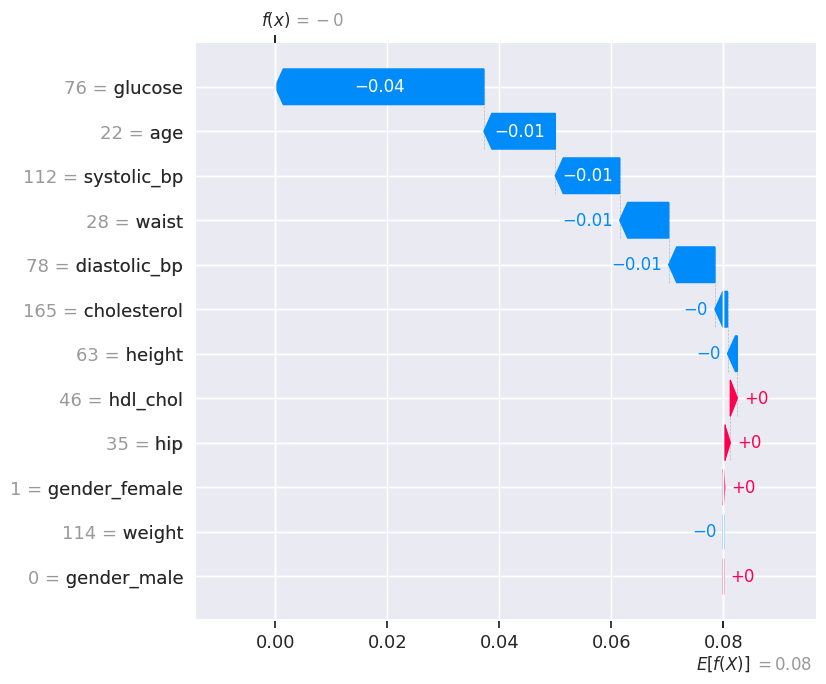

In [232]:
# Waterfall plot for Tree Based Model
shap.plots.waterfall(tree_shap_values[sample_ind], max_display=14)

## **Interpret the summary plot for the Linear and Tree-based model**

Here, the features are ranked from most important to least important. This is among the simplest methods for determining how an ML model's attributes are affecting the target and to what degree.

1. Each red and blue dot indicates a characteristic of a diabetes.
2. Red denotes higher numbers, whereas blue denotes lower values.
3. A diabetes feature has a positive impact if it is on the right side of the y-axis, and a negative impact if it is on the left side of the axis.
4. The distance a dot is from the axis, the more of an influence it has. The intensity is represented by the position of the dot on the x-axis.

This visualization is quite helpful for understanding how our model is operating.

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


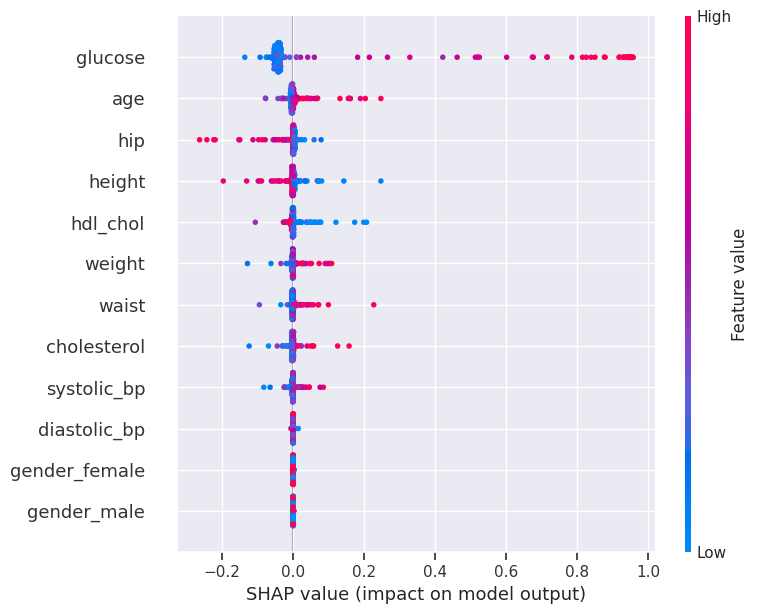

In [233]:
# SHAP summary for Linear Model
shap.summary_plot(linear_shap_values, X_train)

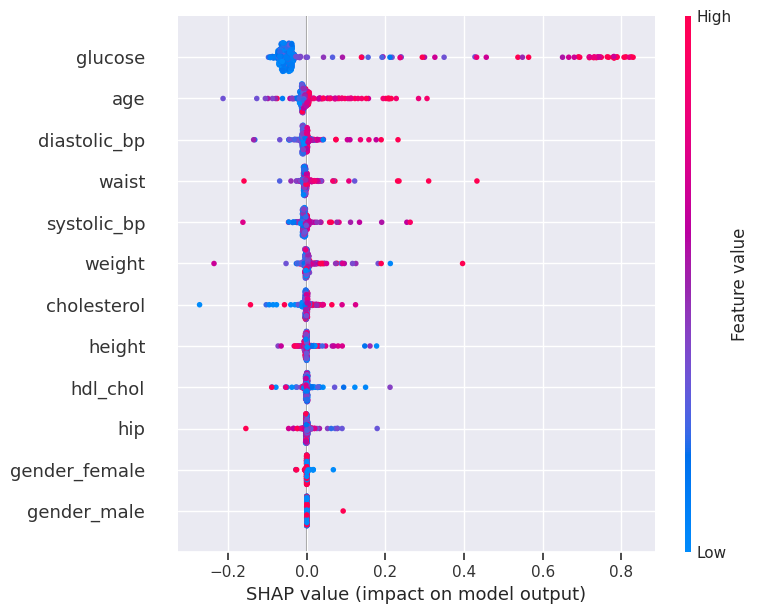

In [234]:
# SHAP summary for Tree Based Model
shap.summary_plot(tree_shap_values, X_train)

# **Understanding the linear and tree-based SHAP dependency plots**

The SHAP dependence plot displays the small impact one or two features have on a machine learning model's anticipated result. It indicates if there is a linear, monotonic, or complicated relationship between the target and a feature. Let's analyze the SHAP dependence graphic to interpret the linear and tree-based models. Each patient in our dataset is represented by a dot in this set of graphs.

1. As can be seen, there is non linear relationship between the linear model feature and its SHAP value. Glucose particularly follows a sigmoidal curve with upward steeping slope.

2. The relationship between a feature's SHAP value and its tree-based model is no longer linear. Now that they are taking the interaction effects into account, we can observe that the SHAP dependence plot no longer exactly matches the partial dependence plot. We lose all the high order interactions (ands and ors) in the model that our model may be doing if we look at the PDP.

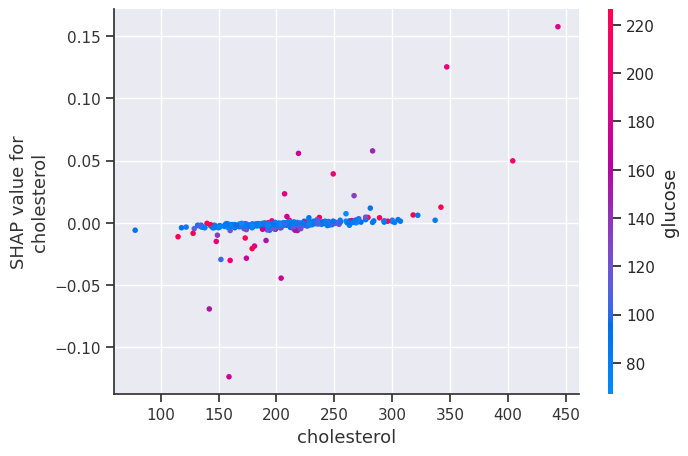

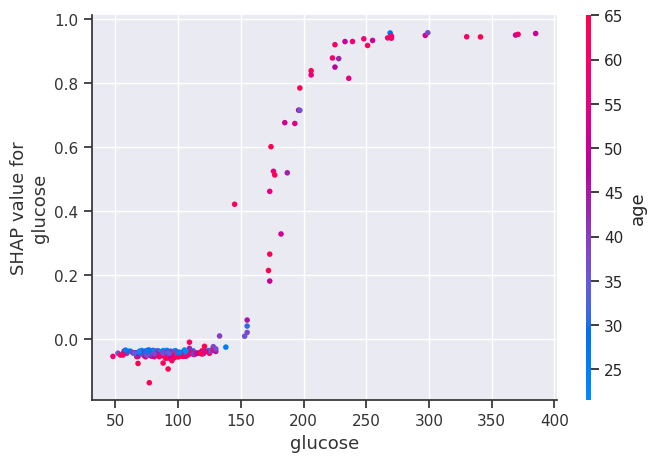

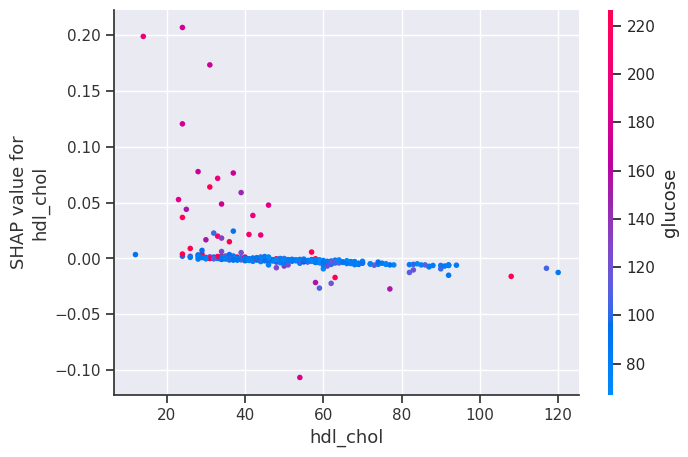

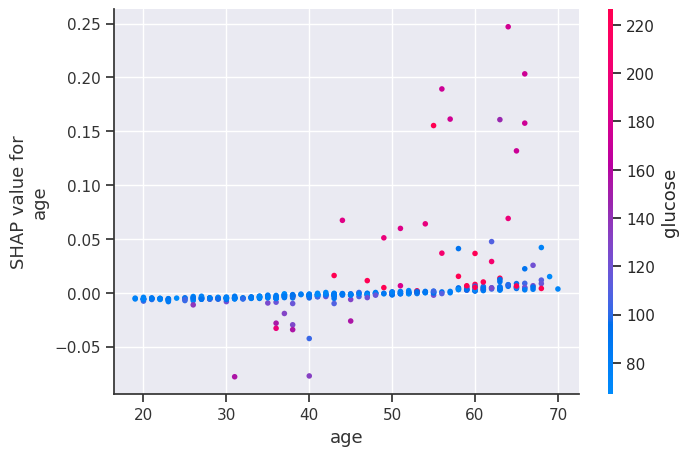

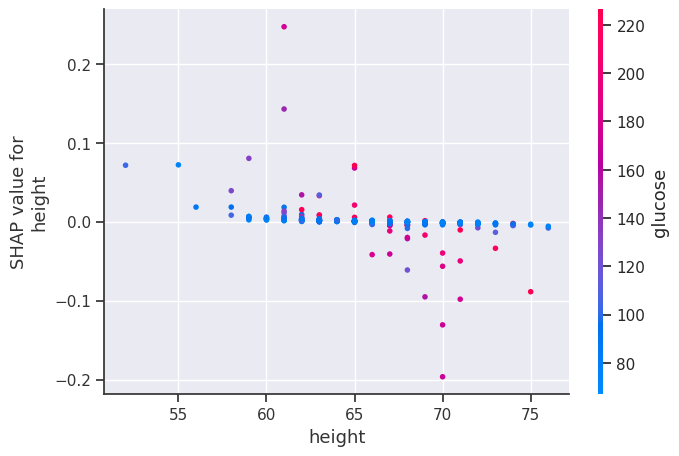

...

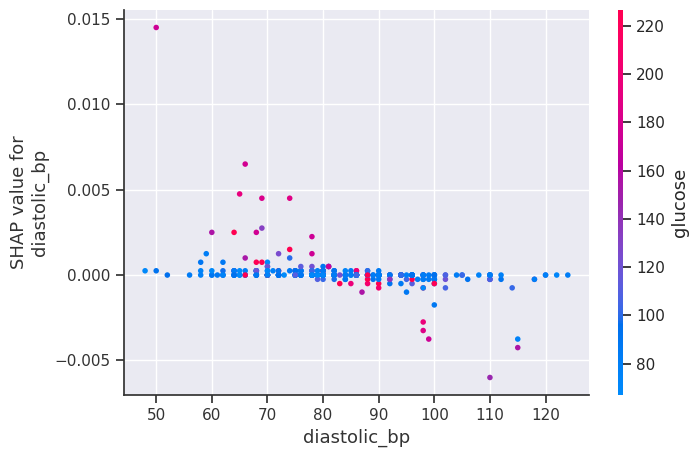

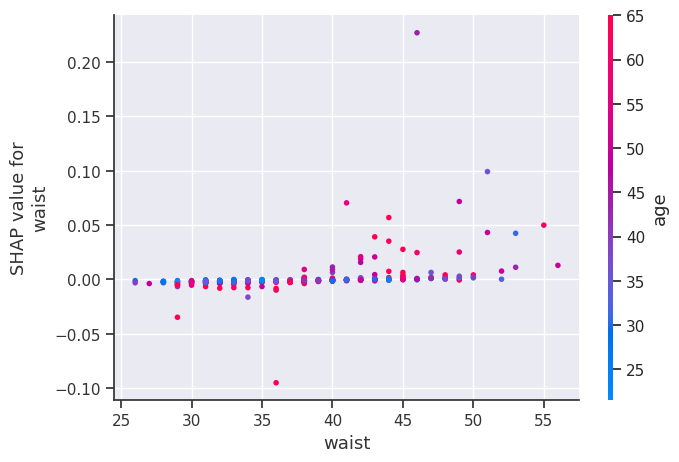

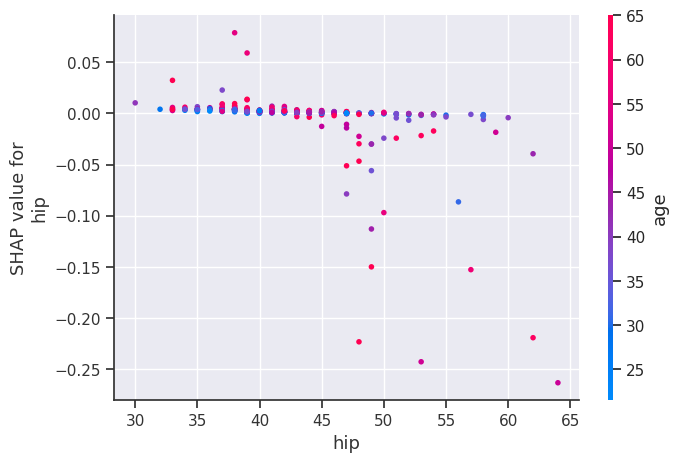

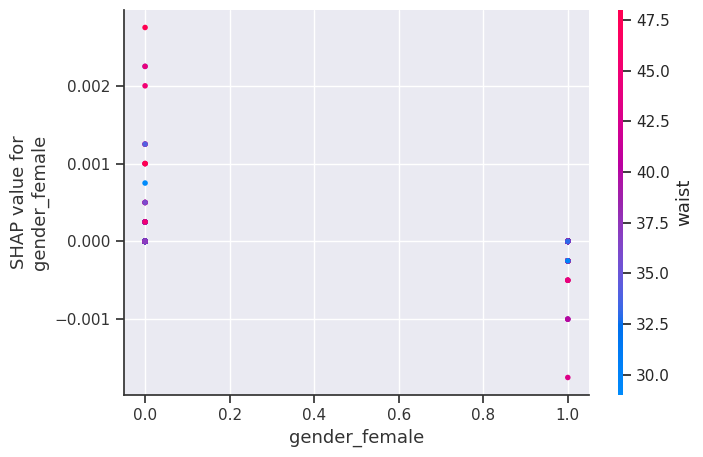

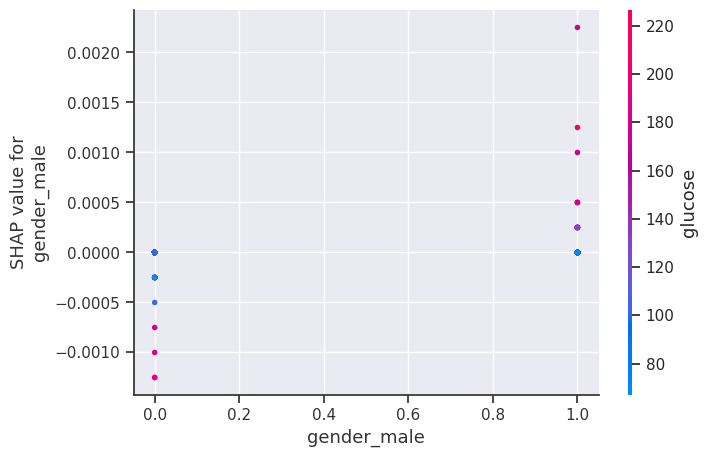

In [235]:
# SHAP partial dependence plot for linear model
for i in X_train.columns:
    shap.dependence_plot(i, linear_shap_values.values, X_train)

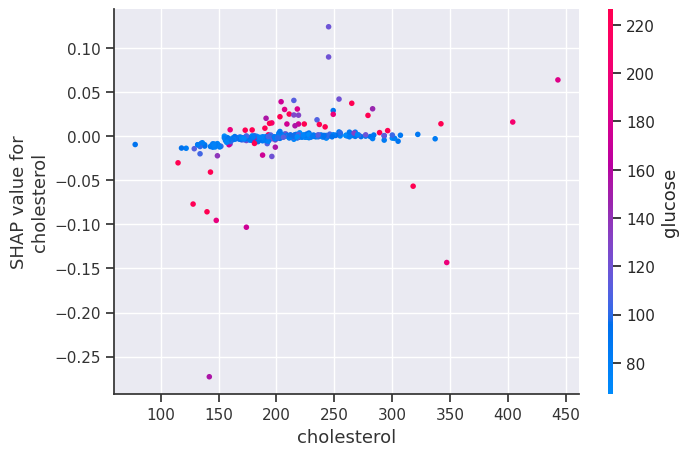

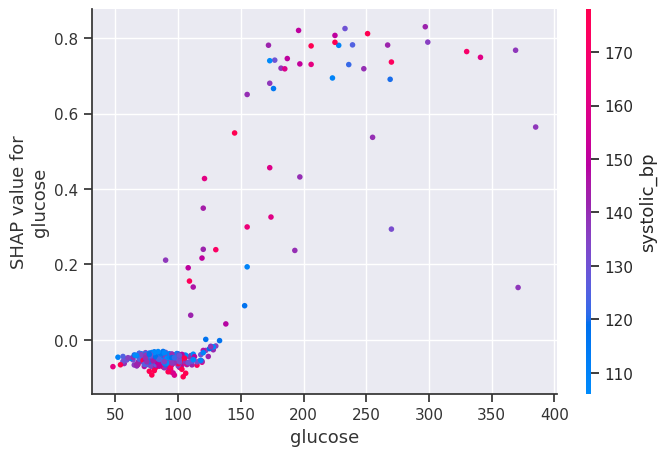

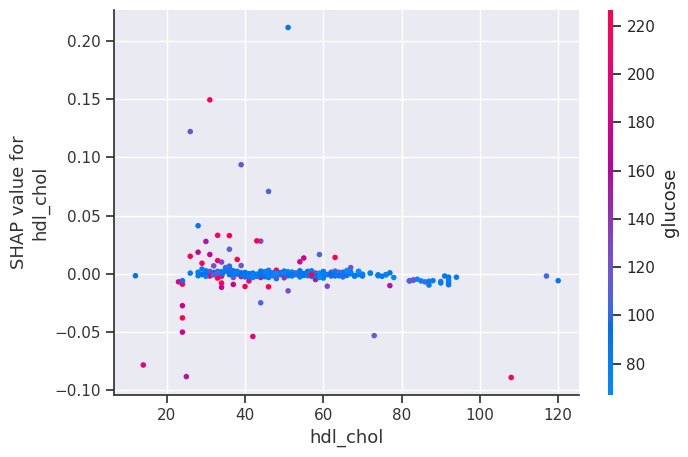

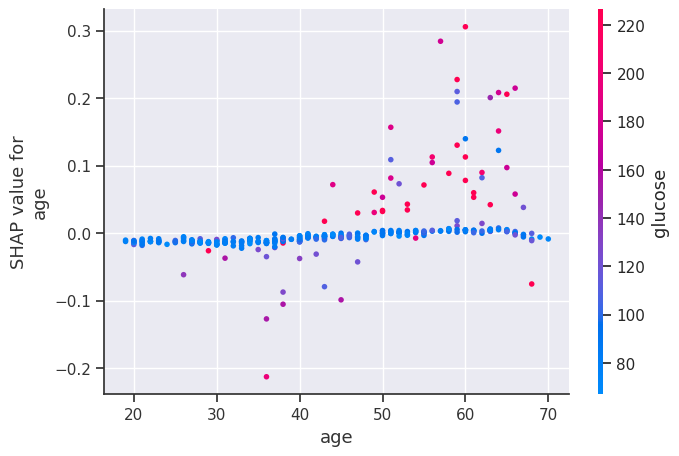

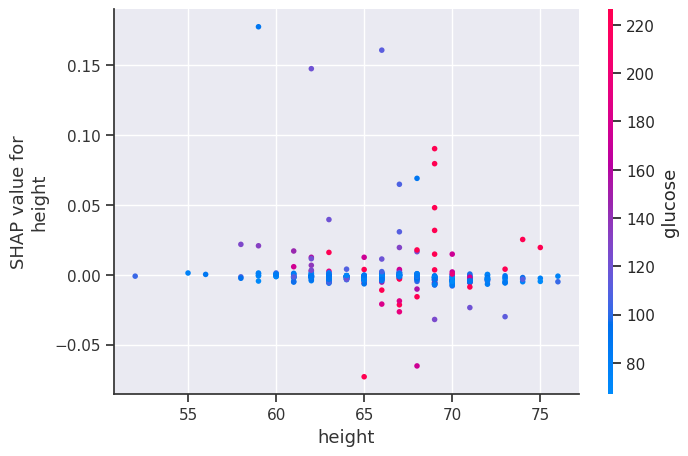

...

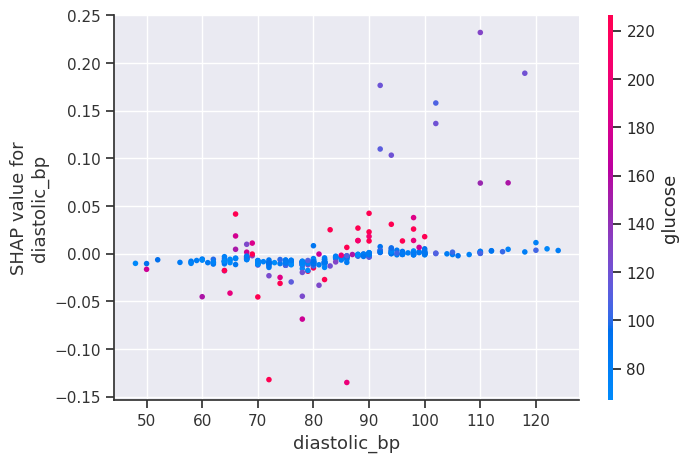

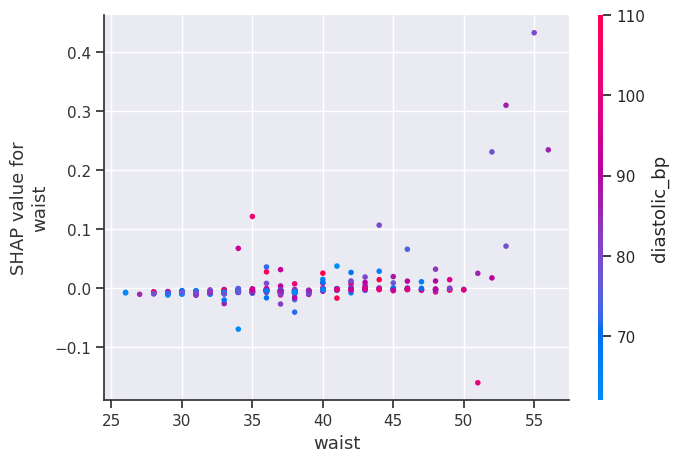

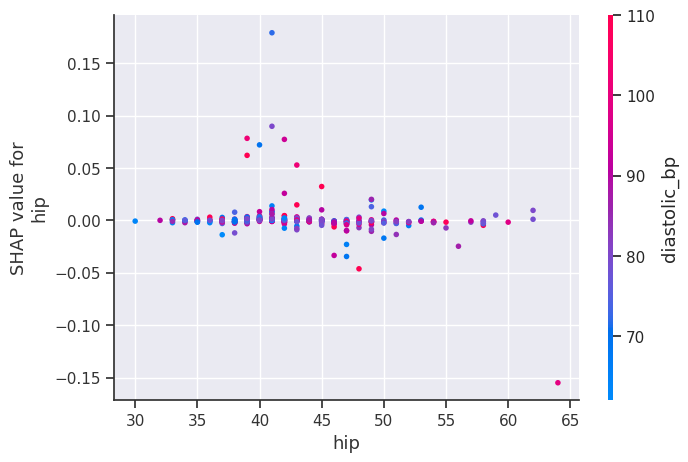

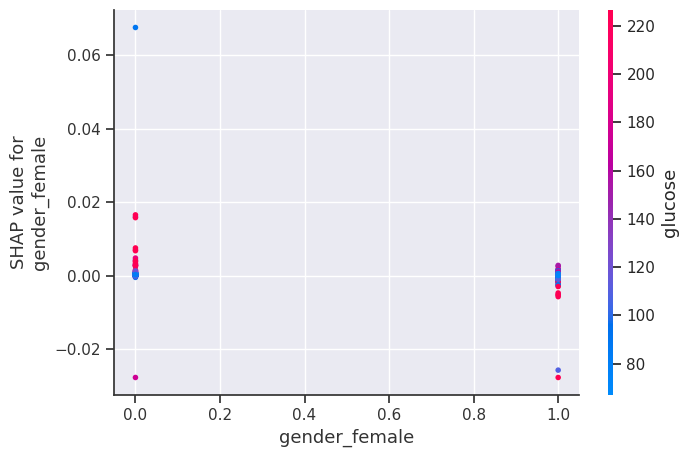

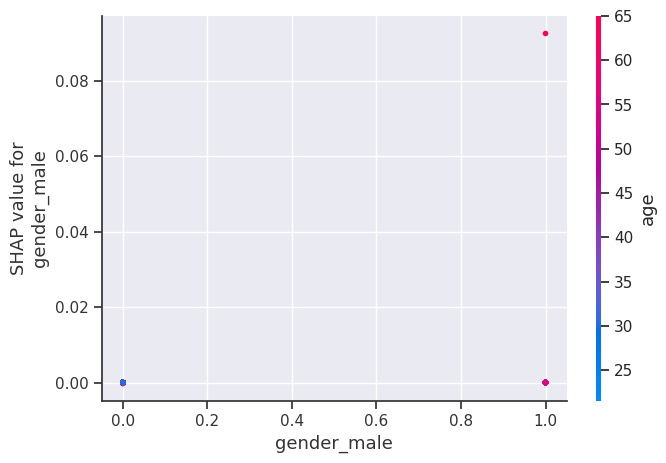

In [236]:
# SHAP partial dependence plot for a tree based model
for i in X_train.columns:
    shap.dependence_plot(i, tree_shap_values.values, X_train)

# **Heatmap Visualization for Linear and Tree-based model**

A summary of the complete dataset's effects on the target for each data point in each feature is shown in this visualization (Diabetes).

Here, the X-axis represents instances of that feature, while the Y-axis is features.
3. The instance's color indicates whether it had a favorable or unfavorable impact. If the instance is red, then the effect was positive; if it is blue, then the effect was negative.
4. The intensity of the color and the intensity of the effect are inversely correlated. The more powerful the feature, the deeper the hue.

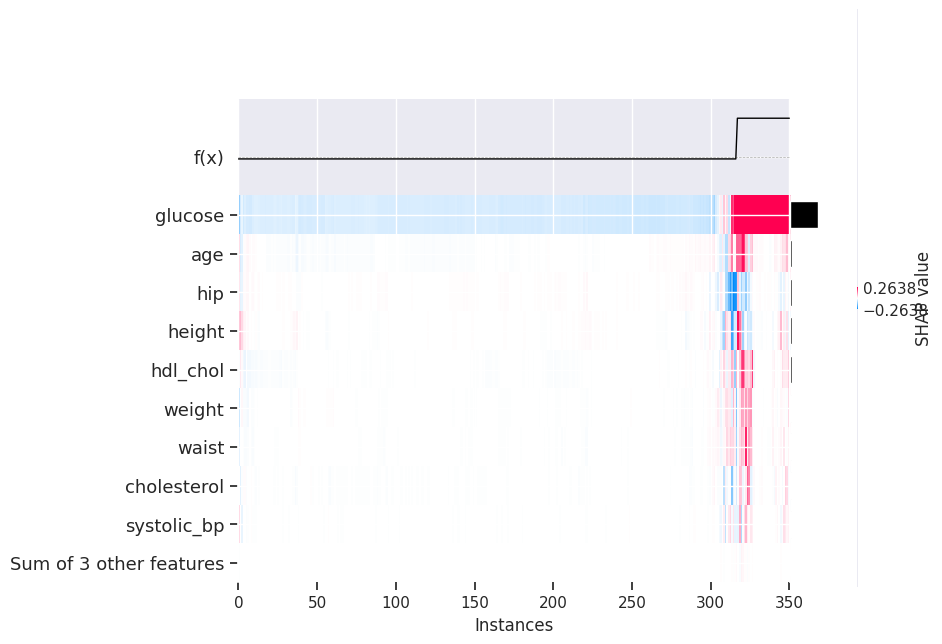

In [237]:
shap.plots.heatmap(linear_shap_values)  # SHAP heatmap for a Linear Model

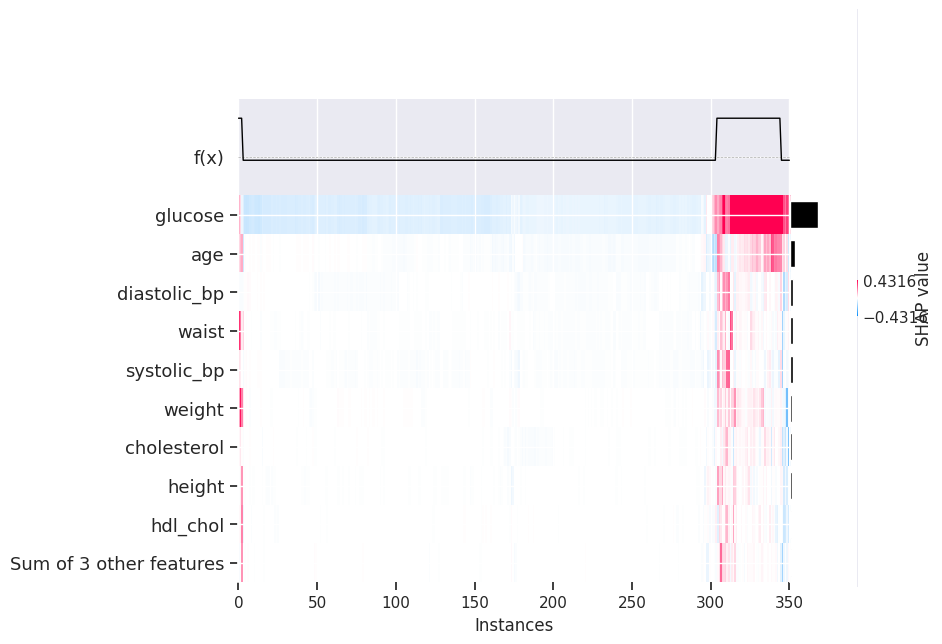

In [238]:
shap.plots.heatmap(tree_shap_values)  # SHAP HeatMap of a Tree Based Model

# **PDP for Linear and Tree Based Models**

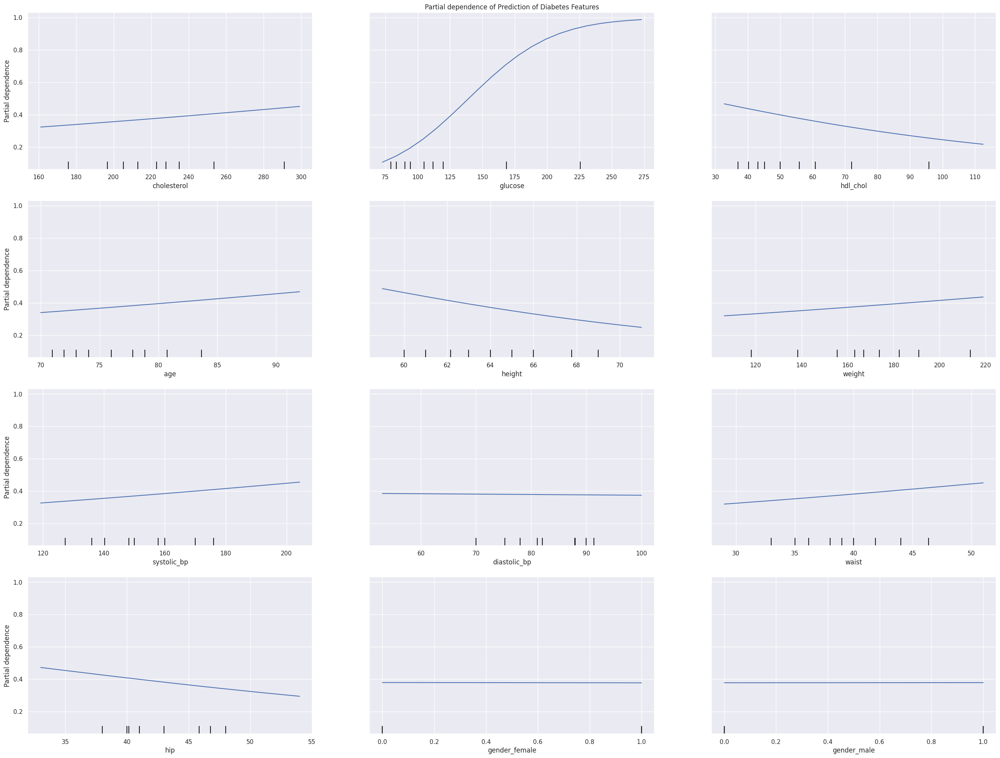

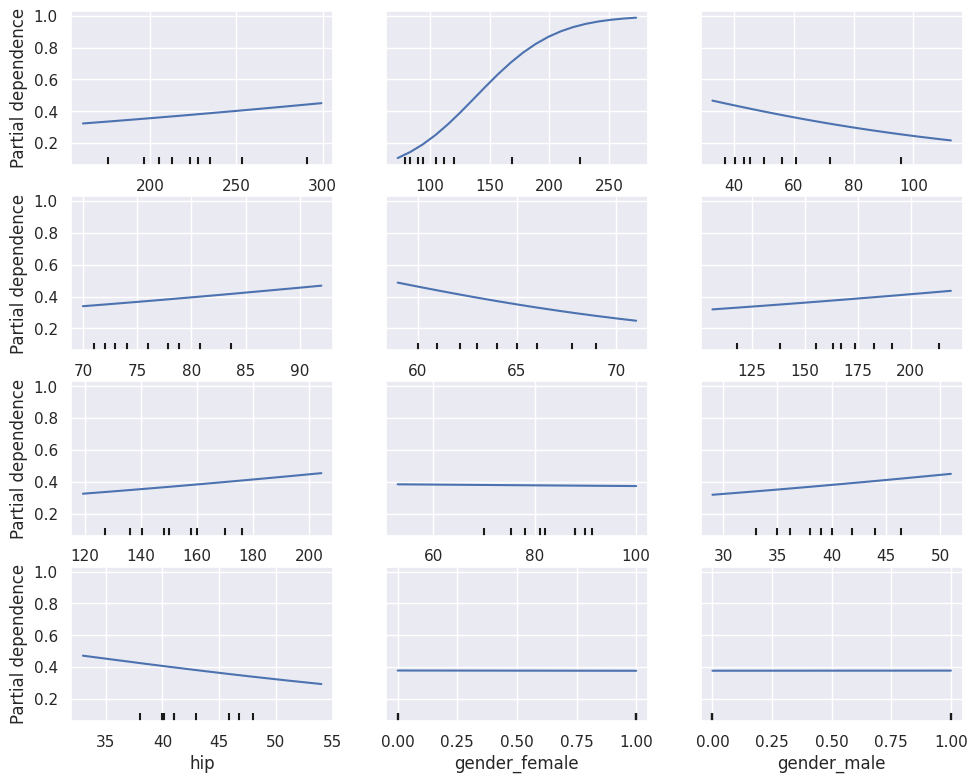

In [239]:
# PDP Plot for Linear Model
fig, ax = plt.subplots(figsize=(32, 24))
display = PartialDependenceDisplay.from_estimator(regr, X_test, X_test.columns, n_jobs=3, grid_resolution=20)
display.plot(ax=ax)
ax.set_title("Partial dependence of Prediction of Diabetes Features")
plt.tight_layout()
plt.show()

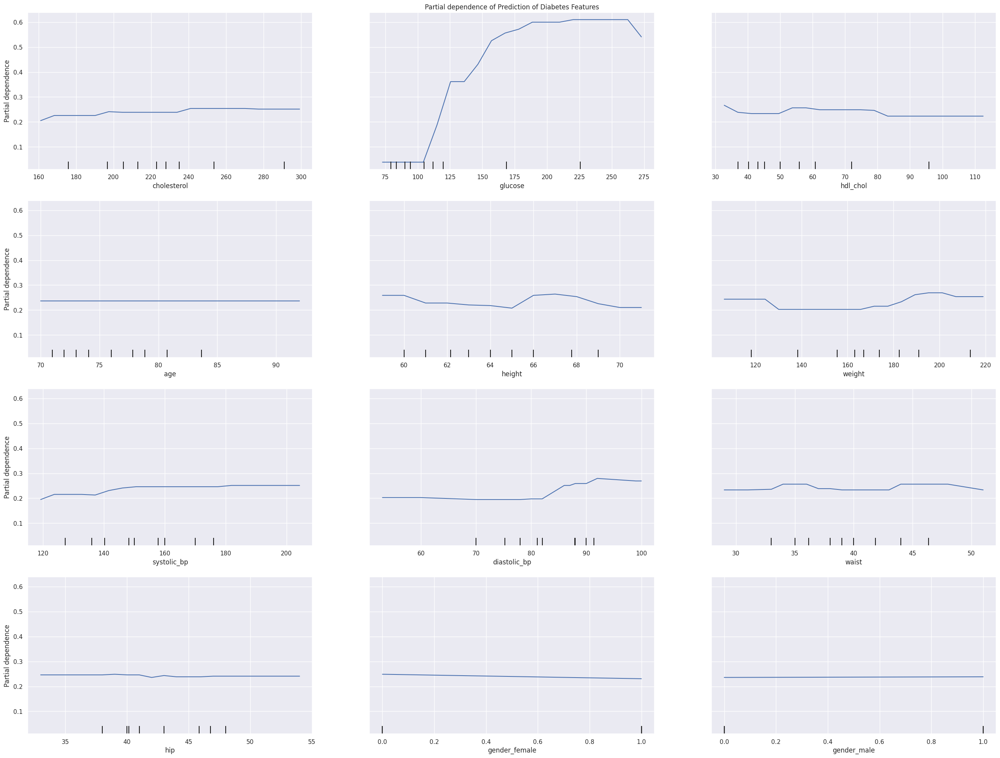

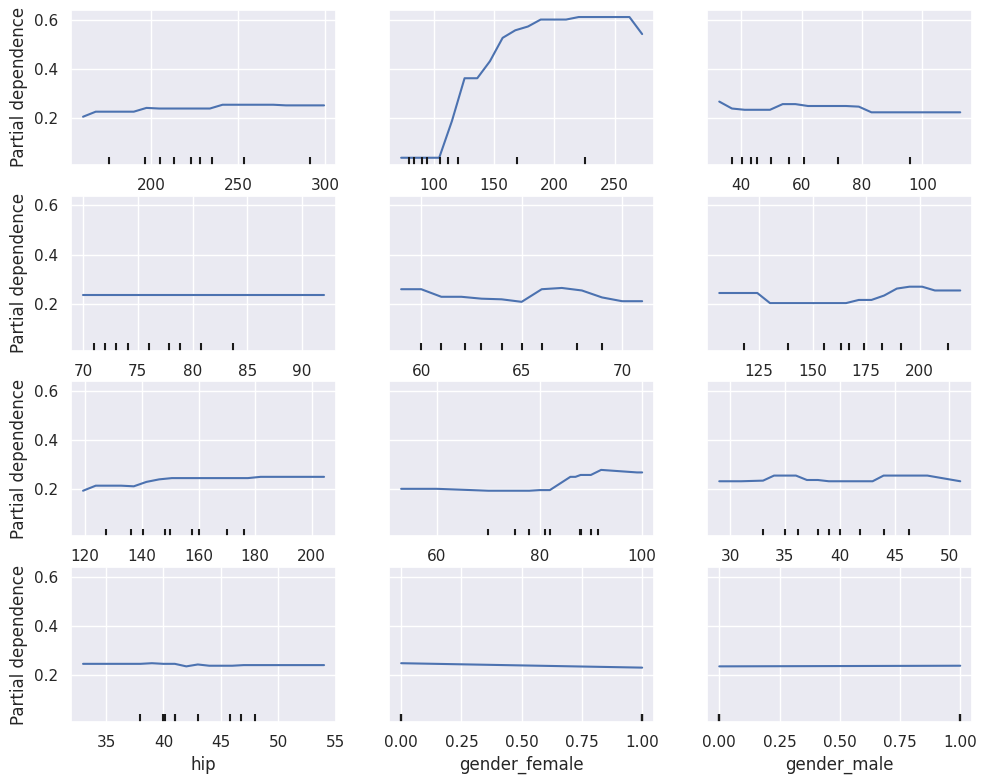

In [240]:
# PDP Plot for Tree Based Model
fig, ax = plt.subplots(figsize=(32, 24))
display = PartialDependenceDisplay.from_estimator(rf_model, X_test, X_test.columns, n_jobs=3, grid_resolution=20)
display.plot(ax=ax)
ax.set_title("Partial dependence of Prediction of Diabetes Features")
plt.tight_layout()
plt.show()

# **PDP Explanation for Linear and Tree based Model**

The plot displays the correlation between each feature and the projected likelihood of acquiring diabetes while maintaining the average values of all other features. The figure displays the estimated marginal impact of each attribute on the expected likelihood of having diabetes.

Each plot's y-axis shows the feature's partial reliance on the anticipated likelihood of having diabetes, while the x-axis shows the feature's range of values. The line's shaded area around it denotes the calculated partial dependence's 95% confidence interval.

The association between each trait and the anticipated likelihood of having diabetes can be determined using the PDP plot. For instance, if the plot indicates that possessing a given feature at higher levels is linked to a higher likelihood of having diabetes, this information might shed light on the risk factors for diabetes and help to direct actions or treatments.

# **Conclusion**

The best model for this assignment is the AutoML's best model with its hyperparameters set since it has the highest accuracy when compared to the other models examined in this exercise. Additionally, we can truly understand the underlying causes of this prediction because this model is interpretible.

---

* I gained knowledge of the entire data science project lifecycle, starting with data preparation and ending with hyperparameter tweaking.
* The majority of the time should be used for data preparation, including cleaning, normalizing, choosing features, and imputation, among other things.
* After data preparation, hyperparameter tuning is the second-most crucial step, which the majority of practitioners overlook. However, the outcome justifies the time spent.
* The best models should be chosen to be deployed after multiple models have been trained, as certain algorithms perform significantly better than others on certain tasks.
* The assignment series' Model Interpretation (Unboxing the Black Blox) is the one that offers the most valuable lessons. Understanding what caused a model to accurately forecast a result has been made simpler by SHAP, LIME, and PDP.



# **References**

*   Molnar, C. (2022). Interpretable Machine Learning: A Guide for Making Black Box Models Explainable (2nd ed.)
christophm.github.io/interpretable-ml-book/
*   https://towardsdatascience.com/explain-your-model-with-the-shap-values-bc36aac4de3d

*   https://medium.com/@kalia_65609/interpreting-an-nlp-model-with-lime-and-shap-834ccfa124e4#:~:text=Unlike%20LIME%2C%20SHAP%20does%20not,to%20calculate%20the%20feature%20importance.

*   https://scikit-learn.org/stable/modules/generated/sklearn.inspection.PartialDependenceDisplay.html

*   https://shap.readthedocs.io/en/latest/api.html

*   Professor's Notebook: 
1. https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/Model_Interpretability/SHAP%20and%20LIME%20analysis%20Walkthrough.ipynb
2. https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/Full_ML_Report/Wine-Quality-Analysis.ipynb











# **License**

**MIT License**

Copyright (c) 2023 Shreyas Dasari

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.